# Final Project - Bank Marketing Campaign Prediction

****
## **1. Business Understanding (Pemahaman Bisnis)**
****

**Tujuan** : Menjelaskan permasalahan bisnis yang dihadapi bank dalam kampanye telemarketing deposito berjangka, konteks kampanye tersebut, serta bagaimana analisis data dapat membantu bank mengurangi biaya dan meningkatkan efektivitas strategi pemasaran.

****
### 1.1 Context
****
- Dataset : **Bank Marketing Dataset (UCI Repository)**, berasal dari kampanye telemarketing deposito berjangka di **Portugal (Mei 2008 – Nov 2010)**, berisi **41.188 baris** & **20 fitur** + **1 target**. Satu baris = satu panggilan telemarketing.
- Conversion Rate (CVR) = persentase nasabah yang setuju berlangganan (target`y`=yes) dari total panggilan.
    - Hasil historis : **11,3% (4.640 dari 41.188 panggilan)** → baseline CVR.
    - Artinya dari 100 panggilan hanya 11 yang berhasil, sisanya gagal.
- Implikasi bisnis :
    - **Biaya operasional tinggi** → banyak panggilan sia-sia (gaji agen, biaya telekomunikasi).
    - **Efektivitas rendah** → rasio keberhasilan hanya 1:9.
    - **Risiko kehilangan peluang** → nasabah potensial bisa lolos tanpa teridentifikasi.
- Relevansi CVR untuk proyek ini :
    - Menjadi baseline keberhasilan bisnis yang harus ditingkatkan.
    - Model prediktif bertujuan meningkatkan CVR dengan menargetkan nasabah yang tepat.
    - Jika bank fokus pada segmen dengan prediksi tertinggi, CVR bisa naik signifikan → biaya turun, pendapatan naik.
- Stakeholder utama : **manajemen bank** yang ingin menekan biaya call center dan memaksimalkan konversi.
- Peran **Data Scientist** : membangun solusi berbasis data agar strategi pemasaran lebih tepat sasaran dan efisien.

****
### 1.2 Pernyataan Masalah (Problem Statement)
****
- Bank menghadapi **tingkat konversi (CVR) rendah, hanya sekitar 11%**, sehingga banyak panggilan telemarketing yang tidak efektif. Hal ini berdampak pada biaya operasional tinggi dan tingkat keberhasilan kampanye yang tidak optimal.
- Permasalahan utamanya adalah :
    - Bagaimana **mengurangi panggilan yang tidak produktif** untuk menekan biaya operasional ?
    - Bagaimana **meningkatkan CVR di atas baseline historis (~11%)**, sehingga kampanye telemarketing lebih efisien dan berdampak positif pada pendapatan bank ?

****
### 1.3 Tujuan (Goals)
****
- **Mengurangi biaya operasional** dengan meminimalkan panggilan telemarketing yang tidak menghasilkan konversi.
- **Meningkatkan CVR dari baseline historis (~11%)** agar lebih tinggi dibandingkan rata-rata kampanye sebelumnya.
- **Meningkatkan pendapatan bank** melalui bertambahnya jumlah nasabah yang berlangganan deposito berjangka.
- Memberikan **dukungan keputusan berbasis data** kepada manajemen dalam merancang strategi pemasaran yang lebih tepat sasaran.

****
### 1.4 Pendekatan Analisis (Analytic Approach)
****
- **Eksplorasi & Pembersihan Data** : Mengecek tipe variabel (numerik/kategorikal), mendeteksi data hilang, duplikat, dan pencilan, serta memahami distribusi target.
- **Pra-pemrosesan & Penyeimbangan Data** : Encoding untuk variabel kategorikal, scaling pada variabel numerik bila perlu, serta menangani ketidakseimbangan target menggunakan metode seperti SMOTE.
- **Pemilihan Fitur** : Mengidentifikasi fitur yang paling relevan menggunakan analisis korelasi atau metode berbasis model seperti Recursive Feature Elimination (RFE).
- **Pembangunan Model** : Menguji beberapa algoritma klasifikasi (misalnya Logistic Regression, Random Forest, Gradient Boosting, XGBoost) untuk membandingkan performa prediksi.
- **Evaluasi** : Menggunakan cross-validation dengan metrik evaluasi yang dijelaskan pada bagian Evaluation Matrix.
- **Interpretasi & Rekomendasi** : Menganalisis fitur paling berpengaruh dan menyusun rekomendasi strategi pemasaran berbasis data agar kampanye lebih efisien.

****
### 1.5 Evaluation Matrix
****
| Prediksi / Aktual | **Nasabah Setuju (Yes)**                                                                                                           | **Nasabah Tidak Setuju (No)**                                                                                                  |
| ----------------- | ---------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------ |
| **Prediksi Yes**  | **True Positive (TP):** Nasabah diprediksi akan setuju, dan benar-benar setuju. <br>→ Keberhasilan targeting.                      | **False Positive (FP):** Nasabah diprediksi akan setuju, tapi ternyata menolak. <br>→ Panggilan salah sasaran, menambah biaya. |
| **Prediksi No**   | **False Negative (FN):** Nasabah diprediksi tidak setuju, tapi ternyata sebenarnya setuju. <br>→ Peluang menerima Kampanye hilang. | **True Negative (TN):** Nasabah diprediksi tidak setuju, dan memang menolak. <br>→ Menghindari panggilan tidak produktif.      |


- Metrik utama adalah recall, karena tujuan bisnis adalah menghindari terlewatnya nasabah potensial (meminimalkan FN). Precision digunakan sebagai pendukung untuk menilai ketepatan targeting, ROC-AUC menilai performa keseluruhan, sedangkan accuracy dan F1-score dilaporkan sebagai informasi tambahan.

****
### 1.6 Batasan Masalah (Limitasi)
****
- Dataset hanya berasal dari satu bank di Portugal pada periode 2008–2010, sehingga hasil analisis mungkin tidak mewakili konteks industri saat ini.
- Data hanya mencakup interaksi telemarketing via telepon; faktor eksternal lain (misalnya channel digital, kondisi regulasi terbaru) tidak tersedia.
- Fitur `duration` sangat berpengaruh tetapi merupakan **leakage feature**, karena nilainya baru diketahui setelah panggilan berlangsung. Untuk prediksi real-time, fitur ini tidak dapat digunakan.
- Analisis terbatas pada data tabular. fitur perilaku nasabah lain di luar kampanye ini tidak tercakup.

****
## **2. Data Understanding**
****
Dataset berisi 41.188 baris dan 21 kolom yang mencakup informasi demografi nasabah, kondisi ekonomi, serta data historis kampanye.

- Struktur Kolom Utama :
    - Demografi nasabah: `age`, `job`, `marital`, `education`
    - Sosial nasabah: `housing`, `loan`, `default`
    - Detail kampanye: `contact`, `month`, `day_of_week`, `duration`, `campaign`, `pdays`, `previous`, `poutcome`
    - Indikator makro ekonomi: `emp.var.rate`, `cons.price.idx`, `cons.conf.idx`, `euribor3m`, `nr.employed`
    - Target (label): y → apakah nasabah berlangganan deposito (`yes`/`no`)

****
### 2.1 Import Library
****

In [170]:
import numpy as np
import pandas as pd

# Visualisasi
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning - Data Preparation & Modeling
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    classification_report, confusion_matrix, roc_auc_score, average_precision_score,
    precision_recall_curve, RocCurveDisplay, PrecisionRecallDisplay
)
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.inspection import permutation_importance

# Handling imbalance
from imblearn.over_sampling import SMOTE  
from imblearn.pipeline import Pipeline as ImbPipeline

# Crosstab summary
from itertools import combinations

# Setting
pd.set_option("display.max_columns", 200)
plt.style.use('seaborn-v0_8')

****
### 2.2 Load Dataset
****

In [171]:
df = pd.read_csv("bank-additional-full.csv", sep=';')
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


****
### 2.3 Numerical, Categorical, and Target Features
****

| No | **Numerical Features Name** | **Description**                                            |
| -- | --------------------------- | ---------------------------------------------------------- |
| 1  | `age`                       | Usia nasabah                                               |
| 2  | `duration`                  | Lama kontak terakhir dalam detik                           |
| 3  | `campaign`                  | Jumlah kontak selama kampanye ini                          |
| 4  | `pdays`                     | Hari sejak nasabah terakhir dihubungi (999 = tidak pernah) |
| 5  | `previous`                  | Jumlah kontak sebelumnya                                   |
| 6  | `emp.var.rate`              | Tingkat variabel pekerjaan (indikator ekonomi)             |
| 7  | `cons.price.idx`            | Indeks harga konsumen                                      |
| 8  | `cons.conf.idx`             | Indeks kepercayaan konsumen                                |
| 9  | `euribor3m`                 | Tingkat suku bunga EURIBOR 3 bulan                         |
| 10 | `nr.employed`               | Jumlah tenaga kerja                                        |

<br>
<br>

| No | **Categorical Features Name** | **Description**                             |
| -- | ----------------------------- | ------------------------------------------- |
| 1  | `job`                         | Jenis pekerjaan nasabah                     |
| 2  | `marital`                     | Status pernikahan                           |
| 3  | `education`                   | Tingkat pendidikan                          |
| 4  | `default`                     | Apakah nasabah memiliki kredit macet        |
| 5  | `housing`                     | Apakah nasabah memiliki kredit rumah        |
| 6  | `loan`                        | Apakah nasabah memiliki pinjaman pribadi    |
| 7  | `contact`                     | Jenis media komunikasi (cellular/telephone) |
| 8  | `month`                       | Bulan terakhir dihubungi                    |
| 9  | `day_of_week`                 | Hari terakhir dihubungi                     |
| 10 | `poutcome`                    | Hasil kampanye pemasaran sebelumnya         |

<br>
<br>

| **Target Feature** | **Description**                                             |
| ------------------ | ----------------------------------------------------------- |
| `y`                | Apakah nasabah berlangganan deposito berjangka (`yes`/`no`) |

****
### 2.4 Data Summary
****

In [172]:
# dataframe information
print(f'Total Rows           :', df.shape[0])
print(f'Total Columns        :', df.shape[1])

print('-----------------------------\nData Types Count     :')
print(df.dtypes.value_counts())

# Membuat summary dataframe
def format_percentage(value):
    return f"{value:.2f}%"

pd.DataFrame({
    'Features': df.columns.values,
    'Data Type': df.dtypes.values,
    'Data Count': df.count().values,
    'Negative Value Count': [(df[col] < 0).sum() if df[col].dtype in [int, float] else 0 for col in df.columns],
    'Negative Value Percentage': [format_percentage((df[col] < 0).sum() / len(df) * 100) if df[col].dtype in [int, float] else '0.00%' for col in df.columns],
    'Null Value Count': df.isnull().sum().values,
    'Null Value Percentage': [format_percentage(val / len(df) * 100) for val in df.isnull().sum().values],
    'Number of Unique Value': df.nunique().values,
    'Unique Value': [df[col].unique() for col in df.columns]
})

Total Rows           : 41188
Total Columns        : 21
-----------------------------
Data Types Count     :
object     11
int64       5
float64     5
Name: count, dtype: int64


,Features,Data Type,Data Count,Negative Value Count,Negative Value Percentage,Null Value Count,Null Value Percentage,Number of Unique Value,Unique Value
0,age,int64,41188,0,0.00%,0,0.00%,78,"[56, 57, 37, 40, 45, 59, 41, 24, 25, 29, 35, 5..."
1,job,object,41188,0,0.00%,0,0.00%,12,"[housemaid, services, admin., blue-collar, tec..."
2,marital,object,41188,0,0.00%,0,0.00%,4,"[married, single, divorced, unknown]"
3,education,object,41188,0,0.00%,0,0.00%,8,"[basic.4y, high.school, basic.6y, basic.9y, pr..."
4,default,object,41188,0,0.00%,0,0.00%,3,"[no, unknown, yes]"
5,housing,object,41188,0,0.00%,0,0.00%,3,"[no, yes, unknown]"
6,loan,object,41188,0,0.00%,0,0.00%,3,"[no, yes, unknown]"
7,contact,object,41188,0,0.00%,0,0.00%,2,"[telephone, cellular]"
8,month,object,41188,0,0.00%,0,0.00%,10,"[may, jun, jul, aug, oct, nov, dec, mar, apr, ..."
9,day_of_week,object,41188,0,0.00%,0,0.00%,5,"[mon, tue, wed, thu, fri]"


****
### 2.5 Statistical Description for Numerical and Categorical Features
****

- Tujuan :
    - Memberikan gambaran statistik dasar untuk setiap fitur.
    - Membantu memahami distribusi data numerik dan kategorikal.
    - Mendeteksi adanya nilai outlier atau distribusi yang tidak wajar.

> ### Numerical

In [173]:
# Statistik deskriptif untuk fitur numerik
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41188.0,40.024060,10.421250,17.000,32.000,38.000,47.000,98.000
duration,41188.0,258.285010,259.279249,0.000,102.000,180.000,319.000,4918.000
campaign,41188.0,2.567593,2.770014,1.000,1.000,2.000,3.000,56.000
pdays,41188.0,962.475454,186.910907,0.000,999.000,999.000,999.000,999.000
previous,41188.0,0.172963,0.494901,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41188.0,0.081886,1.570960,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41188.0,93.575664,0.578840,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41188.0,-40.502600,4.628198,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41188.0,3.621291,1.734447,0.634,1.344,4.857,4.961,5.045
nr.employed,41188.0,5167.035911,72.251528,4963.600,5099.100,5191.000,5228.100,5228.100


- Keterangan output :
    - count → jumlah data valid (tidak termasuk missing value)
    - mean → rata-rata
    - std → standar deviasi (ukuran penyebaran data)
    - min / max → nilai minimum & maksimum
    - 25%, 50%, 75% → kuartil distribusi data
    - max → nilai terbesar

> ### Categorical

In [174]:
# Statistik deskriptif untuk fitur kategorikal
df.describe(include=['object']).T

,count,unique,top,freq
job,41188,12,admin.,10422
marital,41188,4,married,24928
education,41188,8,university.degree,12168
default,41188,3,no,32588
housing,41188,3,yes,21576
loan,41188,3,no,33950
contact,41188,2,cellular,26144
month,41188,10,may,13769
day_of_week,41188,5,thu,8623
poutcome,41188,3,nonexistent,35563


- Keterangan output :
    - count → jumlah data valid
    - unique → jumlah kategori unik
    - top → kategori yang paling sering muncul
    - freq → jumlah kemunculan kategori teratas

****
### 2.6 Missing Values
****

In [175]:
# Mengecek jumlah missing value di setiap kolom
missing_values = df.isna().sum()
print(missing_values)

# Menampilkan persentase missing value di setiap kolom
missing_percentage = df.isna().sum() / len(df) * 100
print(f'\nPersentase missing values (%) :\n{missing_percentage}')

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

Persentase missing values (%) :
age               0.0
job               0.0
marital           0.0
education         0.0
default           0.0
housing           0.0
loan              0.0
contact           0.0
month             0.0
day_of_week       0.0
duration          0.0
campaign          0.0
pdays             0.0
previous          0.0
poutcome          0.0
emp.var.rate      0.0
cons.price.idx    0.0
cons.conf.idx     0.0
euribor3m         0.0
nr.employed       0.0
y                 0.0
dtype: float64


****
### 2.7 Data Duplicates
****

In [176]:
# Mengecek jumlah data duplikat
duplicate_count = df.duplicated().sum()
print(f"Jumlah data duplikat : {duplicate_count}")

# Persentase duplikat
dup_percentage = (duplicate_count / len(df)) * 100
print(f"Persentase duplikat : {dup_percentage:.4f}%")

Jumlah data duplikat : 12
Persentase duplikat : 0.0291%


****
### 2.8 Identify Invalid Data
****

- Tujuan :
    - Menemukan data numerik yang tidak logis (misalnya umur negatif, durasi = 0).
    - Mengecek apakah ada kategori aneh/salah ketik pada fitur kategorikal.

> ### Numerical

In [177]:
# Cek nilai tidak wajar pada fitur numerik

# Umur <= 0 atau lebih dari 100 dianggap tidak valid
invalid_age = df[(df['age'] <= 0) | (df['age'] > 100)]

# Durasi kontak <= 0 dianggap tidak valid
invalid_duration = df[df['duration'] <= 0]

# campaign, pdays, previous seharusnya tidak negatif
invalid_campaign = df[df['campaign'] <= 0]
invalid_pdays = df[df['pdays'] < -1]  # -1 biasanya kode "tidak pernah dihubungi"
invalid_previous = df[df['previous'] < 0]

print(f"Invalid Age records       : {len(invalid_age)}")
print(f"Invalid Duration records  : {len(invalid_duration)}")
print(f"Invalid Campaign records  : {len(invalid_campaign)}")
print(f"Invalid Pdays records     : {len(invalid_pdays)}")
print(f"Invalid Previous records  : {len(invalid_previous)}")

Invalid Age records       : 0
Invalid Duration records  : 4
Invalid Campaign records  : 0
Invalid Pdays records     : 0
Invalid Previous records  : 0


> ### Categorical

In [178]:
# Cek kategori unik pada fitur kategorikal
for col in ['job', 'marital', 'education', 'default', 'housing', 'loan',
            'contact', 'month', 'day_of_week', 'poutcome']:
    print(f"\nKolom: {col}")
    print(df[col].unique())


Kolom: job
['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']

Kolom: marital
['married' 'single' 'divorced' 'unknown']

Kolom: education
['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']

Kolom: default
['no' 'unknown' 'yes']

Kolom: housing
['no' 'yes' 'unknown']

Kolom: loan
['no' 'yes' 'unknown']

Kolom: contact
['telephone' 'cellular']

Kolom: month
['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']

Kolom: day_of_week
['mon' 'tue' 'wed' 'thu' 'fri']

Kolom: poutcome
['nonexistent' 'failure' 'success']


***
**Rangkuman**
***

- Dataset ini memiliki :
    - 10 fitur numerik: `age`, `duration`, `campaign`, `pdays`, `previous`, e`mp.var.rate`, `cons.price.idx`, `cons.conf.idx`, `euribor3m`, `nr.employed`
    - 10 fitur kategorikal: `job`, `marital`, `education`, `default`, `housing`, `loan`, `contact`, `month`, `day_of_week`, `poutcome`
    - 1 variabel target: `y` (apakah nasabah berlangganan deposito berjangka).

- Dataset berisi 41.188 baris dan 21 kolom.

- **Fitur Numerik :**
    - `age` → rentang nilai wajar (tidak ada yang ≤0 atau >100).
    - `duration` → ditemukan 4 baris dengan nilai 0 detik, yang tidak realistis untuk durasi kontak → perlu dihapus.
    - `campaign`, `pdays`, `previous` → tidak ditemukan nilai negatif; valid.
    - Indikator makro (`emp.var.rate`, `cons.price.idx`, `cons.conf.idx`, `euribor3m`, `nr.employed`) → semua dalam rentang normal sesuai data ekonomi.

- **Fitur Kategorikal :**
  - Banyak kolom memiliki kategori `"unknown"`, misalnya :
    - `job` → `"unknown"`
    - `marital` → `"unknown"`
    - `education` → `"unknown"`
    - `default`, `housing`, `loan` → `"unknown"`
  - Ini bisa diperlakukan sebagai kategori khusus atau dianggap missing value untuk imputasi.
  - Kolom lain (`contact`, `month`, `day_of_week`, `poutcome`) valid, tidak ada kategori aneh.

- **Missing Values**:
  - Tidak ada nilai NaN secara eksplisit.
  - Namun `"unknown"` pada beberapa fitur berfungsi sebagai proxy missing value.

- **Data Duplicates**:
  - Ditemukan 12 baris duplikat (0,03% dari dataset).
  - Jumlah ini sangat kecil, sehingga aman untuk dihapus agar tidak menimbulkan bias pada model.

- **Invalid Data**:
  - `duration` memiliki 4 baris dengan nilai 0 detik → tidak realistis untuk kontak telepon.
  - Tidak ada nilai tidak logis lain pada fitur numerik.
  - Kategori `"unknown"` pada beberapa kolom perlu diperhatikan lebih lanjut pada tahap preprocessing.

****
### 2.9 Identify Outliers
****
- Pada tahap ini kita ingin mengidentifikasi data pencilan (outlier) baik pada fitur numerik maupun kategorikal. 
- Outlier adalah data yang nilainya jauh menyimpang dari distribusi mayoritas. Kehadiran outlier bisa memengaruhi performa model machine learning, terutama model berbasis jarak atau distribusi.

****
#### 2.9.1 Numerical
****

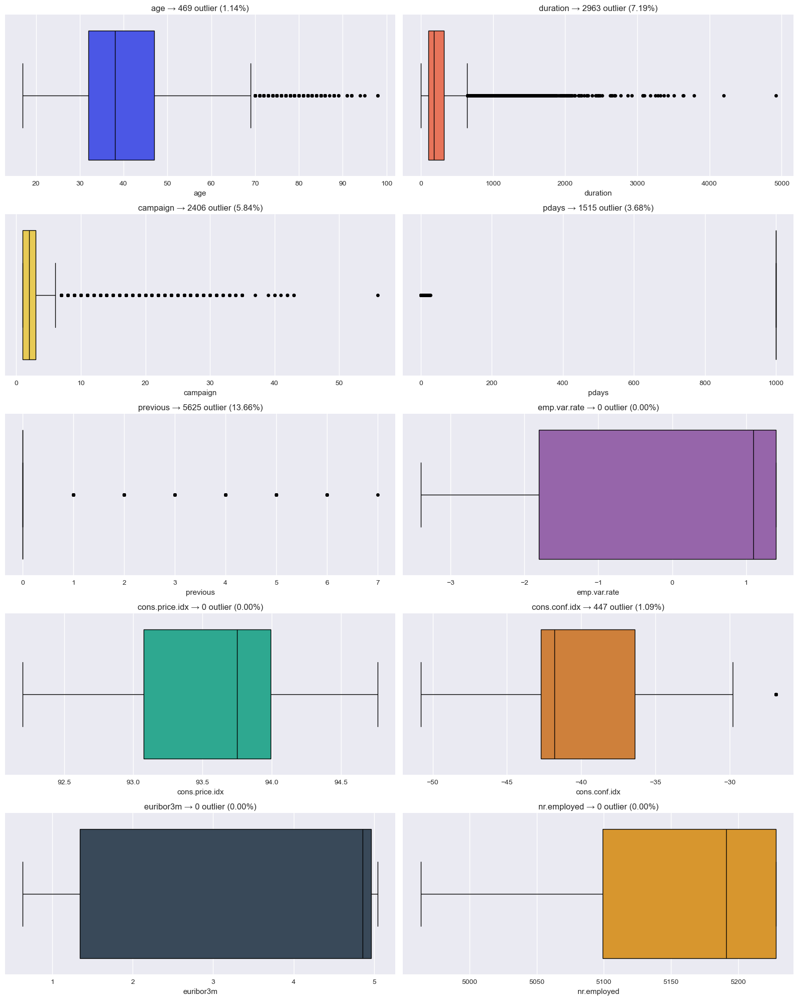

In [179]:
# Fungsi untuk menghitung jumlah & persentase outlier (IQR)
def hitung_outlier(seri):
    q1 = seri.quantile(0.25)
    q3 = seri.quantile(0.75)
    iqr = q3 - q1
    batas_bawah = q1 - 1.5 * iqr
    batas_atas = q3 + 1.5 * iqr
    data_outlier = seri[(seri < batas_bawah) | (seri > batas_atas)]
    jumlah_outlier = len(data_outlier)
    persentase_outlier = (jumlah_outlier / len(seri)) * 100
    return jumlah_outlier, persentase_outlier

# Warna untuk boxplot (ulang siklus warna biar cukup untuk semua kolom numerik)
palette = ['#3142FF', '#FF6542', '#FFD93B', '#FF4FB6', '#2ECC71', '#9B59B6', '#1ABC9C', '#E67E22', '#34495E', '#F39C12']

# Ambil semua fitur numerik
num_cols = df.describe().columns.tolist()

# Buat grid subplot
fig, axes = plt.subplots(5, 2, figsize=(16, 20))
axes = axes.flatten()

for idx, kolom in enumerate(num_cols):
    jml_out, pct_out = hitung_outlier(df[kolom])
    sns.boxplot(
        x=df[kolom],
        color=palette[idx % len(palette)],
        ax=axes[idx],
        orient='h',
        linecolor='black',
        flierprops=dict(marker='o', markersize=5, markerfacecolor='black', markeredgecolor='none')
    )
    axes[idx].set_title(
        f"{kolom} → {jml_out} outlier ({pct_out:.2f}%)",
        fontsize=12
    )

plt.tight_layout()
plt.show()

***
**Insight**
***
| Fitur              | Jumlah Outlier | Persentase (%) | Catatan Penting                                                                                     |
| ------------------ | -------------- | -------------- | --------------------------------------------------------------------------------------------------- |
| **age**            | *469*          | *1.14%*        | Outlier berada di usia sangat tinggi (90+ tahun) yang jarang terjadi untuk nasabah bank.            |
| **duration**       | *2.963*        | *7.19%*        | Banyak panggilan singkat, namun ada panggilan yang berlangsung ribuan detik (outlier ekstrem).      |
| **campaign**       | *2.406*        | *5.84%*        | Mayoritas nasabah dihubungi 1–3 kali, namun ada yang dihubungi puluhan kali → tidak efisien.        |
| **pdays**          | *1.515*        | *3.68%*        | Sebagian besar bernilai 999 (tidak pernah dihubungi), tetapi ada variasi outlier rendah.            |
| **previous**       | *5.625*        | *13.66%*       | Sebagian besar nasabah belum pernah dihubungi, namun ada segelintir dengan frekuensi sangat tinggi. |
| **emp.var.rate**   | *0*            | *0.00%*        | Tidak ditemukan outlier, distribusi wajar sesuai kondisi ekonomi.                                   |
| **cons.price.idx** | *0*            | *0.00%*        | Tidak ditemukan outlier, stabil pada kisaran 93–94.                                                 |
| **cons.conf.idx**  | *447*          | *1.09%*        | Sebagian besar berada di -40 hingga -30, ada beberapa nilai ekstrem di luar kisaran.                |
| **euribor3m**      | *0*            | *0.00%*        | Tidak ada outlier, distribusi sesuai dengan data suku bunga riil.                                   |
| **nr.employed**    | *0*            | *0.00%*        | Tidak ada outlier, stabil di sekitar 5.000+.                                                        |

****
#### 2.9.2 Categorical
****

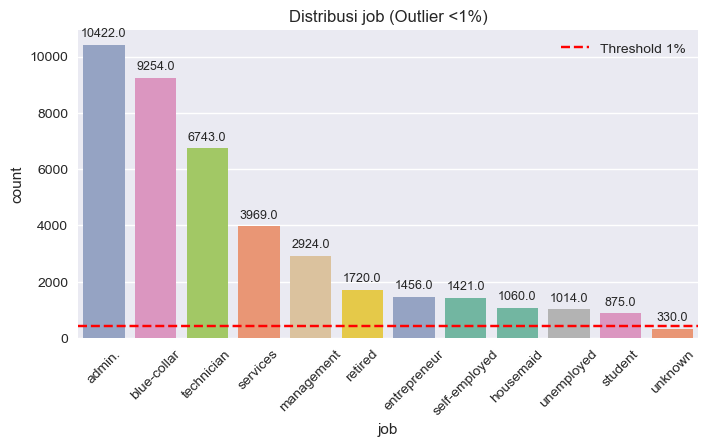

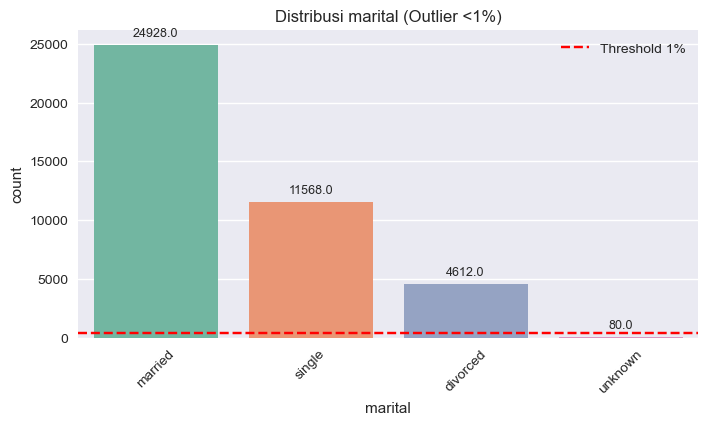

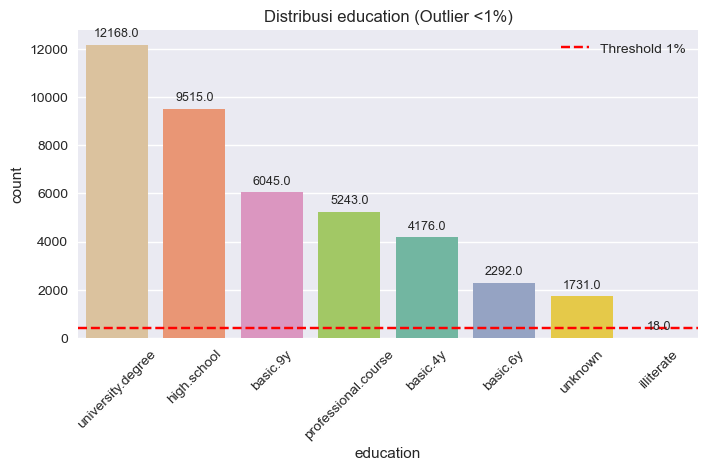

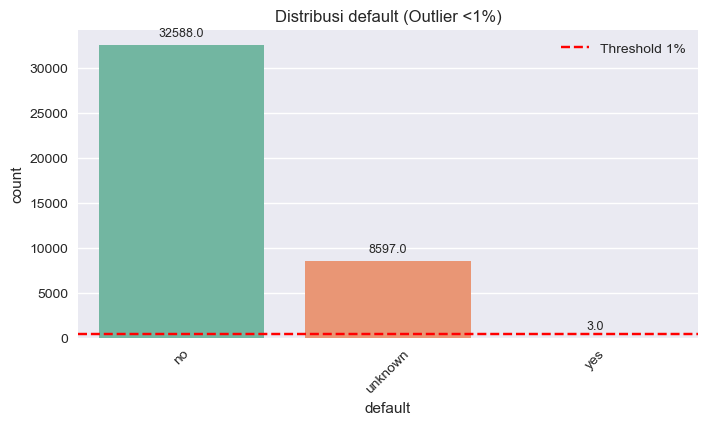

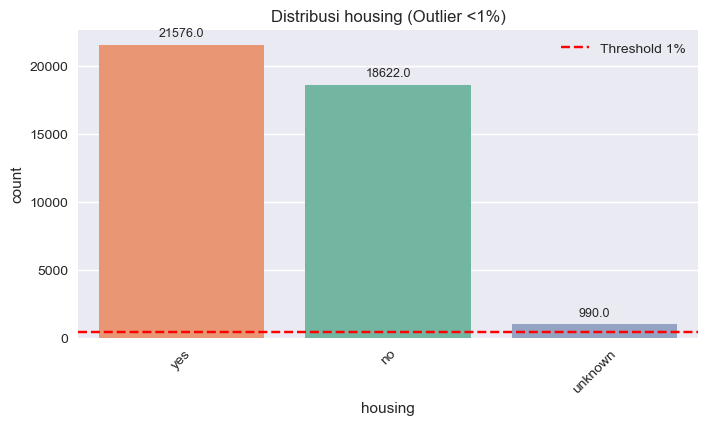

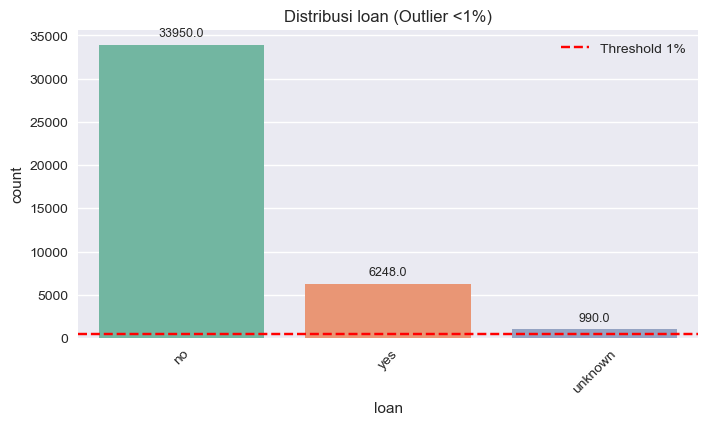

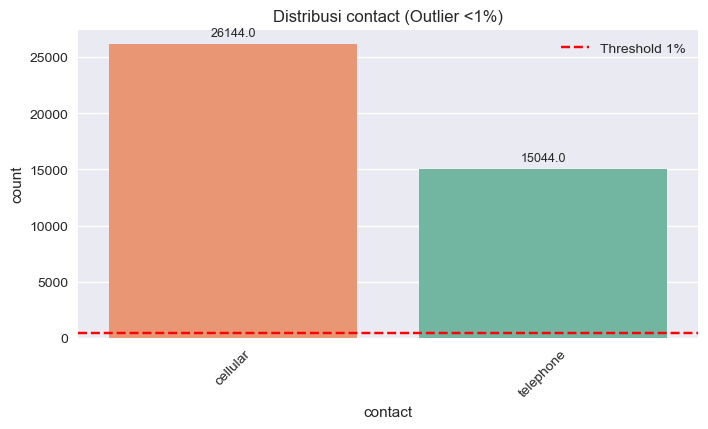

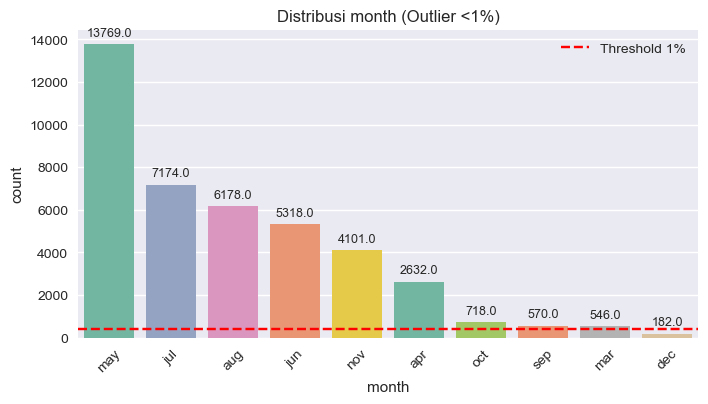

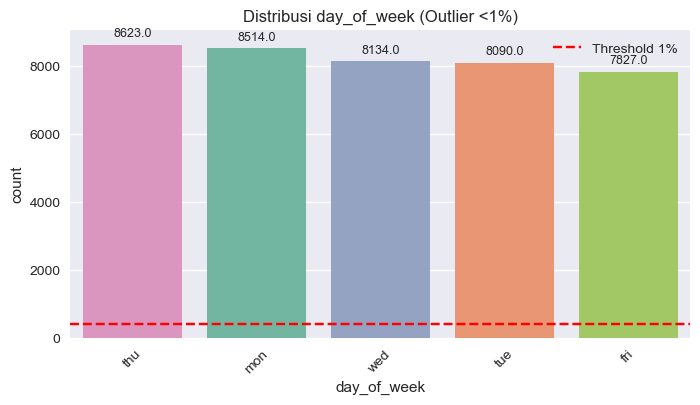

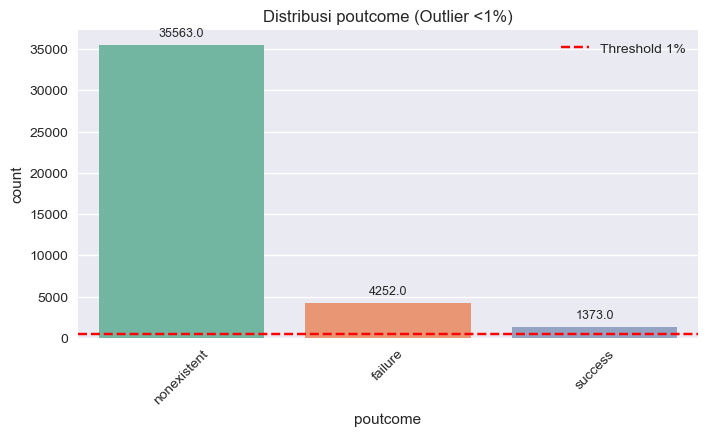

In [180]:
# Ambil semua fitur kategorikal
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
cat_cols.remove('y')  # kecuali target

# Visualisasi kategori langka dengan countplot
threshold = 0.01 * len(df)  # 1% dari total data

for col in cat_cols:
    plt.figure(figsize=(8,4))
    order = df[col].value_counts().index
    ax = sns.countplot(
        data=df,
        x=col,
        order=order,
        hue=col,      
        palette="Set2",
        legend=False
    )
    plt.axhline(threshold, color='red', linestyle='--', label='Threshold 1%')
    plt.title(f"Distribusi {col} (Outlier <1%)", fontsize=12)
    plt.xticks(rotation=45)
    plt.legend()

    # Tambahkan label jumlah di atas bar
    for p in ax.patches:
        ax.annotate(
            f"{p.get_height()}",
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='center',
            xytext=(0, 8), textcoords='offset points', fontsize=9
        )

    plt.show()

***
**Insight**
***

| Fitur             | Kategori Jarang (<1%)                    | Persentase (%)                  | Catatan Penting                                                                                              |
| ----------------- | ---------------------------------------- | ------------------------------- | ------------------------------------------------------------------------------------------------------------ |
| **job**           | `"student"`, `"illiterate"`, `"unknown"` | \~0–1%                          | Beberapa kategori sangat jarang, bisa digabung ke kategori lain atau tetap dipertahankan untuk interpretasi. |
| **marital**       | `"unknown"`                              | <1%                             | Tidak signifikan, bisa dianggap missing.                                                                     |
| **education**     | `"illiterate"`, `"unknown"`              | <1%                             | `"illiterate"` sangat jarang → rawan noise dalam modeling.                                                   |
| **default**       | `"yes"`, `"unknown"`                     | sangat kecil                    | `"yes"` jarang sekali → akan memengaruhi model.                                                              |
| **housing**       | `"unknown"`                              | <1%                             | Bisa dianggap missing atau kategori sendiri.                                                                 |
| **loan**          | `"unknown"`                              | <1%                             | Sama seperti housing.                                                                                        |
| **contact**       | `"telephone"`                            | \~10%                           | Jauh lebih sedikit dibanding `"cellular"`.                                                                   |
| **month**         | `"mar"`, `"sep"`, `"dec"`                | <1% per kategori                | Sebagian besar kampanye terjadi di Mei → kategori lain bisa dianggap seasonal rare.                          |
| **day\_of\_week** | Tidak ada kategori jarang                | -                               | Distribusi relatif merata sepanjang Senin–Jumat.                                                             |
| **poutcome**      | `"success"`, `"failure"`                 | kecil dibanding `"nonexistent"` | Mayoritas `nonexistent`, kategori lain jarang.                                                               |

****
### 2.10 Target Data Proportion
****

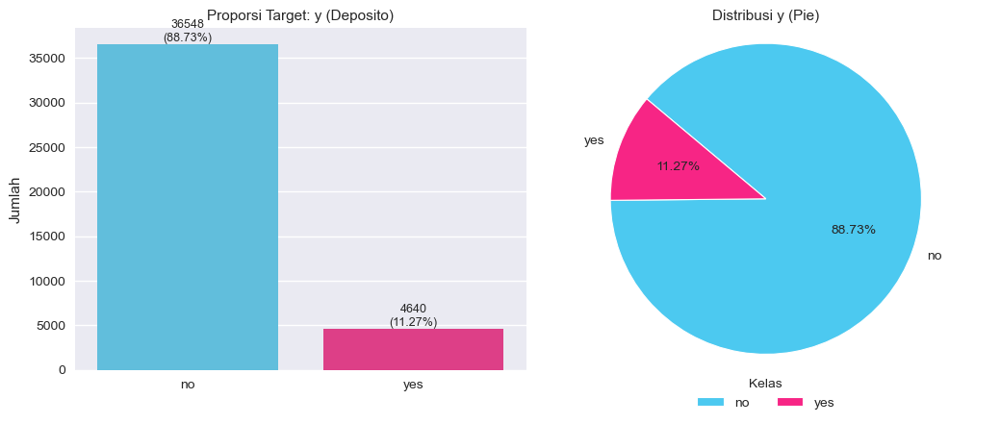

In [181]:
# --- Siapkan data target ---
target = df['y'].astype(str).str.strip()
urutan = target.value_counts().index.tolist()         

# Hitung ringkasannya
hitung = target.value_counts().reindex(urutan)
persen = (hitung / hitung.sum() * 100).round(2)

# Palet warna
warna = ['#4CC9F0', '#F72585']   

# --- Buat kanvas side-by-side ---
fig, (ax_bar, ax_pie) = plt.subplots(nrows=1, ncols=2, figsize=(10.5, 4.5))

# ===== Panel 1: Countplot dengan label jumlah & persen =====
sns.countplot(x=target, order=urutan, palette=warna, hue=target, legend=False, ax=ax_bar)
ax_bar.set_title('Proporsi Target: y (Deposito)', fontsize=11)
ax_bar.set_xlabel('')
ax_bar.set_ylabel('Jumlah')

# Tambahkan label di atas tiap bar (jumlah dan persentase)
for patch, pr in zip(ax_bar.patches, persen):
    tinggi = patch.get_height()
    ax_bar.annotate(
        f'{int(tinggi)}\n({pr:.2f}%)',
        (patch.get_x() + patch.get_width() / 2, tinggi),
        ha='center', va='bottom', fontsize=9
    )

# ===== Panel 2: Pie chart =====
ax_pie.pie(
    hitung.values,
    labels=urutan,
    colors=warna,
    autopct='%1.2f%%',
    startangle=140,
    counterclock=False,
    wedgeprops=dict(linewidth=0.8, edgecolor='white')
)
ax_pie.set_title('Distribusi y (Pie)', fontsize=11)
ax_pie.axis('equal')  # agar pie menjadi bulat

# Legend opsional
ax_pie.legend(title='Kelas', loc='lower center', bbox_to_anchor=(0.5, -0.15),
              ncol=len(urutan), frameon=False)

plt.tight_layout()
plt.show()

***
**Insight**
***

| Kelas   | Jumlah Data | Persentase (%) | Catatan Penting                                                     |
| ------- | ----------- | -------------- | ------------------------------------------------------------------- |
| **No**  | 36.533      | 88.73%         | Mayoritas nasabah tidak berlangganan deposito → kelas dominan.      |
| **Yes** | 4.639       | 11.27%         | Hanya sedikit nasabah yang berlangganan deposito → kelas minoritas. |

- Distribusi target sangat tidak seimbang (imbalanced) dengan rasio sekitar 8:1.
- Kondisi ini berisiko membuat model lebih condong memprediksi kelas mayoritas (no).
- Perlu penanganan imbalance pada tahap preprocessing/modeling, misalnya:
    - Oversampling kelas minoritas (contoh: SMOTE).
    - Undersampling kelas mayoritas.
    - Class weighting pada algoritma (misalnya Logistic Regression, Random Forest, XGBoost).

****
## **3. Data Preparation**
****

- Tahap ini bertujuan untuk menyiapkan dataset agar siap dipakai dalam modeling. Karena data mentah biasanya masih punya masalah (missing value, duplikat, outlier, kategori aneh, imbalance, dll), maka dilakukan beberapa langkah pembersihan & transformasi.

****
### 3.1 Data Cleaning
****
- Tahap Data Cleaning bertujuan untuk memastikan dataset bersih, konsisten, dan siap dipakai dalam proses analisis maupun modeling. 
- Pada tahap ini kita memperbaiki atau menghapus data yang dianggap bisa merusak kualitas model, seperti duplikat, nilai hilang, data tidak valid, maupun outlier.

****
#### 3.1.1 Handling Missing Values
****

- Di dataset **Bank Marketing**, secara teknis tidak ada nilai `NaN`, tapi ada kategori `"unknown"` pada beberapa kolom (`job`, `marital`, `education`, `default`, `housing`, `loan`).
Kategori `"unknown"` ini berfungsi sebagai proxy missing value.

In [182]:
# Cek jumlah "unknown" di setiap kolom kategorikal
unknown_counts = (df[cat_cols] == "unknown").sum()
unknown_percentage = (unknown_counts / len(df)) * 100

missing_proxy = pd.DataFrame({
    "Fitur": cat_cols,
    "Jumlah 'unknown'": unknown_counts.values,
    "Persentase (%)": unknown_percentage.round(2).values
})

print(missing_proxy)

         Fitur  Jumlah 'unknown'  Persentase (%)
0          job               330            0.80
1      marital                80            0.19
2    education              1731            4.20
3      default              8597           20.87
4      housing               990            2.40
5         loan               990            2.40
6      contact                 0            0.00
7        month                 0            0.00
8  day_of_week                 0            0.00
9     poutcome                 0            0.00


Penanganan per kolom :

- `job` → `"unknown"` cukup sedikit → bisa dianggap missing → imputasi dengan modus (pekerjaan terbanyak) atau tetap diperlakukan sebagai kategori tersendiri.
- `marital` → `"unknown"` sedikit → bisa imputasi dengan modus (married).
- `education` → `"unknown"` lumayan banyak → sebaiknya diperlakukan sebagai kategori khusus (agar model belajar bahwa pendidikan tidak diketahui bisa punya arti sendiri).
- `default` → `"unknown"` justru lebih banyak daripada "yes" → biarkan sebagai kategori. Menghapusnya bisa membuat bias.
- `housing` & `loan` → `"unknown"` ada tapi relatif kecil → bisa diperlakukan sebagai kategori sendiri atau imputasi dengan modus.

In [183]:
# Imputasi 'unknown' dengan modus pada kolom tertentu
cols_impute = ['job', 'marital']
for col in cols_impute:
    modus = df[col].mode()[0]
    df[col] = df[col].replace("unknown", modus)

# Biarkan 'unknown' tetap sebagai kategori di kolom lain
print("Selesai imputasi: 'job' dan 'marital'. Kolom lain tetap menyimpan 'unknown' sebagai kategori.")

Selesai imputasi: 'job' dan 'marital'. Kolom lain tetap menyimpan 'unknown' sebagai kategori.


***
**Insight**
***
- Dengan cara ini, `"unknown"` di `job` dan `marital` tidak akan mengganggu distribusi karena jumlahnya kecil → lebih stabil jika diimputasi.

- `"unknown"` di kolom lain tetap dipertahankan karena bisa punya arti khusus (misalnya nasabah tidak melaporkan status pinjaman).

****
#### 3.1.2 Handling Data Duplicates
****

- Kita sudah cek dan menemukan ada 12 baris duplikat (~0.03% dari total data). Jumlah ini sangat kecil, sehingga aman untuk dihapus agar tidak menimbulkan bias.

In [184]:
# Mengecek jumlah data duplikat
duplicate_count = df.duplicated().sum()
print(f"Jumlah data duplikat : {duplicate_count}")

# Persentase duplikat
dup_percentage = (duplicate_count / len(df)) * 100
print(f"Persentase duplikat : {dup_percentage:.4f}%")

# Jika jumlah duplikat sangat kecil, aman untuk dihapus
if duplicate_count > 0:
    print("\nKeputusan: Data duplikat akan dihapus untuk mencegah bias pada model.")
    df = df.drop_duplicates()
    print(f"Jumlah baris setelah menghapus duplikat: {df.shape[0]}")
else:
    print("\nKeputusan: Tidak ada data duplikat, jadi tidak perlu ada penghapusan.")

Jumlah data duplikat : 12
Persentase duplikat : 0.0291%

Keputusan: Data duplikat akan dihapus untuk mencegah bias pada model.
Jumlah baris setelah menghapus duplikat: 41176


***
**Insight**
***
- Alasan penghapusan:
    - Duplikat bisa membuat model bias karena baris yang sama dihitung lebih dari sekali.
    - Dengan hanya 12 baris duplikat, dampaknya ke data sangat kecil (<0.05%), sehingga aman dihapus.

****
#### 3.1.3 Handling Invalid Data
****

In [185]:
# Mengecek jumlah record dengan duration <= 0
invalid_duration_count = df[df['duration'] <= 0].shape[0]
print(f"Jumlah record dengan duration <= 0 : {invalid_duration_count}")

# Menghapus record invalid (duration <= 0)
if invalid_duration_count > 0:
    df = df[df['duration'] > 0]
    print(f"Jumlah baris setelah menghapus duration <= 0 : {df.shape[0]}")
else:
    print("Tidak ada data invalid pada duration.")

Jumlah record dengan duration <= 0 : 4
Jumlah baris setelah menghapus duration <= 0 : 41172


***
**Insight**
***
- Alasan penghapusan:
    - Durasi kontak tidak mungkin 0 detik atau kurang.
    - Jumlah data invalid sangat kecil (4 dari >41 ribu, ~0.01%), sehingga aman dihapus tanpa memengaruhi distribusi data.

****
#### 3.1.4 Handling Outliers (Numerical Features)
****

- Sebelumnya kita sudah cek dengan metode IQR :
    - Outlier terbanyak ada di `previous` (13.66%), `duration` (7.19%), `campaign` (5.84%).
    - Fitur makro ekonomi (`emp.var.rate`, `cons.price.idx`, `euribor3m`, `nr.employed`) bersih tanpa outlier.
- Strategi Handling :
    - Kalau outlier jumlahnya kecil (<1-2%) → bisa dihapus.
    - Kalau cukup besar (>5%) → lebih baik transformasi (log/winsorizing) atau tetap dipertahankan (kalau memang bermakna).

In [186]:
def winsorize_series(s, k=1.5):
    q1 = s.quantile(0.25)
    q3 = s.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - k * iqr
    upper = q3 + k * iqr
    return np.clip(s, lower, upper)

# Terapkan winsorizing pada fitur numerik yang punya outlier signifikan
num_cols = ['age', 'duration', 'campaign', 'previous',
            'emp.var.rate', 'cons.price.idx', 'cons.conf.idx',
            'euribor3m', 'nr.employed']

for col in num_cols:
    df[col] = winsorize_series(df[col])

print("Winsorizing telah dilakukan pada fitur numerik yang punya outlier signifikan.")

Winsorizing telah dilakukan pada fitur numerik yang punya outlier signifikan.


***
**Insight**
***
- Nilai ekstrem dipotong ke batas bawah/atas IQR.
- Data tetap utuh (tidak ada baris yang dihapus).

****
#### 3.1.5 Handling Outliers "Unknown" (Kategorical Features)
****

In [187]:
# Hapus baris dengan marital = "unknown" (jumlah sangat kecil, MCAR)
df = df[df['marital'] != "unknown"]

# Cek ulang distribusi setelah perbaikan
for col in ['marital', 'default', 'housing', 'loan']:
    print(f"\nKolom: {col}")
    print(df[col].value_counts(normalize=True) * 100)


Kolom: marital
marital
married     60.716021
single      28.087049
divorced    11.196930
Name: proportion, dtype: float64

Kolom: default
default
no         79.114447
unknown    20.878267
yes         0.007287
Name: proportion, dtype: float64

Kolom: housing
housing
yes        52.385116
no         45.210337
unknown     2.404547
Name: proportion, dtype: float64

Kolom: loan
loan
no         82.420091
yes        15.175362
unknown     2.404547
Name: proportion, dtype: float64


***
**Insight**
***
- Alasan di balik handling "Unknown" ini :
    - `marital` → kasus `"unknown"` sangat sedikit → MCAR → aman dihapus.
    - `default`, `housing`, `loan` → `"unknown"` kemungkinan MNAR → lebih aman dipertahankan dan tetap sebagai "unknown", supaya model bisa belajar bahwa “tidak menjawab” adalah informasi penting.

****
### 3.2 Convert Target Data to Binary Format
****

- Pada dataset Bank Marketing, kolom target semula bernama y, kemudian diganti menjadi acceptance untuk memperjelas arti variabel target. Kolom ini merepresentasikan status penerimaan nasabah terhadap tawaran deposito berjangka, dengan dua kategori:
    - `"yes"` → nasabah berlangganan deposito berjangka
    - `"no"` → nasabah tidak berlangganan
Sebagian besar algoritma Machine Learning (Logistic Regression, Random Forest, Gradient Boosting, dll) hanya bisa menerima target dalam bentuk numerik, bukan string.

Karena itu, kita perlu mengonversi kolom acceptance menjadi format biner (binary).
- Strategi konversi
    - `"no"` → 0
    - `"yes"` → 1
Sehingga masalah kita menjadi Binary Classification Problem.

In [188]:
display(df.head(), df.tail())

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261.0,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,149.0,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,226.0,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,151.0,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,307.0,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
41183,69.5,retired,married,professional.course,no,yes,no,cellular,nov,fri,334.0,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46.0,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383.0,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56.0,retired,married,university.degree,no,yes,no,cellular,nov,fri,189.0,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44.0,technician,married,professional.course,no,no,no,cellular,nov,fri,442.0,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41187,69.5,retired,married,professional.course,no,yes,no,cellular,nov,fri,239.0,3,999,0,failure,-1.1,94.767,-50.8,1.028,4963.6,no


In [189]:
# Ubah nama kolom target dari 'y' menjadi 'acceptance'
df.rename(columns={'y': 'acceptance'}, inplace=True)

# Convert target variable acceptance menjadi binary (0 = no, 1 = yes)
df['acceptance'] = df['acceptance'].map({'no': 0, 'yes': 1})

# Cek hasil konversi
print("Distribusi Target setelah konversi :")
print(df['acceptance'].value_counts())

print("\nPersentase Target (%) :")
print(df['acceptance'].value_counts(normalize=True) * 100)

Distribusi Target setelah konversi :
acceptance
0    36533
1     4639
Name: count, dtype: int64

Persentase Target (%) :
acceptance
0    88.732634
1    11.267366
Name: proportion, dtype: float64


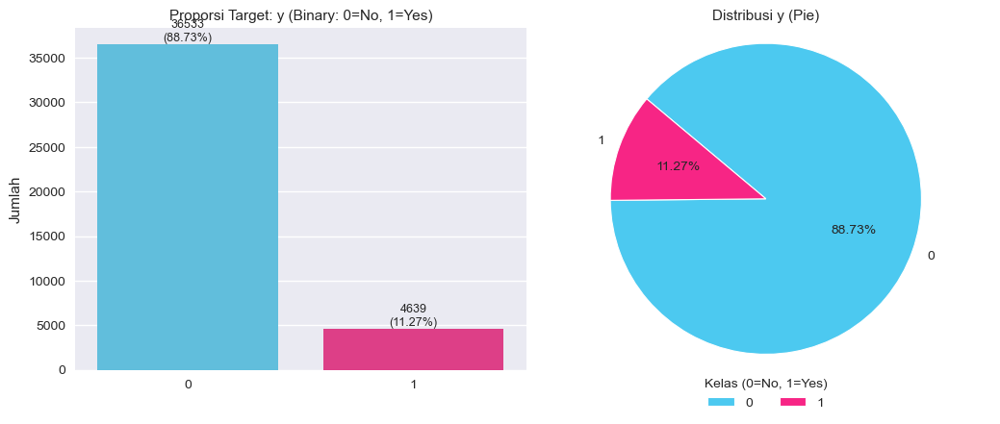

In [190]:
# --- Siapkan data target (sudah binary: 0 = no, 1 = yes) ---
target = df['acceptance'].astype(str).str.strip()
urutan = target.value_counts().index.tolist()          # urut dari yang terbanyak

# Hitung ringkasannya
hitung = target.value_counts().reindex(urutan)
persen = (hitung / hitung.sum() * 100).round(2)

# Palet warna
warna = ['#4CC9F0', '#F72585']   

# --- Buat kanvas side-by-side ---
fig, (ax_bar, ax_pie) = plt.subplots(nrows=1, ncols=2, figsize=(10.5, 4.5))

# ===== Panel 1: Countplot dengan label jumlah & persen =====
sns.countplot(x=target, order=urutan, palette=warna, hue=target, legend=False, ax=ax_bar)
ax_bar.set_title('Proporsi Target: y (Binary: 0=No, 1=Yes)', fontsize=11)
ax_bar.set_xlabel('')
ax_bar.set_ylabel('Jumlah')

# Tambahkan label di atas tiap bar (jumlah dan persentase)
for patch, pr in zip(ax_bar.patches, persen):
    tinggi = patch.get_height()
    ax_bar.annotate(
        f'{int(tinggi)}\n({pr:.2f}%)',
        (patch.get_x() + patch.get_width() / 2, tinggi),
        ha='center', va='bottom', fontsize=9
    )

# ===== Panel 2: Pie chart =====
ax_pie.pie(
    hitung.values,
    labels=urutan,
    colors=warna,
    autopct='%1.2f%%',
    startangle=140,
    counterclock=False,
    wedgeprops=dict(linewidth=0.8, edgecolor='white')
)
ax_pie.set_title('Distribusi y (Pie)', fontsize=11)
ax_pie.axis('equal')  # agar pie menjadi bulat

# Legend opsional
ax_pie.legend(title='Kelas (0=No, 1=Yes)', loc='lower center', bbox_to_anchor=(0.5, -0.15),
              ncol=len(urutan), frameon=False)

plt.tight_layout()
plt.show()

***
**Insight**
***
- Setelah konversi, jumlah data & proporsi target tetap sama seperti sebelum diubah:
    - 0 (No) = 36.533 baris (88.73%)
    - 1 (Yes) = 4.639 baris (11.27%)
- Jadi, konversi ini tidak mengubah distribusi data target, hanya mengganti label teks (no/yes) menjadi angka (0/1).

****
### 3.3 Save Data Cleaned
****

In [191]:
# Simpan hasil data cleaning ke file CSV
df.to_csv("bank_additional_full_cleaned.csv", index=False)

print("Dataset cleaned berhasil disimpan sebagai bank_marketing_clean.csv")

Dataset cleaned berhasil disimpan sebagai bank_marketing_clean.csv


****
## **4. Exploratory Data Analysis (EDA)**
****

Tahap ini bertujuan untuk memahami data lebih dalam sebelum masuk ke modeling. Di sini kita mencari pola, hubungan antar fitur, dan indikasi variabel mana yang berpengaruh terhadap target `(acceptance)`.

****
### 4.1 Numerical Features Analysis

****
#### 4.1.1 Distribusi Data
****

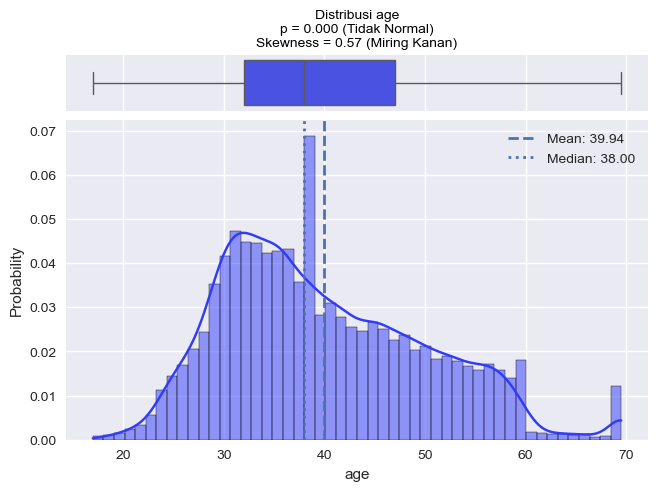

👉 Age : Mayoritas nasabah usia 25–60 (segmen produktif). Outlier >90 cenderung bukan target utama.


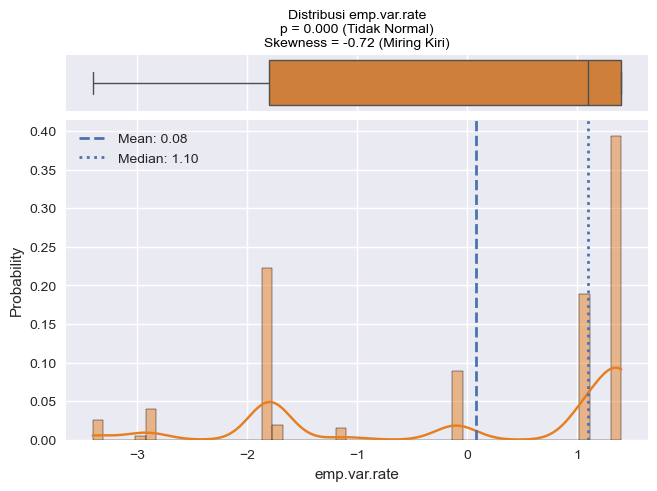

👉 emp.var.rate : Saat nilai negatif (resesi), campaign cenderung kurang berhasil.


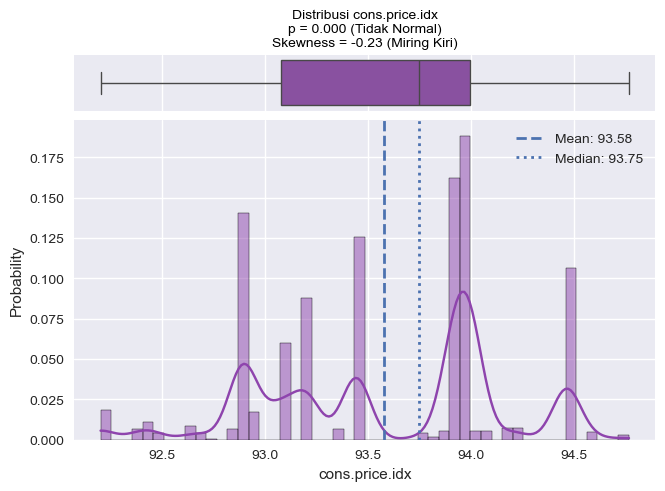

👉 cons.price.idx : Inflasi tinggi membuat nasabah lebih hati-hati berinvestasi.


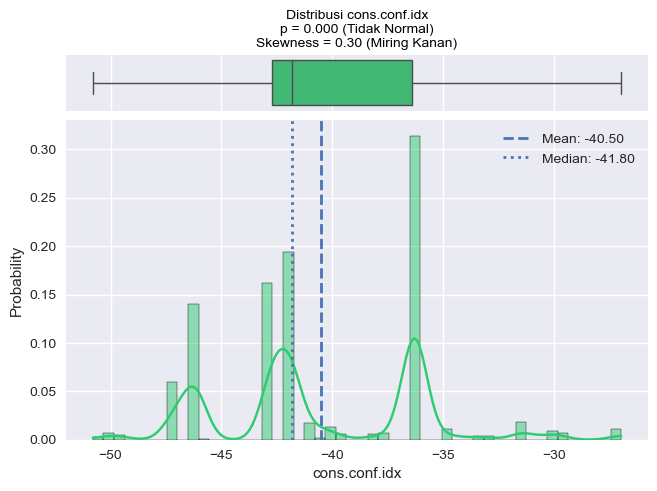

👉 cons.conf.idx : Rendahnya confidence konsumen menurunkan minat deposito.


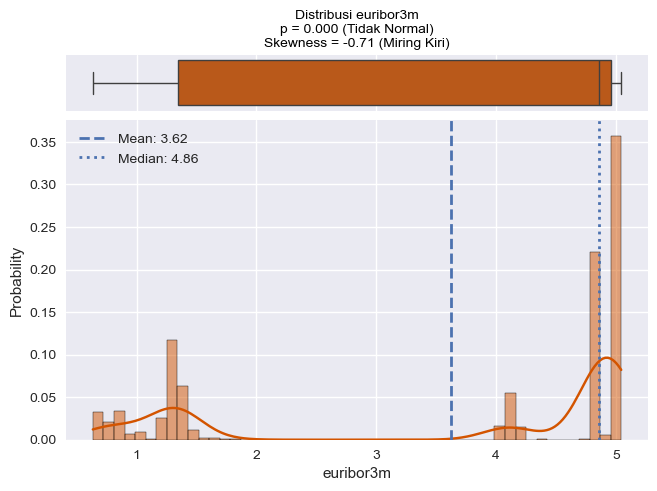

👉 euribor3m : Saat bunga tinggi, minat deposito meningkat.


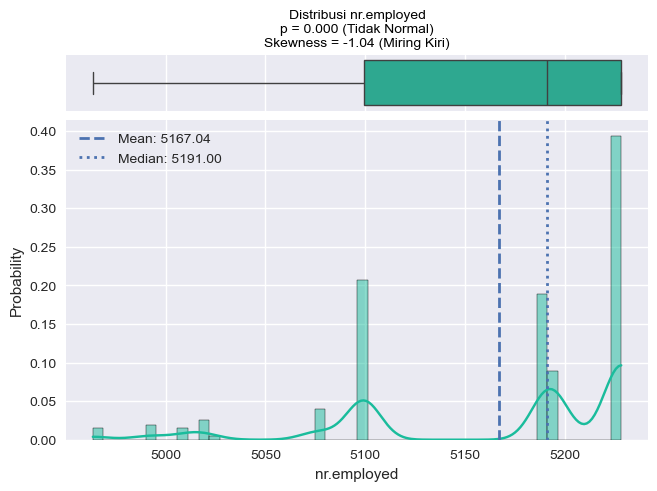

👉 nr.employed : Tenaga kerja tinggi (5000+) → kondisi stabil, campaign lebih efektif. Saat turun → tanda krisis, campaign kurang berhasil.


In [192]:
from scipy.stats import normaltest, skew

# 1) Tentukan kolom numerik
num_cols = df.describe().columns.tolist()

# 2) Daftar fitur yang tidak ingin divisualisasikan
skip_cols = ['duration', 'campaign', 'pdays', 'previous', 'acceptance']

# 3) Peta warna per fitur numerik
palette_num = {
    'age': "#313BFA",
    'duration': "#FF5537",
    'campaign': "#FADA4C",   
    'pdays': "#85C1E9",
    'previous': "#58D68D",
    'emp.var.rate': "#E67E22",
    'cons.price.idx': "#8E44AD",
    'cons.conf.idx': "#2ECC71",
    'euribor3m': "#D35400",
    'nr.employed': "#1ABC9C"
}

# 4) Loop hanya fitur yang tidak di-skip
for col in [c for c in num_cols if c not in skip_cols]:
    # Siapkan kanvas: 2 baris (boxplot di atas, histogram di bawah)
    fig, (ax_top, ax_bottom) = plt.subplots(
        2, 1, sharex=True, figsize=(7.5, 5),
        gridspec_kw={"height_ratios": (.15, .85), "hspace": 0.05}
    )

    x = df[col].dropna()

    # Uji normalitas & skewness
    if len(x) >= 8 and x.std() > 1e-8:   
        k2_stat, p_value = normaltest(x)
        skw = skew(x)
    else:
        k2_stat, p_value, skw = np.nan, np.nan, np.nan

    if not np.isnan(skw):
        skew_type = "Miring Kanan" if skw > 0 else ("Miring Kiri" if skw < 0 else "Simetris")
    else:
        skew_type = "N/A"

    # Info judul
    hist_color = palette_num.get(col, "#85C1E9")
    box_color = "white"

    if np.isnan(p_value):
        info_txt = f"p = N/A\nSkewness = {skw:.2f}" if not np.isnan(skw) else "p = N/A\nSkewness = N/A"
    elif p_value > 0.05:
        info_txt = f"p = {p_value:.3f} (≈ Normal)\nSkewness = {skw:.2f}"
    else:
        info_txt = f"p = {p_value:.3f} (Tidak Normal)\nSkewness = {skw:.2f} ({skew_type})"
        box_color = hist_color  

    # Boxplot
    ax_top.set_title(f"Distribusi {col}\n{info_txt}", fontsize=10, color="black")
    sns.boxplot(
        x=x, ax=ax_top, color=box_color,
        flierprops=dict(marker='d', markersize=6, markeredgecolor='None', markerfacecolor='black')
    )
    ax_top.set(xlabel="")

    # Histogram + KDE + garis mean/median
    sns.histplot(x, ax=ax_bottom, stat="probability", kde=True, bins=50, color=hist_color)
    if len(x) > 0:
        mean_v, med_v = x.mean(), x.median()
        ax_bottom.axvline(mean_v, linestyle='--', linewidth=2, label=f"Mean: {mean_v:.2f}")
        ax_bottom.axvline(med_v, linestyle=':', linewidth=2, label=f"Median: {med_v:.2f}")
        ax_bottom.legend()

    plt.show()

    # Insight singkat
    if col == "age":
        print("👉 Age : Mayoritas nasabah usia 25–60 (segmen produktif). Outlier >90 cenderung bukan target utama.")
    elif col == "emp.var.rate":
        print("👉 emp.var.rate : Saat nilai negatif (resesi), campaign cenderung kurang berhasil.")
    elif col == "cons.price.idx":
        print("👉 cons.price.idx : Inflasi tinggi membuat nasabah lebih hati-hati berinvestasi.")
    elif col == "cons.conf.idx":
        print("👉 cons.conf.idx : Rendahnya confidence konsumen menurunkan minat deposito.")
    elif col == "euribor3m":
        print("👉 euribor3m : Saat bunga tinggi, minat deposito meningkat.")
    elif col == "nr.employed":
        print("👉 nr.employed : Tenaga kerja tinggi (5000+) → kondisi stabil, campaign lebih efektif. Saat turun → tanda krisis, campaign kurang berhasil.")

****
**Summary**
****

| Fitur              | Skewness                 | p-value Normalitas | Bentuk Distribusi              | Catatan Penting                                                                                         |
| ------------------ | ------------------------ | ------------------ | ------------------------------ | ------------------------------------------------------------------------------------------------------- |
| **age**            | +0.78 *(right-skewed)*   | < 0.05             | Tidak normal, condong ke kanan | Mayoritas nasabah usia 25–60 (segmen produktif). Outlier usia >90 → kemungkinan bukan target utama.     |
| **emp.var.rate**   | -0.72 *(slightly left)*  | < 0.05             | Tidak normal, condong ke kiri  | Saat kondisi ekonomi (employment rate) negatif, campaign kurang berhasil → timing perlu disesuaikan.    |
| **cons.price.idx** | -0.23 *(slightly left)*  | < 0.05             | Tidak normal, condong ke kiri  | Inflasi harga konsumen relatif stabil. Periode harga tinggi → nasabah lebih hati-hati investasi.        |
| **cons.conf.idx**  | +0.30 *(slightly right)* | < 0.05             | Tidak normal, condong ke kanan | Kepercayaan konsumen mayoritas rendah (-40 sampai -30). Confidence rendah → minat deposito menurun.     |
| **euribor3m**      | -0.71 *(left-skewed)*    | < 0.05             | Tidak normal, condong ke kiri  | Tingkat suku bunga jangka pendek memengaruhi keputusan. Saat bunga tinggi → minat deposito meningkat.   |
| **nr.employed**    | -1.04 *(left-skewed)*    | < 0.05             | Tidak normal, condong ke kiri  | Jumlah tenaga kerja tinggi (5000+) → kondisi stabil, campaign lebih efektif. Saat turun → tanda krisis. |

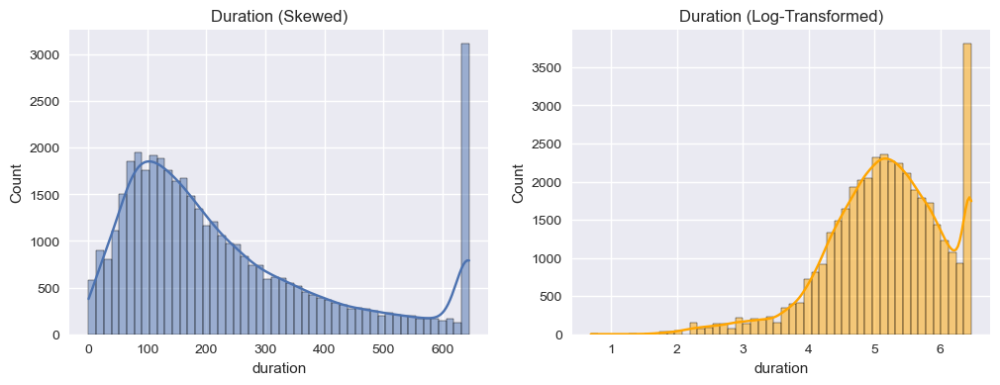

Duration : Mayoritas panggilan singkat (<300 detik) = kecil peluang konversi.
           Panggilan panjang (>2000 detik) meningkatkan peluang closing tapi juga meningkatkan biaya.


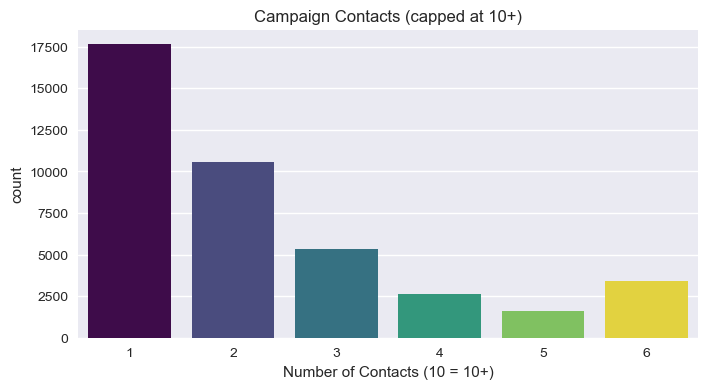

Campaign : Kontak efektif terjadi pada 1–3 kali panggilan.
           Kontak berlebihan (>10) menimbulkan efek kelelahan (fatigue) dan menambah biaya tanpa hasil.


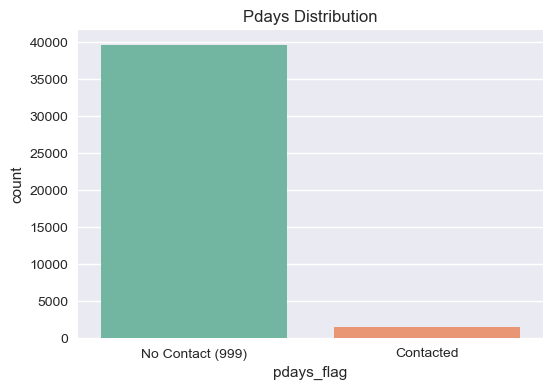

Pdays : Nilai 999 = nasabah belum pernah dihubungi (*cold leads*).
        Nasabah yang pernah dihubungi sebelumnya lebih responsif (*warm leads*).


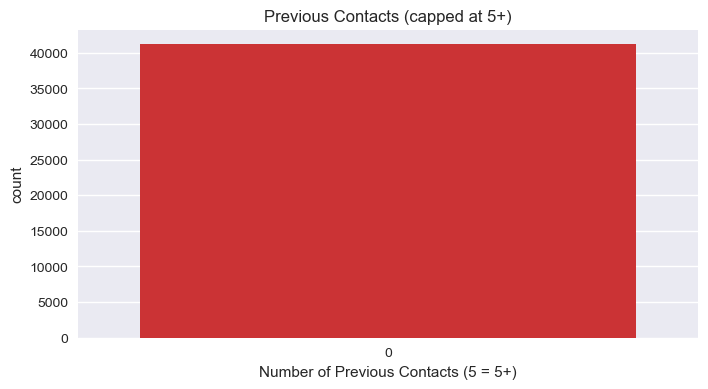

Previous : Mayoritas belum pernah dihubungi.
           Jika sudah pernah dihubungi, peluang konversi meningkat.
           Namun jika terlalu sering dihubungi tanpa hasil, nasabah cenderung tidak akan berubah pikiran.


In [193]:
# 1. duration → log scale histogram + boxenplot
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
sns.histplot(df['duration'], bins=50, kde=True)
plt.title("Duration (Skewed)")
plt.subplot(1,2,2)
sns.histplot(np.log1p(df['duration']), bins=50, kde=True, color="orange")
plt.title("Duration (Log-Transformed)")
plt.show()
print("Duration : Mayoritas panggilan singkat (<300 detik) = kecil peluang konversi.\n"
      "           Panggilan panjang (>2000 detik) meningkatkan peluang closing tapi juga meningkatkan biaya.")

# 2. campaign → countplot untuk <=10, sisanya dijadikan '10+'
df['campaign_cap'] = df['campaign'].apply(lambda x: x if x <= 10 else 10)
plt.figure(figsize=(8,4))
sns.countplot(x='campaign_cap', hue='campaign_cap', data=df, palette="viridis", legend=False)
plt.title("Campaign Contacts (capped at 10+)")
plt.xlabel("Number of Contacts (10 = 10+)")
plt.show()
print("Campaign : Kontak efektif terjadi pada 1–3 kali panggilan.\n"
      "           Kontak berlebihan (>10) menimbulkan efek kelelahan (fatigue) dan menambah biaya tanpa hasil.")

# 3. pdays → pisahkan 999 sebagai kategori khusus
df['pdays_flag'] = df['pdays'].apply(lambda x: "No Contact (999)" if x==999 else "Contacted")
plt.figure(figsize=(6,4))
sns.countplot(x='pdays_flag', hue='pdays_flag', data=df, palette="Set2", legend=False)
plt.title("Pdays Distribution")
plt.show()
print("Pdays : Nilai 999 = nasabah belum pernah dihubungi (*cold leads*).\n"
      "        Nasabah yang pernah dihubungi sebelumnya lebih responsif (*warm leads*).")

# 4. previous → distribusi dengan cap
df['previous_cap'] = df['previous'].apply(lambda x: x if x <= 5 else 5)
plt.figure(figsize=(8,4))
sns.countplot(x='previous_cap', hue='previous_cap', data=df, palette="Set1", legend=False)
plt.title("Previous Contacts (capped at 5+)")
plt.xlabel("Number of Previous Contacts (5 = 5+)")
plt.show()
print("Previous : Mayoritas belum pernah dihubungi.\n"
      "           Jika sudah pernah dihubungi, peluang konversi meningkat.\n"
      "           Namun jika terlalu sering dihubungi tanpa hasil, nasabah cenderung tidak akan berubah pikiran.")

****
**Summary**
****

| Fitur        | Skewness                      | p-value Normalitas | Bentuk Distribusi                  | Catatan Penting                                                                                                                                        |
| ------------ | ----------------------------- | ------------------ | ---------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------ |
| **duration** | +3.14 *(sangat right-skewed)* | < 0.05             | Sangat tidak normal, outlier besar | Mayoritas panggilan singkat (<300 detik) → kecil peluang konversi. Durasi panjang (>2000 detik) meningkatkan peluang closing tapi menambah biaya call. |
| **campaign** | +4.90 *(sangat right-skewed)* | < 0.05             | Sangat tidak normal, outlier besar | Mayoritas kontak 1–3 kali lebih efektif. Kontak berlebihan (>10) menimbulkan *customer fatigue* dan biaya tinggi tanpa hasil.                          |
| **pdays**    | +∞ *(karena spike di 999)*    | < 0.05             | Distribusi bimodal (999 dominan)   | Nilai 999 = nasabah belum pernah dihubungi (*cold leads*). Nasabah yang baru saja dihubungi lebih responsif (*warm leads*).                            |
| **previous** | +5.20 *(sangat right-skewed)* | < 0.05             | Sangat tidak normal, outlier besar | Mayoritas belum pernah dihubungi. Kontak 1–2 kali meningkatkan peluang konversi. Terlalu sering dihubungi → peluang kecil berubah → buang biaya.       |

****
#### 4.1.2 Numerical Features vs Target
****
- Pada bagian ini, kita akan menganalisis hubungan antara fitur utama dengan target `(acceptance)`.
- Tujuannya adalah untuk mengetahui apakah terdapat pola yang jelas antara nilai suatu fitur dengan keputusan nasabah untuk berlangganan deposito berjangka `(yes)` atau tidak `(no)`.

- Fitur yang dianalisis meliputi :
    - `Duration` vs `acceptance` → Apakah durasi panggilan berpengaruh terhadap hasil kampanye?
    - `Campaign` vs `acceptance` → Apakah jumlah kontak yang dilakukan memengaruhi keberhasilan?
    - `Pdays` vs `acceptance` → Apakah nasabah yang pernah dihubungi sebelumnya lebih cenderung berlangganan?
    - `Month` vs `acceptance` → Apakah ada faktor musiman (bulan tertentu lebih efektif)?

****
##### 4.1.2.1 Duration vs Target (`acceptance`)
****
- Menganalisis apakah lama durasi panggilan (duration) berhubungan dengan hasil kampanye (y: 0=No, 1=Yes).

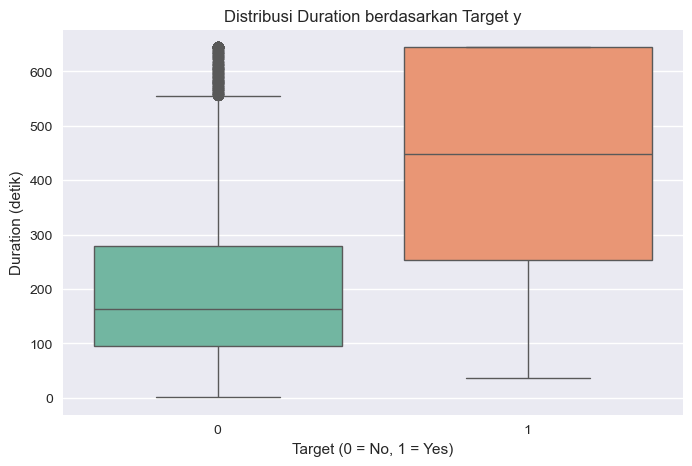

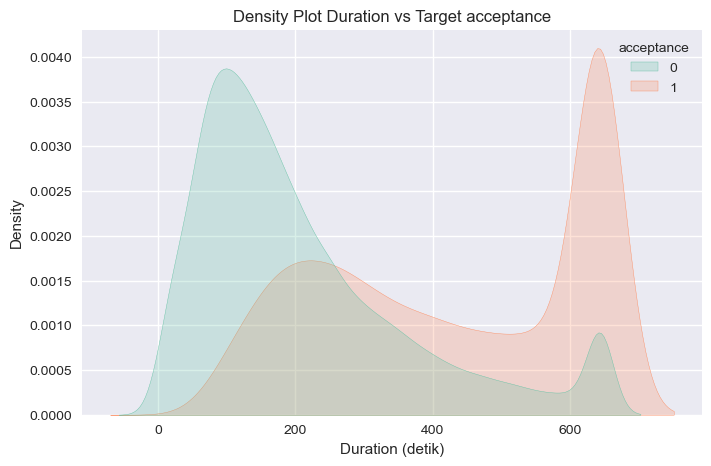

In [194]:
# Boxplot duration vs acceptance
plt.figure(figsize=(8,5))
sns.boxplot(x="acceptance", y="duration", hue="acceptance", data=df, palette="Set2", legend=False)
plt.title("Distribusi Duration berdasarkan Target y", fontsize=12)
plt.xlabel("Target (0 = No, 1 = Yes)")
plt.ylabel("Duration (detik)")
plt.show()

# Density plot duration vs acceptance
plt.figure(figsize=(8,5))
sns.kdeplot(data=df, x="duration", hue="acceptance", common_norm=False, fill=True, palette="Set2")
plt.title("Density Plot Duration vs Target acceptance", fontsize=12)
plt.xlabel("Duration (detik)")
plt.show()

***
**Insight**
***
- Boxplot → Median `duration` untuk `acceptance = 1` jauh lebih tinggi daripada `acceptance = 0`.
- Density Plot →
    - Mayoritas nasabah dengan `acceptance = 0` (menolak) punya durasi panggilan sangat pendek.
    - Peluang `acceptance = 1` (setuju) meningkat tajam seiring bertambahnya durasi panggilan.

- Kesimpulan : 
    - `duration` merupakan fitur yang kuat dalam dataset ini. Semakin lama panggilan berlangsung, semakin tinggi kemungkinan nasabah berkata yes.
    - Dari sisi bisnis, durasi panjang menandakan nasabah lebih tertarik, sehingga agen call center bisa memprioritaskan dan meluangkan waktu lebih lama pada nasabah ini. 
    - Sebaliknya, panggilan yang sangat singkat biasanya indikasi ketidaktertarikan, sehingga tidak perlu banyak follow-up untuk menghemat biaya operasional.

****
##### 4.1.2.2 Campaign vs Target (`acceptance`)
****
- Menganalisis apakah jumlah kontak kampanye yang dilakukan ke nasabah (campaign) berhubungan dengan hasil (acceptance : 0=No, 1=Yes).

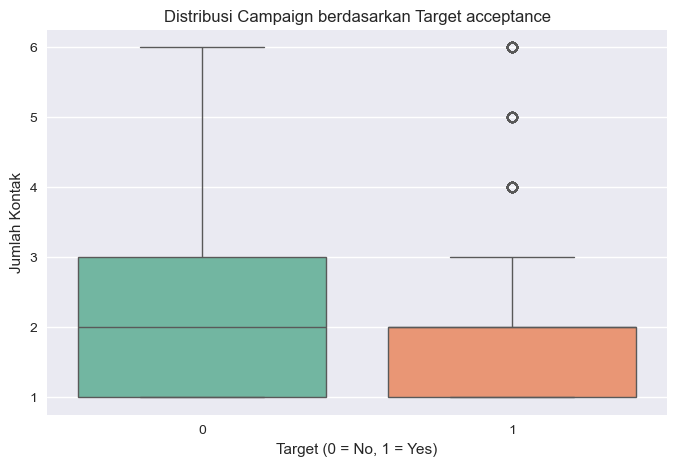

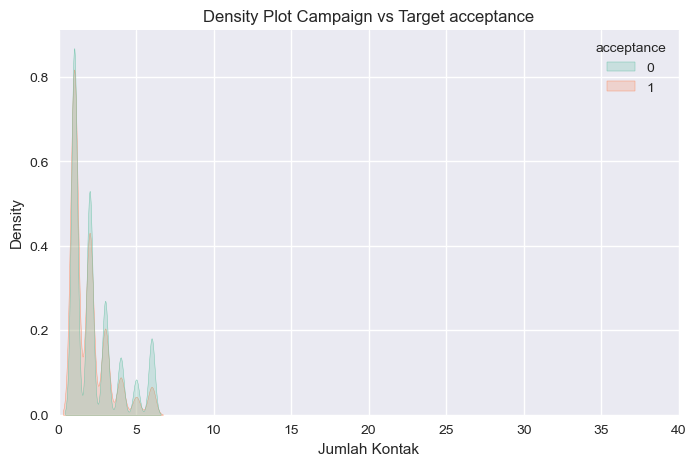

In [195]:
# Boxplot Campaign vs acceptance
plt.figure(figsize=(8,5))
sns.boxplot(x="acceptance", y="campaign", hue="acceptance", data=df, palette="Set2", legend=False)
plt.title("Distribusi Campaign berdasarkan Target acceptance", fontsize=12)
plt.xlabel("Target (0 = No, 1 = Yes)")
plt.ylabel("Jumlah Kontak")
plt.show()

# Density Plot Campaign vs acceptance
plt.figure(figsize=(8,5))
sns.kdeplot(data=df, x="campaign", hue="acceptance", common_norm=False, fill=True, palette="Set2")
plt.title("Density Plot Campaign vs Target acceptance", fontsize=12)
plt.xlabel("Jumlah Kontak")
plt.xlim(0, 40)   # pembatas agar tidak terlalu dipengaruhi outlier >40
plt.show()

***
**Insight**
***
- Boxplot → 
    - Median `campaign` untuk `acceptance = 1` lebih rendah dibanding `acceptance = 0`.
- Density Plot →
    - Sebagian besar `acceptance = 1` terjadi pada kontak 1–3 kali.
    - `acceptance = 0` masih muncul meski kontak sudah sangat sering dilakukan.

- Kesimpulan : 
    - Peluang keberhasilan kampanye lebih besar ketika nasabah hanya dihubungi sedikit (1–3 kali).
    - Semakin sering dihubungi, semakin tinggi kemungkinan mereka menolak karena (**customer fatigue effect**).
    - Dari sisi bisnis, ini berarti bank sebaiknya membatasi jumlah panggilan agar tidak menimbulkan kesan mengganggu.
    - Fokus pada kualitas interaksi (skrip telepon yang baik, timing yang tepat) akan lebih efektif meningkatkan konversi dan menekan biaya call center dibanding sekadar menambah frekuensi panggilan.

****
##### 4.1.2.3 Pdays vs Target (`acceptance`)
****
- Menganalisis apakah jumlah hari sejak nasabah terakhir kali dihubungi `(pdays)` memengaruhi hasil kampanye (acceptance : 0=No, 1=Yes).
- Fitur ini penting karena menunjukkan apakah nasabah yang pernah dihubungi sebelumnya lebih mungkin berlangganan.

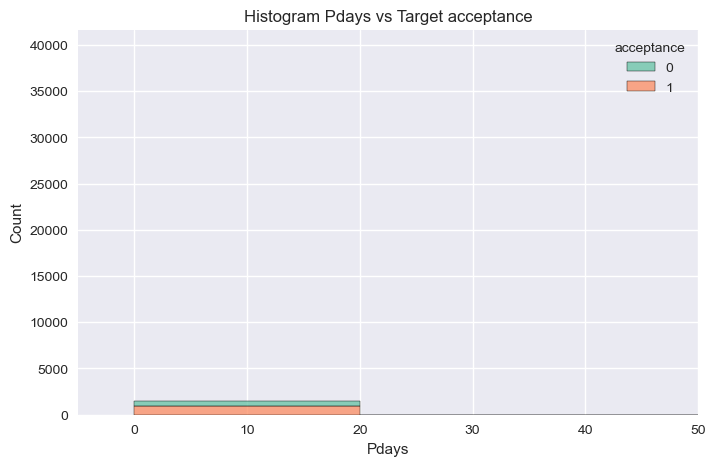

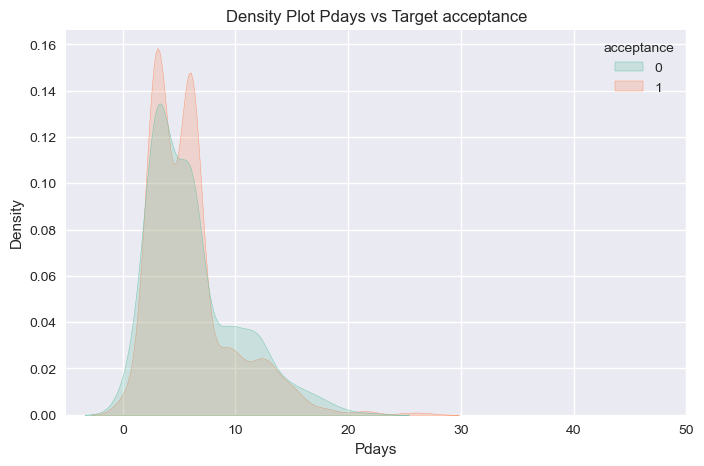

In [196]:
# Histogram Pdays vs acceptance
plt.figure(figsize=(8,5))
sns.histplot(data=df, x="pdays", hue="acceptance", multiple="stack", bins=50, palette="Set2")
plt.title("Histogram Pdays vs Target acceptance", fontsize=12)
plt.xlabel("Pdays")
plt.xlim(-5, 50)
plt.show()

# Density Plot Pdays vs acceptance
plt.figure(figsize=(8,5))
sns.kdeplot(data=df[df['pdays'] < 999], x="pdays", hue="acceptance", common_norm=False, fill=True, palette="Set2")
plt.title("Density Plot Pdays vs Target acceptance", fontsize=12)
plt.xlabel("Pdays")
plt.xlim(-5, 50)
plt.show()

***
**Insight**
***

- Histogram →
    - Mayoritas nilai `pdays` adalah 999 → artinya nasabah belum pernah dihubungi sebelumnya.
    - Pada kategori 999, didominasi oleh `acceptance = 0` (nasabah menolak).
- Density (tanpa 999) →
    - Untuk nasabah yang pernah dihubungi sebelumnya (`pdays < 999`), distribusi terlihat lebih menyebar.
    - Peluang `acceptance = 1` relatif lebih tinggi dibandingkan kelompok `pdays = 999`.
    - Ada kecenderungan semakin kecil nilai `pdays`, semakin tinggi kemungkinan respon positif.
- Kesimpulan : 
    - Nasabah yang belum pernah dihubungi (`pdays = 999`) cenderung menolak, sementara nasabah yang pernah dihubungi sebelumnya memiliki peluang konversi lebih tinggi.
    - Dari sisi bisnis, pdays menjadi indikator penting untuk memprioritaskan `warm leads` (nasabah yang baru-baru ini dihubungi).
    - Bank dapat mengarahkan kampanye secara lebih efektif dengan memfokuskan agen call center pada kelompok ini, karena mereka lebih reseptif dan berpotensi meningkatkan CVR, sekaligus mengurangi biaya pada kontak yang sia-sia.

****
##### 4.1.2.4 Month vs Target (`acceptance`)
****
- Menganalisis apakah bulan terjadinya kampanye (month) berpengaruh terhadap hasil (acceptance : 0=No, 1=Yes).
- Fitur ini penting karena musim / periode tertentu bisa memengaruhi keberhasilan penawaran deposito.

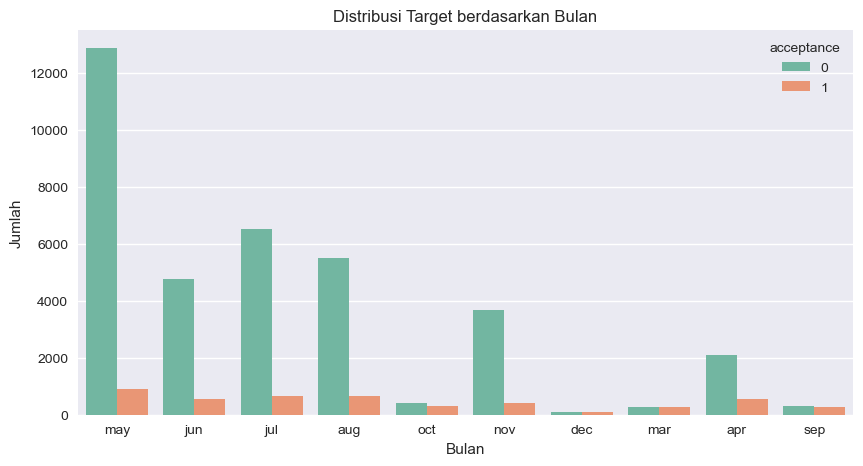

In [197]:
plt.figure(figsize=(10,5))
sns.countplot(
    data=df, x="month", hue="acceptance",
    palette="Set2"
)
plt.title("Distribusi Target berdasarkan Bulan", fontsize=12)
plt.xlabel("Bulan")
plt.ylabel("Jumlah")
plt.show()

***
**Insight**
***

- Distribusi kontak kampanye sangat tidak merata antar bulan.
    - Bulan Mei memiliki jumlah kontak paling banyak (outlier dibanding bulan lain).
    - Juli, Agustus, dan Juni juga cukup tinggi, sedangkan Desember sangat sedikit.
- Proporsi `acceptance = 1` (Yes) relatif lebih tinggi di bulan tertentu, misalnya Maret, September, dan Desember, meski jumlah total kampanye di bulan-bulan ini kecil.
- Bulan dengan kampanye masif (Mei, Juli, Agustus) justru tidak selalu memberikan proporsi keberhasilan yang lebih baik.

- Kesimpulan :
    - **Jumlah kontak terbanyak tidak menjamin keberhasilan tertinggi.**
    - Bulan dengan kampanye kecil justru kadang menghasilkan persentase konversi lebih tinggi → kemungkinan dipengaruhi faktor eksternal (misalnya kondisi ekonomi, musim liburan, atau strategi promosi saat itu).
    - Dari sisi bisnis, ini berarti perencanaan waktu kampanye sangat krusial : bank sebaiknya tidak hanya menambah volume panggilan, tetapi juga memperhatikan timing.
    - Fitur `month` bisa menjadi faktor penting dalam model prediksi, karena memberikan gambaran kapan peluang konversi lebih tinggi, sehingga bank dapat mengatur jadwal kampanye yang lebih efektif dan hemat biaya.

****
#### 4.1.3 Korelasi Heatmap
****

- Langkah ini untuk melihat apakah ada multikolinearitas (fitur sangat berkorelasi) dan memahami hubungan antar indikator ekonomi, durasi, usia, dsb.

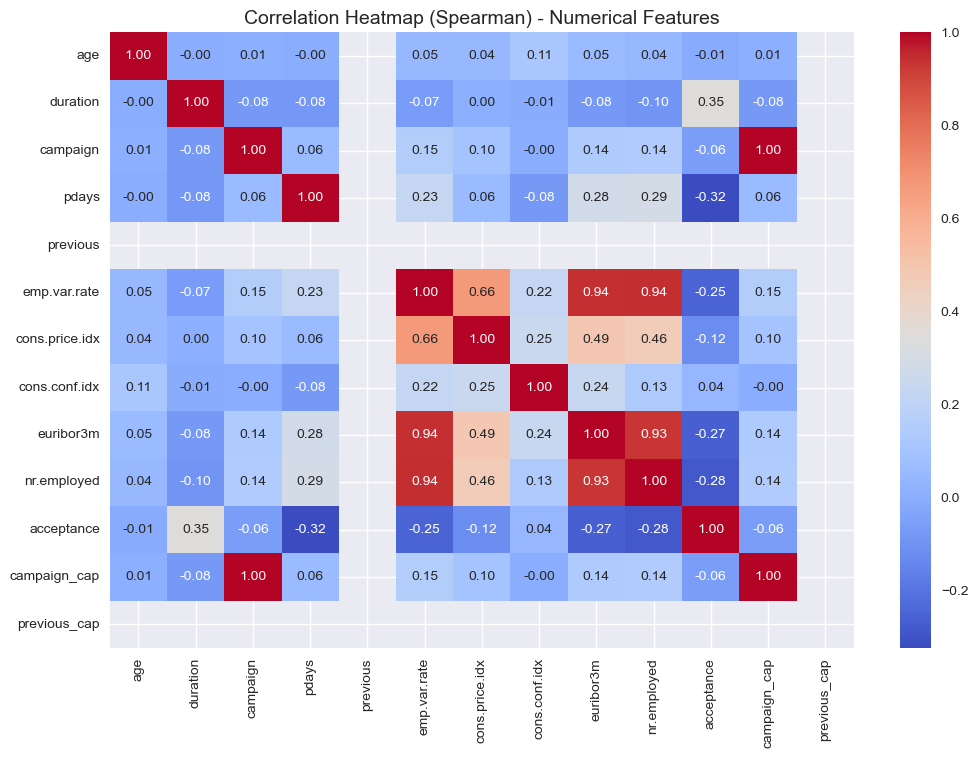

In [198]:
# Ambil fitur numerik + target
num_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Hitung korelasi (Spearman lebih cocok karena banyak distribusi tidak normal)
corr_matrix = df[num_cols].corr(method='spearman')

# Plot heatmap
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap (Spearman) - Numerical Features", fontsize=14)
plt.show()

***
**Insight**
***
| Fitur              | Korelasi dengan `acceptance` | Interpretasi & Implikasi Bisnis                                                                                                                              |
| ------------------ | ------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------ |
| **duration**       | +0.35               | Panggilan lebih lama → peluang *yes* lebih tinggi. → Fokuskan tim pemasaran untuk memperdalam interaksi dengan nasabah yang bertahan lama di telepon.                 |
| **emp.var.rate**   | -0.25               | Saat indikator ekonomi makro positif, konversi justru menurun. → Bisa jadi nasabah merasa kondisi ekonomi sudah baik sehingga tidak butuh deposito tambahan. |
| **euribor3m**      | -0.27               | Suku bunga tinggi → nasabah lebih jarang berlangganan. → Bank perlu menyesuaikan strategi pricing/promosi saat bunga naik.                                   |
| **nr.employed**    | -0.28               | Jumlah tenaga kerja tinggi → konversi lebih rendah. → Mungkin karena nasabah lebih percaya pada pendapatan aktif, bukan produk deposito.                     |
| **age**            | -0.01               | Hampir tidak ada hubungan. → Segmentasi usia bukan faktor dominan, jangan dijadikan fokus utama strategi.                                                    |
| **campaign**       | -0.06               | Semakin sering dihubungi → peluang *yes* sedikit menurun (customer fatigue). → Batasi jumlah follow-up agar tidak mengganggu nasabah.                        |
| **pdays**          | +0.04               | Korelasi sangat kecil. → Riwayat kontak sebelumnya hanya sedikit membantu; lebih efektif bila dipadukan dengan faktor lain.                                  |
| **previous**       | +0.04               | Korelasi sangat kecil. → Mirip dengan `pdays`, bukan faktor tunggal, tapi bisa mendukung segmentasi.                                                         |
| **cons.price.idx** | -0.12               | Hubungan lemah dan negatif. → Kondisi harga konsumen bisa memengaruhi daya beli; strategi kampanye perlu adaptif.                                            |
| **cons.conf.idx**  | +0.04               | Hubungan lemah dan positif. → Saat kepercayaan konsumen naik, peluang sedikit lebih tinggi; bisa dimanfaatkan untuk timing kampanye.                         |


- Fitur paling relevan dengan target: `duration` (positif).
- Fitur ekonomi (`emp.var.rate`, `euribor3m`, `nr.employed`) → korelasi negatif moderat.
- Sebagian besar fitur lain → hubungan lemah dengan target.

****
### 4.2 Categorical Features Analysis

****
#### 4.2.1 Distribusi Data
****

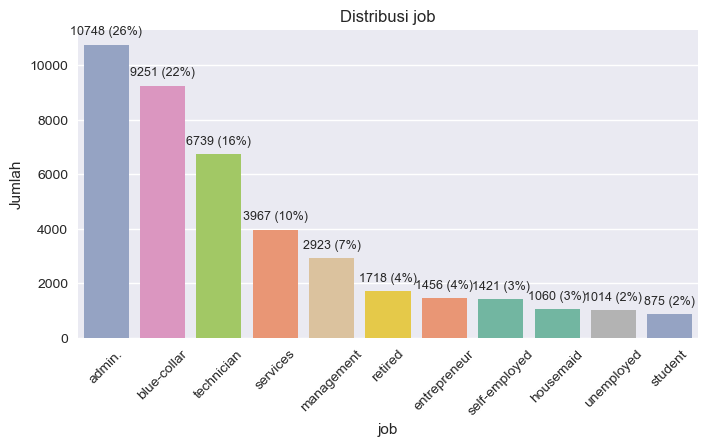

👉 Insight job : Mayoritas bekerja di sektor admin, blue-collar, dan teknisi. Student / unemployed/ housemaid sangat kecil.



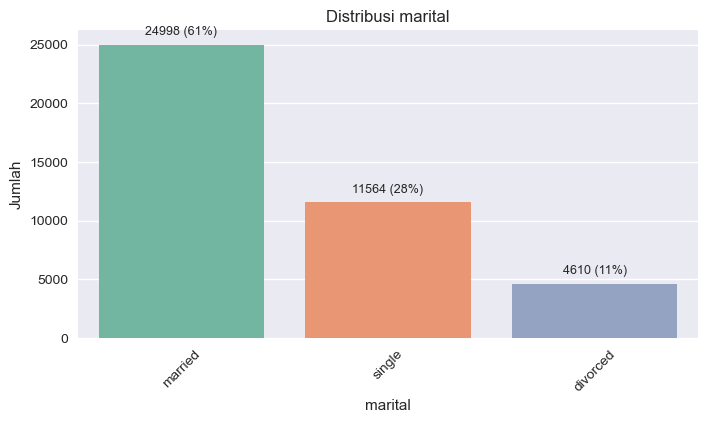

👉 Insight marital : Mayoritas menikah, diikuti single. Divorced jauh lebih sedikit.



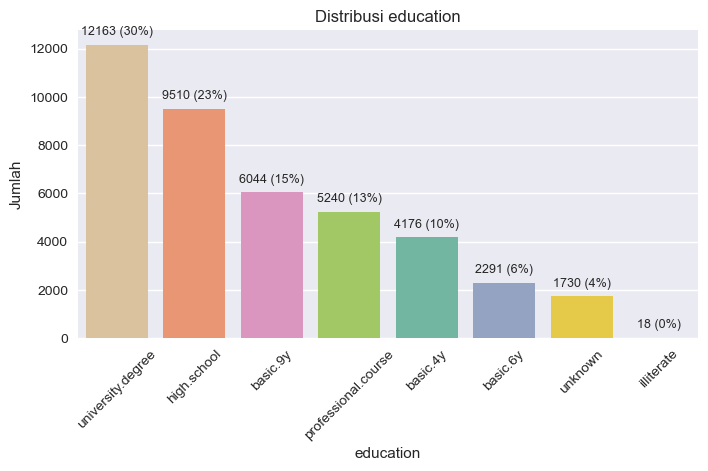

👉 Insight education : Pendidikan tertinggi: university degree & high school. Illiterate hampir tidak ada.



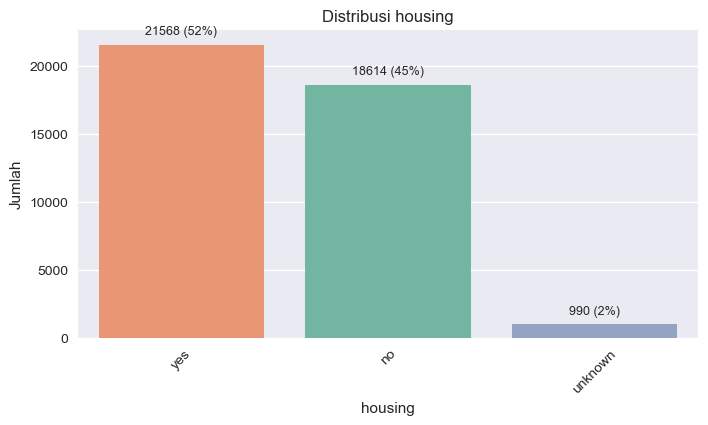

👉 Insight housing : Mayoritas punya kredit rumah. Distribusi Yes vs No cukup seimbang. 'Other' sangat jarang.



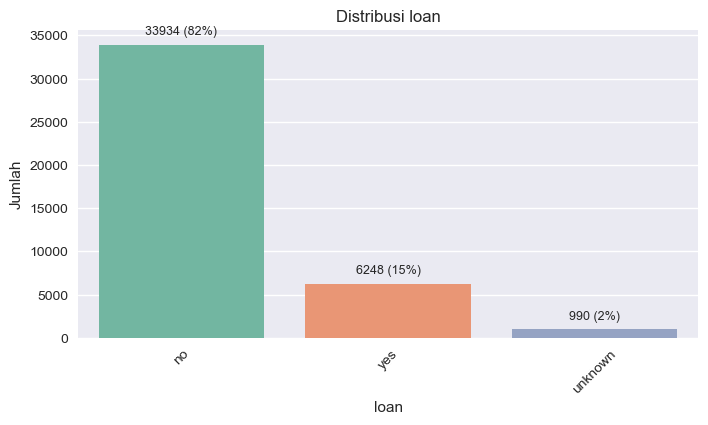

👉 Insight loan : Mayoritas tidak punya personal loan. 'Yes' cukup signifikan, 'Other' sangat kecil.



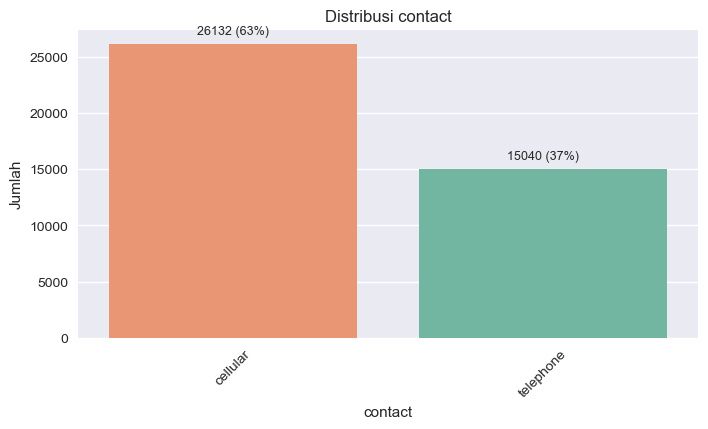

👉 Insight contact : Sebagian besar dihubungi via cellular (handphone). Telephone masih ada tapi lebih sedikit.



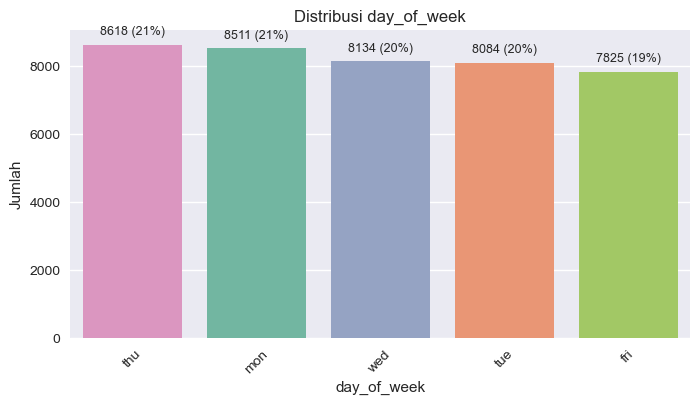

👉 Insight day_of_week : Distribusi cukup merata Senin–Jumat, sedikit lebih tinggi Kamis & Senin.



In [199]:
# Ambil semua fitur kategorikal
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

# Pastikan 'acceptance' tidak masuk
if 'acceptance' in cat_cols:
    cat_cols.remove('acceptance')

# Fitur yang tidak cocok divisualisasikan dengan countplot biasa
skip_cols = ['month', 'poutcome', 'default', 'pdays_flag']

# Loop visualisasi fitur kategorikal
for col in cat_cols:
    if col in skip_cols:
        continue  # lewati fitur ini
    
    plt.figure(figsize=(8,4))
    ax = sns.countplot(
        data=df,
        x=col,
        hue=col,
        order=df[col].value_counts().index,
        palette="Set2",
        legend=False
    )
    plt.title(f"Distribusi {col}", fontsize=12)
    plt.xticks(rotation=45)
    plt.xlabel(col)
    plt.ylabel("Jumlah")
    
    # Hitung total untuk persentase
    total = len(df)
    
    # Tambahkan label jumlah + persentase
    for p in ax.patches:
        height = p.get_height()
        percent = 100 * height / total
        ax.annotate(
            f'{int(height)} ({int(round(percent))}%)',
            (p.get_x() + p.get_width() / 2., height),
            ha='center', va='bottom',
            fontsize=9, xytext=(0, 5), textcoords='offset points'
        )
    
    plt.show()
    
    # Tambahkan insight singkat
    cat_insights = {
    "job": "Mayoritas bekerja di sektor admin, blue-collar, dan teknisi. Student / unemployed/ housemaid sangat kecil.",
    "marital": "Mayoritas menikah, diikuti single. Divorced jauh lebih sedikit.",
    "education": "Pendidikan tertinggi: university degree & high school. Illiterate hampir tidak ada.",
    "housing": "Mayoritas punya kredit rumah. Distribusi Yes vs No cukup seimbang. 'Other' sangat jarang.",
    "loan": "Mayoritas tidak punya personal loan. 'Yes' cukup signifikan, 'Other' sangat kecil.",
    "contact": "Sebagian besar dihubungi via cellular (handphone). Telephone masih ada tapi lebih sedikit.",
    "day_of_week": "Distribusi cukup merata Senin–Jumat, sedikit lebih tinggi Kamis & Senin.",
    }

    if col in cat_insights:
        print(f"👉 Insight {col} : {cat_insights[col]}\n")

***
**Summary**
***
| Fitur             | Kategori Dominan               | Distribusi & Insight Utama                                                                                                 |
| ----------------- | ------------------------------ | -------------------------------------------------------------------------------------------------------------------------- |
| **job**           | Admin, Blue-collar, Technician | Mayoritas bekerja di sektor admin/pekerja manual/teknisi. Beberapa kategori (student, unemployed, housemaid) sangat kecil. |
| **marital**       | Married                        | Mayoritas menikah, diikuti single. Divorced jauh lebih kecil.                                                              |
| **education**     | University degree, High school | Pendidikan tinggi (S1) dan SMA paling banyak. Kategori `illiterate` sangat jarang.                                         |
| **housing**       | Yes                            | Sebagian besar punya kredit rumah, distribusi cukup seimbang antara Yes dan No. Kategori `other` sangat sedikit.           |
| **loan**          | No                             | Mayoritas tidak punya personal loan. Kategori `Yes` cukup signifikan, sedangkan `other` sangat kecil.                      |
| **contact**       | Cellular                       | Mayoritas kontak lewat handphone. Telephone masih digunakan tetapi lebih sedikit.                                          |
| **day\_of\_week** | Thu, Mon                       | Distribusi relatif merata sepanjang Senin–Jumat, sedikit lebih tinggi pada Kamis & Senin.                                  |

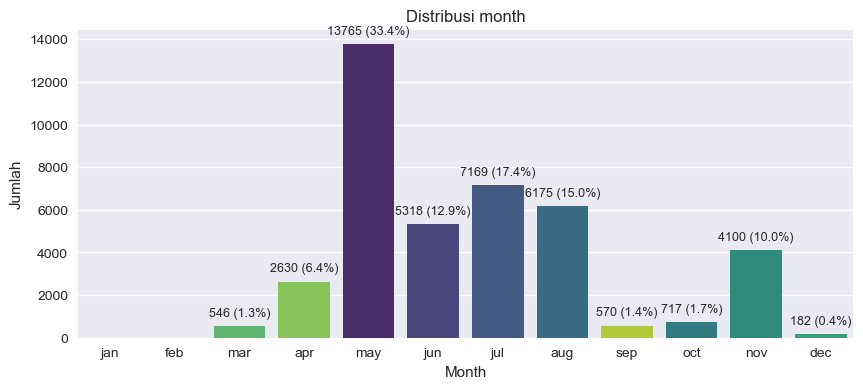

👉 Insight month: Kampanye paling sering dilakukan di bulan Mei, Juni, dan Juli. Bulan lain jauh lebih sedikit.


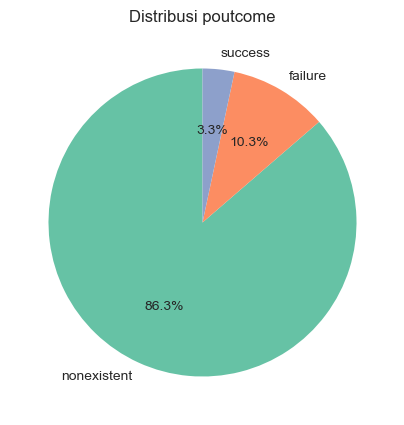

👉 Insight poutcome: Mayoritas nasabah belum pernah dihubungi sebelumnya (nonexistent). Hanya sebagian kecil yang pernah, dengan outcome success atau failure.


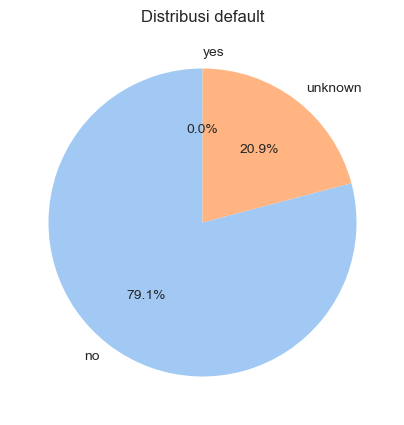

👉 Insight default: Hampir semua nasabah tidak dalam kondisi default. Kategori 'yes' sangat jarang.


In [200]:
# 1. month → urutkan sesuai kalender
order_month = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
plt.figure(figsize=(10,4))
ax = sns.countplot(data=df, x='month', hue='month', order=order_month, palette="viridis", legend=False)
plt.title("Distribusi month", fontsize=12)
plt.xlabel("Month")
plt.ylabel("Jumlah")

total = len(df)
for p in ax.patches:
    height = p.get_height()
    percent = 100 * height / total
    ax.annotate(f'{int(height)} ({percent:.1f}%)',
                (p.get_x() + p.get_width()/2., height),
                ha='center', va='bottom', fontsize=9, xytext=(0,5), textcoords='offset points')
plt.show()

print("👉 Insight month: Kampanye paling sering dilakukan di bulan Mei, Juni, dan Juli. Bulan lain jauh lebih sedikit.")

# 2. poutcome → pie chart biar kelihatan proporsinya
pout_counts = df['poutcome'].value_counts()
plt.figure(figsize=(5,5))
plt.pie(pout_counts, labels=pout_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("Set2"))
plt.title("Distribusi poutcome")
plt.show()

print("👉 Insight poutcome: Mayoritas nasabah belum pernah dihubungi sebelumnya (nonexistent). Hanya sebagian kecil yang pernah, dengan outcome success atau failure.")

# 3. default → pie chart sederhana
def_counts = df['default'].value_counts()
plt.figure(figsize=(5,5))
plt.pie(def_counts, labels=def_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette("pastel"))
plt.title("Distribusi default")
plt.show()

print("👉 Insight default: Hampir semua nasabah tidak dalam kondisi default. Kategori 'yes' sangat jarang.")

****
**Summary**
****
| Fitur        | Kategori Dominan | Distribusi & Insight Utama                                                                                                          |
| ------------ | ---------------- | ----------------------------------------------------------------------------------------------------------------------------------- |
| **month**    | May, Jun, Jul    | Aktivitas kampanye paling banyak terjadi di bulan Mei, Juni, dan Juli. Bulan lain jauh lebih sedikit.                               |
| **poutcome** | Nonexistent      | Hampir semua nasabah belum pernah dihubungi sebelumnya. Hanya sebagian kecil yang pernah dihubungi, dengan outcome success/failure. |
| **default**  | No               | Hampir semua nasabah tidak dalam kondisi default. Kategori `Yes` sangat jarang sehingga kurang berpengaruh.                         |

****
#### 4.2.2 Categorical Features vs Target
****
- Tujuan: melihat seberapa besar peluang konversi (acceptance = yes) di setiap kategori.
- Caranya: ambil mean dari y_encoded (1 = yes, 0 = no) → hasilnya adalah conversion rate per kategori.

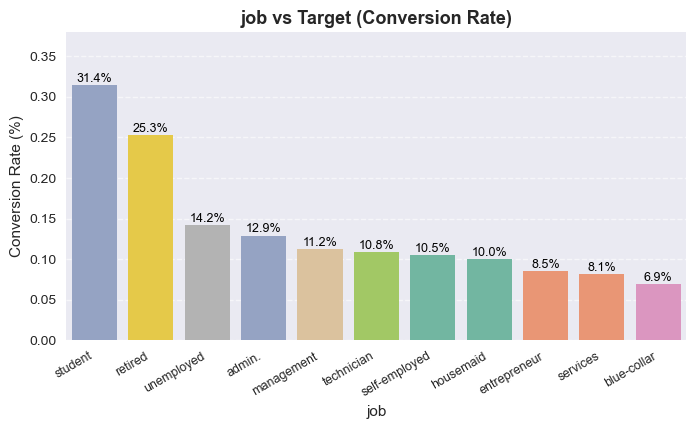

👉 Insight job: Student (31%) & Retired (25%) = segmen paling responsif → target utama kampanye.



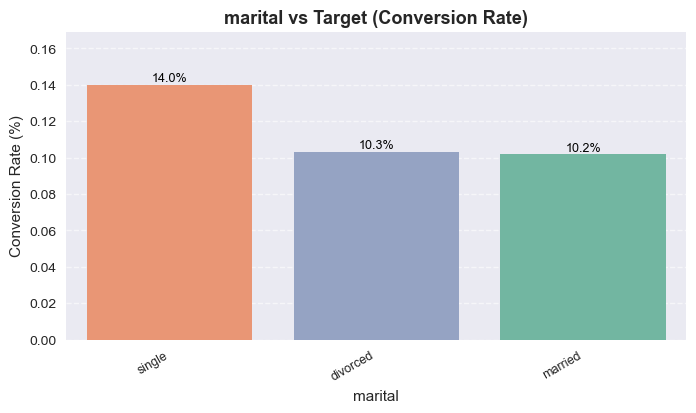

👉 Insight marital: Single (14%) lebih mudah dikonversi; strategi komunikasi bisa lebih fleksibel.



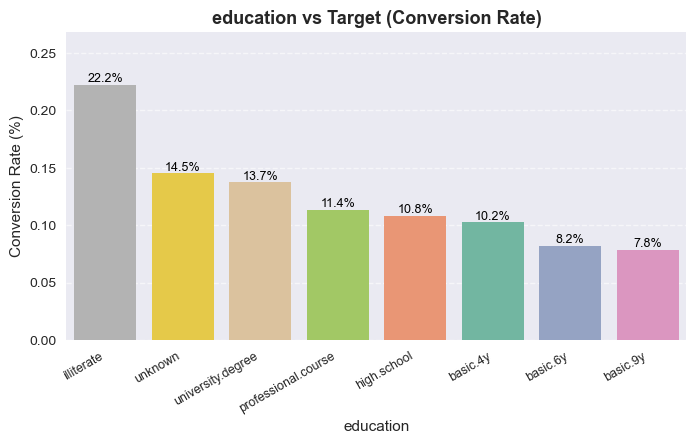

👉 Insight education: University (14%) & Illiterate (22%) → pendidikan tinggi lebih prospektif.



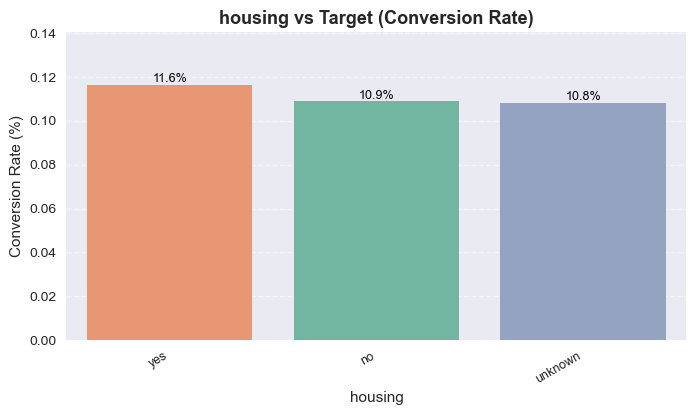

👉 Insight housing: Punya KPR (12%) sedikit lebih prospektif → tawarkan deposito sebagai tabungan tambahan.



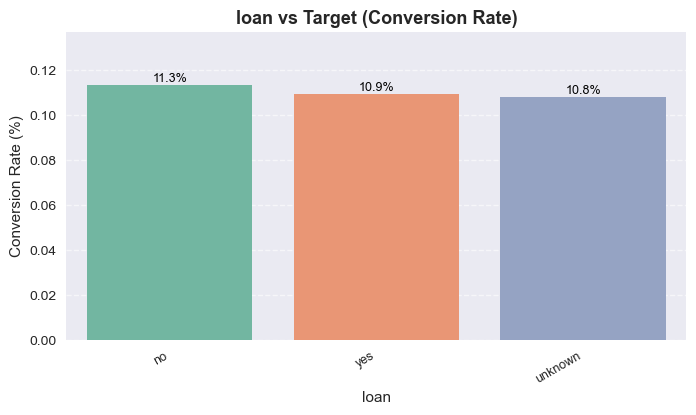

👉 Insight loan: CR relatif sama (~11%) → bukan faktor utama segmentasi.



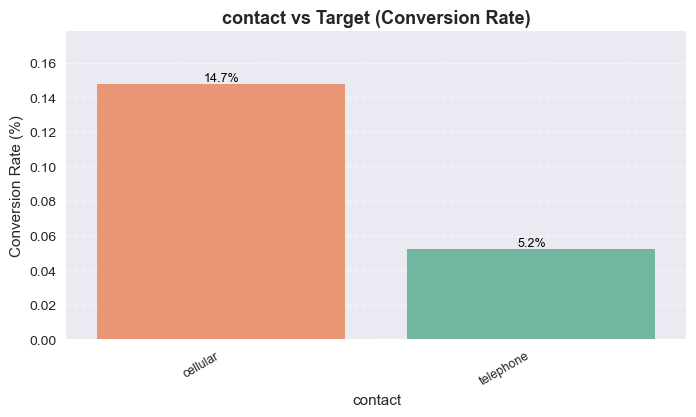

👉 Insight contact: Cellular (15%) jauh lebih efektif daripada telephone → fokus ke ponsel.



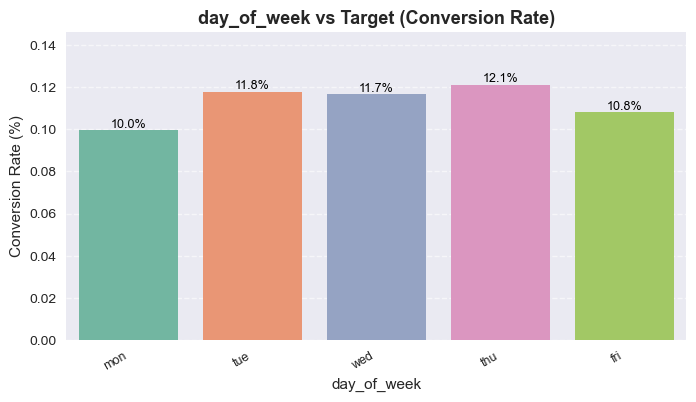

👉 Insight day_of_week: Mid-week (Tue–Thu, ~12%) lebih efektif → jadwalkan telemarketing Selasa–Kamis.



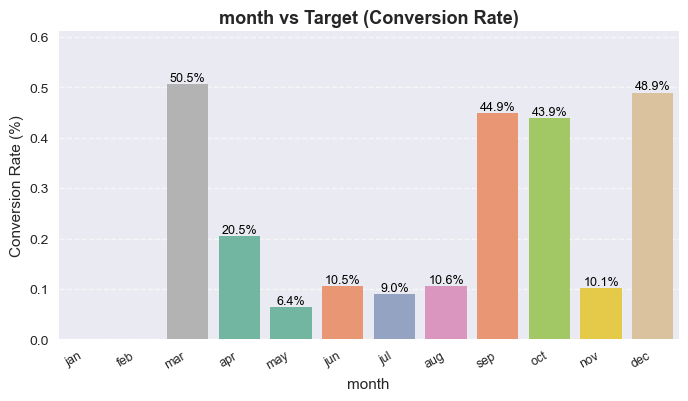

👉 Insight month: Mar (51%), Dec (49%), Sep (45%), Oct (44%) jauh lebih sukses dibanding Mei (6%).



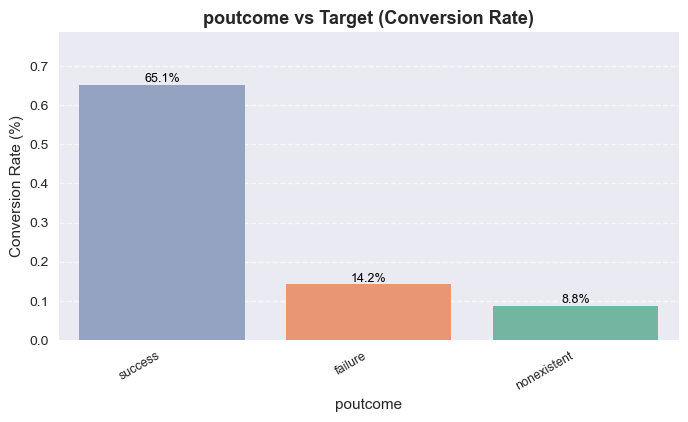

👉 Insight poutcome: Success (65%) = warm leads dengan peluang sangat tinggi → perlu diprioritaskan.



In [201]:
# Pastikan target sudah di-encode
df['y_encoded'] = df['acceptance'].astype(int)

# Fitur yang cocok divisualisasikan
vis_cols = ['job', 'marital', 'education', 'housing', 
            'loan', 'contact', 'day_of_week', 'month', 'poutcome']

# Dictionary insight singkat
insight_dict = {
    "job" : "Student (31%) & Retired (25%) = segmen paling responsif → target utama kampanye.",
    "marital" : "Single (14%) lebih mudah dikonversi; strategi komunikasi bisa lebih fleksibel.",
    "education" : "University (14%) & Illiterate (22%) → pendidikan tinggi lebih prospektif.",
    "housing" : "Punya KPR (12%) sedikit lebih prospektif → tawarkan deposito sebagai tabungan tambahan.",
    "loan" : "CR relatif sama (~11%) → bukan faktor utama segmentasi.",
    "contact" : "Cellular (15%) jauh lebih efektif daripada telephone → fokus ke ponsel.",
    "day_of_week" : "Mid-week (Tue–Thu, ~12%) lebih efektif → jadwalkan telemarketing Selasa–Kamis.",
    "month" : "Mar (51%), Dec (49%), Sep (45%), Oct (44%) jauh lebih sukses dibanding Mei (6%).",
    "poutcome" : "Success (65%) = warm leads dengan peluang sangat tinggi → perlu diprioritaskan."
}

# Urutan khusus
order_month = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']
order_day = ['mon','tue','wed','thu','fri']

# Loop visualisasi
for col in vis_cols:
    plt.figure(figsize=(8,4))
    
    # month → urutan kalender
    if col == 'month':
        order = order_month
    # day_of_week → urutan hari kerja
    elif col == 'day_of_week':
        order = order_day
    # lainnya → urut dari conversion rate terbesar
    else:
        order = (
            df.groupby(col)['y_encoded']
              .mean()
              .sort_values(ascending=False)
              .index
        )
    
    ax = sns.barplot(
        data=df, x=col, y='y_encoded', hue=col,
        order=order, palette="Set2",
        errorbar=None, dodge=False, legend=False
    )
    
    plt.title(f"{col} vs Target (Conversion Rate)", fontsize=13, fontweight='bold')
    plt.xticks(rotation=30, ha='right', fontsize=9)
    plt.xlabel(col, fontsize=11)
    plt.ylabel("Conversion Rate (%)", fontsize=11)
    
    # Tambahkan grid horizontal
    ax.yaxis.grid(True, linestyle='--', alpha=0.6)
    ax.set_axisbelow(True)
    
    # Atur batas Y lebih tinggi sedikit
    ax.set_ylim(0, ax.get_ylim()[1] * 1.15)

    # Tambahkan label persen di atas bar
    for p in ax.patches:
        height = p.get_height()
        ax.text(
            p.get_x() + p.get_width()/2,
            height + (ax.get_ylim()[1] * 0.01),
            f'{height*100:.1f}%',
            ha="center", fontsize=9, color='black'
        )
    
    plt.show()
    
    # Cetak insight setelah visualisasi
    if col in insight_dict:
        print(f"👉 Insight {col}: {insight_dict[col]}\n")

***
**Insight**
***
| Fitur           | Kategori dengan CR Tinggi                  | CR (%) | Insight & Implikasi Bisnis                                                                           |
| --------------- | ------------------------------------------ | ------ | ---------------------------------------------------------------------------------------------------- |
| **Job**         | Student (31%), Retired (25%)               | 31, 25 | Segmen mahasiswa & pensiunan jauh lebih responsif; bisa dijadikan **target utama kampanye**.         |
| **Marital**     | Single (14%)                               | 14     | Nasabah lajang lebih mudah dikonversi; **strategi komunikasi** bisa lebih fleksibel.                 |
| **Education**   | Illiterate (22%), University (14%)         | 22, 14 | Pendidikan tinggi → peluang lebih besar; meski jumlah kecil, kategori illiterate perlu diperhatikan. |
| **Housing**     | Yes (12%)                                  | 12     | Punya KPR sedikit lebih prospektif; bisa ditawarkan deposito sebagai **tabungan tambahan**.          |
| **Loan**        | Hampir sama                                | \~11   | Tidak signifikan; **bukan prioritas utama** dalam segmentasi.                                        |
| **Contact**     | Cellular (15%)                             | 15     | Ponsel lebih efektif daripada telepon rumah; kampanye sebaiknya **difokuskan ke cellular**.          |
| **Month**       | Mar (51%), Dec (49%), Sep (45%), Oct (44%) | 44–51  | Timing kampanye sangat penting; bulan-bulan ini jauh lebih sukses dibanding May (6%).                |
| **Day of Week** | Tue–Thu (11–12%)                           | \~12   | Mid-week lebih efektif; jadwal telemarketing bisa **difokuskan Selasa–Kamis**.                       |
| **Poutcome**    | Success (65%)                              | 65     | Riwayat sukses kampanye sebelumnya = **warm leads** dengan peluang konversi sangat tinggi.           |


- Profil paling potensial : mahasiswa, pensiunan, single, berpendidikan tinggi, tidak ada default, kontak via ponsel.
- Timing penting : bulan Maret, September, Oktober, Desember jauh lebih efektif → indikasi pengaruh faktor musiman/ekonomi.
- Riwayat kampanye  poutcome = success menjadi indikator paling kuat → bank sebaiknya prioritaskan nasabah ini.
- Kurang relevan : loan tidak banyak membedakan tingkat konversi.

****
#### 4.2.3 Job × Education vs Conversion Rate
****
- Pada tahap ini, kita melakukan analisis multivariat dengan melihat rata-rata conversion rate (y_encoded) berdasarkan kombinasi job dan education. 
- Analisis ini dipilih karena keduanya merupakan variabel penting yang merepresentasikan profil dan segmentasi nasabah. Dengan menggabungkan pekerjaan dan tingkat pendidikan, kita dapat menemukan segmen yang lebih spesifik yang memiliki peluang konversi lebih tinggi.

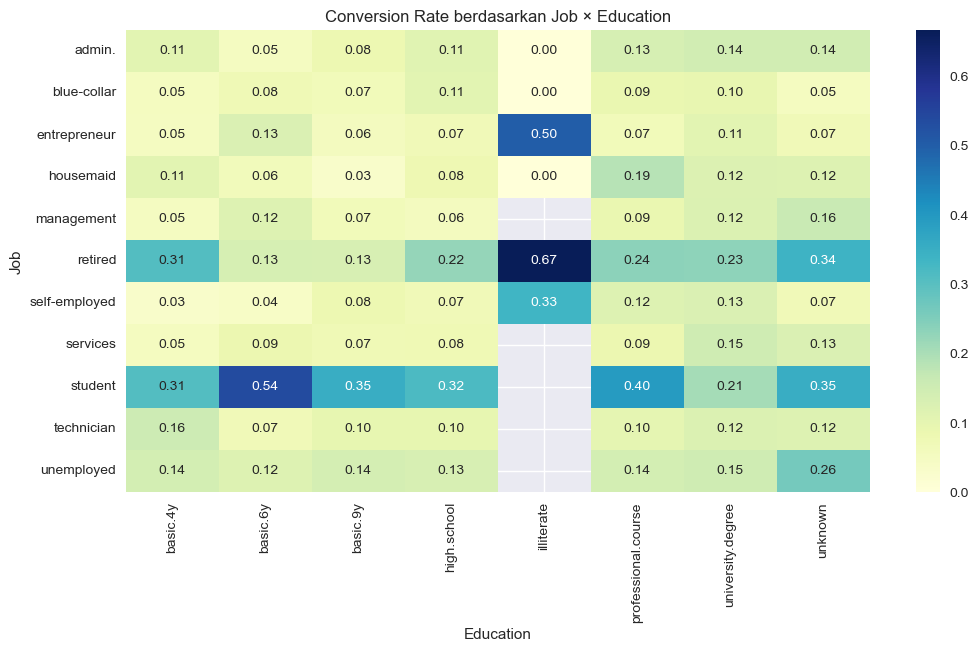

In [202]:
# Crosstab Job × Education
ct = pd.crosstab(df['job'], df['education'], values=df['y_encoded'], aggfunc='mean')

plt.figure(figsize=(12,6))
sns.heatmap(ct, annot=True, cmap="YlGnBu", fmt=".2f")
plt.title("Conversion Rate berdasarkan Job × Education")
plt.xlabel("Education")
plt.ylabel("Job")
plt.show()

***
**Insight**
***
- Segmen `student` dan `retired` menunjukkan conversion rate jauh lebih tinggi dibanding pekerjaan lain → **kelompok ini bisa dijadikan target utama kampanye** karena lebih responsif.
- Pendidikan `university degree` cenderung meningkatkan peluang keberhasilan kampanye → nasabah berpendidikan tinggi perlu **pendekatan komunikasi yang lebih informatif** agar tertarik.
- Kombinasi seperti `management` + `university degree` atau `student` + `secondary/university` memiliki CR lebih tinggi dari rata-rata → **segmentasi berbasis profesi + pendidikan** bisa menghasilkan strategi telemarketing yang lebih efisien.
- Pemilihan kombinasi ini penting karena bank dapat **memfokuskan sumber daya pada segmen berpotensi tinggi**, sehingga biaya kampanye menurun sementara peluang konversi meningkat.

****
### 4.3 Feature Engineering
****
- Pada tahap ini, dataset yang sudah melalui proses cleaning dan EDA akan dipersiapkan lebih lanjut agar siap digunakan dalam proses modeling. Tahapan feature engineering ini mencakup beberapa langkah penting :

- Data Splitting
    - Data dipisah jadi train dan test sejak awal supaya kinerja model bisa diuji pada data yang benar-benar baru, bukan pada data yang sudah pernah dipelajari.
- Encoding (Categorical Features)
    - Kolom kategorikal diubah ke angka dengan One-Hot Encoding agar informasi seperti pekerjaan atau pendidikan tetap bisa dimanfaatkan oleh model.
- Scaling (Numerical Features)
    - Fitur numerik distandarisasi supaya skala variabel seragam, sehingga faktor seperti jumlah kontak dan kondisi ekonomi diperlakukan seimbang oleh model.
- Resampling (Handling Imbalance)
    - Karena kelas target timpang (nasabah “yes” hanya ~11%), dilakukan resampling agar model tidak bias ke mayoritas dan tetap bisa mengenali calon nasabah yang berpotensi menerima tawaran.
- Feature Selection
    - Dilakukan pemilihan fitur dengan RFECV untuk menyaring hanya variabel yang benar-benar relevan, sehingga model lebih ringkas dan fokus pada faktor penting.
- Pipeline Setup
    - Semua langkah digabung dalam satu alur otomatis supaya proses konsisten dan mudah dijalankan ulang saat ada data kampanye berikutnya.

****
#### 4.3.1 Data Splitting
****
- Pada tahap ini, dataset perlu dibagi menjadi train set dan test set.
    - Train set digunakan untuk melatih model.
    - Test set digunakan untuk menguji performa model pada data yang belum pernah dilihat.
    - Karena target acceptance imbalanced (≈88% No vs 12% Yes), pembagian dilakukan dengan stratified split agar proporsi target tetap sama di train dan test.

In [203]:
# Jika sempat membuat y_encoded untuk visualisasi, buang sebelum modeling
if 'y_encoded' in df.columns:
    df = df.drop(columns=['y_encoded'])

In [204]:
# Pisahkan fitur (X) dan target (acceptance)
X = df.drop("acceptance", axis=1)
y = df["acceptance"]

# Split train-test
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,       # 80% train, 20% test
    stratify=y,          # menjaga distribusi target sama
    random_state=42      # untuk reproduktibilitas
)

# Cek hasil distribusi
print("Jumlah data train :", X_train.shape[0])
print("Jumlah data test  :", X_test.shape[0])
print("\nDistribusi target (train):")
print(y_train.value_counts(normalize=True) * 100)
print("\nDistribusi target (test):")
print(y_test.value_counts(normalize=True) * 100)


Jumlah data train : 32937
Jumlah data test  : 8235

Distribusi target (train):
acceptance
0    88.733036
1    11.266964
Name: proportion, dtype: float64

Distribusi target (test):
acceptance
0    88.731026
1    11.268974
Name: proportion, dtype: float64


****
#### 4.3.2 Encoding & Scaling with ColumnTransformer
****
- Pada tahap ini dilakukan dua proses sekaligus menggunakan ColumnTransformer :
    - Encoding → mengubah fitur kategorikal menjadi numerik dengan One-Hot Encoding.
    - Scaling → menstandarisasi fitur numerik dengan StandardScaler.
- Menggabungkan keduanya dalam satu ColumnTransformer memastikan seluruh transformasi konsisten, rapi, dan siap dipakai pada tahap selanjutnya (SMOTE dan Modeling).

In [205]:
# Identifikasi fitur kategorikal & numerik
cat_features = X_train.select_dtypes(include=["object"]).columns.tolist()
num_features = X_train.select_dtypes(include=["int64", "float64"]).columns.tolist()

# ColumnTransformer: gabungkan encoding + scaling
preprocessor = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(handle_unknown="ignore", sparse_output=False), cat_features),
        ("num", StandardScaler(), num_features)
    ],
    remainder="drop"
)

# Transformasi data
X_train_prepared = preprocessor.fit_transform(X_train)
X_test_prepared = preprocessor.transform(X_test)

print("Shape sebelum transformasi:", X_train.shape)
print("Shape sesudah transformasi:", X_train_prepared.shape)

Shape sebelum transformasi: (32937, 23)
Shape sesudah transformasi: (32937, 65)


In [206]:
preprocessor

ColumnTransformer(transformers=[('cat',
                                 OneHotEncoder(handle_unknown='ignore',
                                               sparse_output=False),
                                 ['job', 'marital', 'education', 'default',
                                  'housing', 'loan', 'contact', 'month',
                                  'day_of_week', 'poutcome', 'pdays_flag']),
                                ('num', StandardScaler(),
                                 ['age', 'duration', 'campaign', 'pdays',
                                  'previous', 'emp.var.rate', 'cons.price.idx',
                                  'cons.conf.idx', 'euribor3m', 'nr.employed',
                                  'campaign_cap', 'previous_cap'])])

***
**Insight**
***
- Seluruh fitur kategorikal berhasil diubah menjadi dummy variables (One-Hot Encoding).
- Seluruh fitur numerik sudah dalam skala standar (mean ≈ 0, std ≈ 1).
- Dataset kini sepenuhnya numerik, konsisten, dan siap digunakan untuk tahap Resampling (SMOTE).

****
#### 4.3.3 Resampling (Handling Imbalanced Data)
****
- Pada tahap ini dilakukan penanganan terhadap masalah class imbalance pada target acceptance.
    - Dataset target sangat tidak seimbang (sekitar 88% = No, 12% = Yes).
    - Jika dibiarkan, model akan cenderung bias memprediksi kelas mayoritas (No).
    - Oleh karena itu digunakan SMOTE (Synthetic Minority Oversampling Technique) untuk menambah data sintetis pada kelas minoritas sehingga distribusi kelas menjadi lebih seimbang.

In [207]:
# Terapkan SMOTE pada data train
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_prepared, y_train)

print("Distribusi target sebelum SMOTE:")
print(y_train.value_counts(normalize=True) * 100)

print("\nDistribusi target sesudah SMOTE:")
print(y_train_res.value_counts(normalize=True) * 100)

Distribusi target sebelum SMOTE:
acceptance
0    88.733036
1    11.266964
Name: proportion, dtype: float64

Distribusi target sesudah SMOTE:
acceptance
0    50.0
1    50.0
Name: proportion, dtype: float64


***
**Insight**
***
- Sebelum SMOTE: target tidak seimbang (sekitar 88% kelas 0, 12% kelas 1).
- Sesudah SMOTE: target menjadi seimbang (50% : 50%) di data train.
- Hasil ini membuat model tidak bias ke kelas mayoritas, sehingga lebih mampu mengenali kelas minoritas (Yes).
- Data test tetap tidak diubah, supaya evaluasi performa model tetap mencerminkan kondisi nyata.

****
#### 4.3.4 Feature Selection
****
- Pada tahap ini, dilakukan seleksi fitur menggunakan **Recursive Feature Elimination with Cross-Validation** (RFECV) dengan estimator Random Forest. Proses ini memastikan model hanya menggunakan variabel yang benar-benar relevan terhadap target.
- Evaluasi menggunakan metrik `recall` dengan StratifiedKFold (5-fold) agar hasil lebih stabil, karena fokus utama adalah tidak melewatkan calon nasabah potensial (false negative).
- Seleksi dijalankan pada data hasil SMOTE, sehingga distribusi target lebih seimbang dan model dapat mempelajari pola nasabah yang sebelumnya sulit terdeteksi.
- Fitur `duration` sengaja dikeluarkan karena bersifat data leakage (baru diketahui setelah panggilan selesai), dan target acceptance juga tidak disertakan sebagai prediktor.
- Dengan cara ini, model akan lebih ringkas dan fokus, serta memberikan landasan yang lebih jelas bagi tim untuk memahami faktor apa saja yang paling memengaruhi keberhasilan kampanye.

In [208]:
# Inisialisasi model
estimator = RandomForestClassifier(random_state=42)

# RFECV untuk seleksi fitur
rfecv = RFECV(
    estimator,
    step=1,
    cv=StratifiedKFold(n_splits=5),
    scoring='recall',
    n_jobs=-1
)

# Latih RFECV pada data hasil SMOTE
rfecv.fit(X_train_res, y_train_res)

# Jumlah fitur optimal
print("Optimal number of features:", rfecv.n_features_)

# Ambil nama fitur terpilih dari preprocessor (bukan dari array SMOTE)
try:
    feature_names = preprocessor.get_feature_names_out()
except:
    ohe = preprocessor.named_transformers_['cat'].named_steps['onehot']
    cat_names = ohe.get_feature_names_out(cat_cols)
    feature_names = np.concatenate([num_cols, cat_names])
selected_features = [feature_names[i] for i in np.where(rfecv.support_)[0]]
print("Selected Features:", selected_features)

# Transformasi data train & test
X_train_selected = rfecv.transform(X_train_res)
X_test_selected = rfecv.transform(X_test_prepared)

Optimal number of features: 39
Selected Features: ['cat__job_admin.', 'cat__job_blue-collar', 'cat__job_technician', 'cat__marital_married', 'cat__marital_single', 'cat__education_basic.9y', 'cat__education_high.school', 'cat__education_professional.course', 'cat__education_university.degree', 'cat__default_no', 'cat__default_unknown', 'cat__housing_no', 'cat__housing_yes', 'cat__loan_no', 'cat__loan_yes', 'cat__contact_cellular', 'cat__contact_telephone', 'cat__month_may', 'cat__month_oct', 'cat__day_of_week_fri', 'cat__day_of_week_mon', 'cat__day_of_week_thu', 'cat__day_of_week_tue', 'cat__day_of_week_wed', 'cat__poutcome_failure', 'cat__poutcome_nonexistent', 'cat__poutcome_success', 'cat__pdays_flag_Contacted', 'cat__pdays_flag_No Contact (999)', 'num__age', 'num__duration', 'num__campaign', 'num__pdays', 'num__emp.var.rate', 'num__cons.price.idx', 'num__cons.conf.idx', 'num__euribor3m', 'num__nr.employed', 'num__campaign_cap']


***
**Insight**
***
- Total 39 fitur terpilih, mencakup kombinasi variabel demografi, status finansial, interaksi kampanye, serta kondisi makroekonomi.
- Demografi & Sosial Ekonomi: pekerjaan, status perkawinan, dan pendidikan terbukti relevan → menunjukkan latar belakang nasabah memengaruhi keputusan menabung.
- Kondisi Finansial: status pinjaman (housing, loan, default) ikut dipertahankan → kondisi keuangan nyata berperan dalam minat menabung.
- Kampanye & Riwayat Kontak: kanal komunikasi, bulan & hari kampanye, serta hasil kampanye sebelumnya berpengaruh besar → strategi komunikasi jadi faktor kunci.
- Makroekonomi & Numerik: usia, jumlah kontak, pdays, serta indikator ekonomi (euribor3m, employment, confidence, dsb.) penting → menandakan keputusan nasabah juga dipengaruhi situasi pasar.

****
#### 4.3.5 Feature Importance
****
- Pada tahap ini, kita mencoba model Random Forest menggunakan fitur hasil seleksi RFECV untuk melihat seberapa besar peran masing-masing variabel dalam prediksi.
- Hasil menunjukkan bahwa beberapa fitur menonjol, terutama indikator makroekonomi (seperti euribor3m, emp.var.rate, nr.employed), faktor demografi (age, pekerjaan, pendidikan), serta atribut kampanye (month, day_of_week, poutcome).
- Fitur dengan nilai importance tinggi berarti lebih sering dipakai model untuk mengambil keputusan, sehingga berperan besar dalam memprediksi apakah nasabah akan menerima tawaran.
- Dengan mengetahui fitur yang paling berpengaruh, analisis ini tidak hanya meningkatkan performa model, tetapi juga memberi gambaran faktor mana yang paling menentukan keberhasilan kampanye.

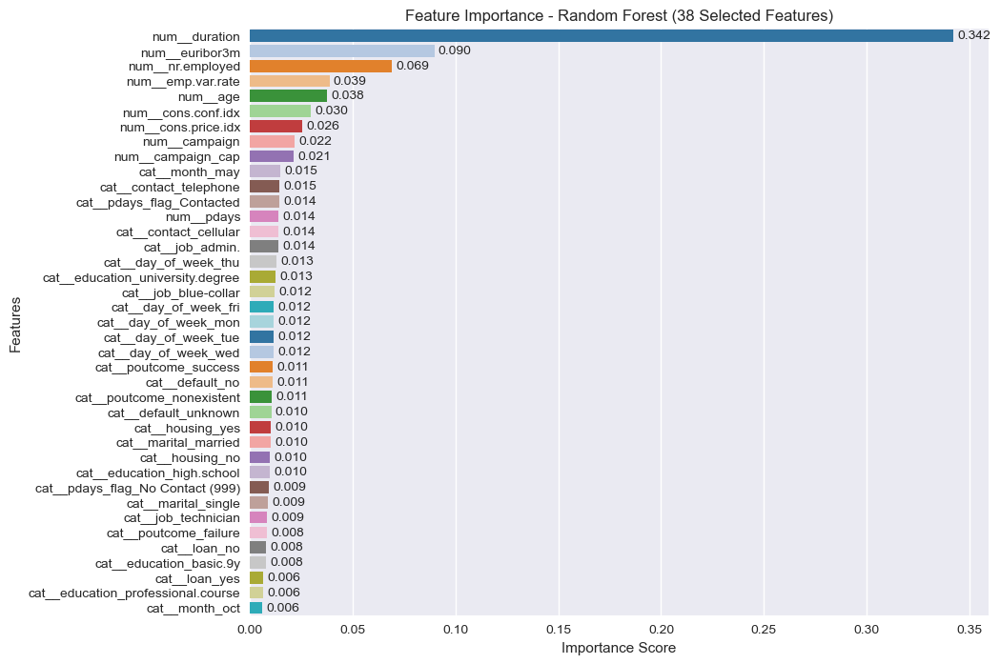

In [209]:
# Latih Random Forest pada data dengan fitur terpilih
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train_selected, y_train_res)

# Ambil feature importance
importances = rf_model.feature_importances_

# Gabungkan dengan nama fitur terpilih
feat_imp = pd.Series(importances, index=selected_features).sort_values(ascending=False)

# Visualisasi feature importance
plt.figure(figsize=(10,8))
ax = sns.barplot(
    x=feat_imp,
    y=feat_imp.index,
    hue=feat_imp.index,
    palette="tab20",   
    dodge=False,
    legend=False
)

# Tambahkan label angka di ujung bar
for container in ax.containers:
    ax.bar_label(container, fmt="%.3f", label_type="edge", padding=3)

plt.title("Feature Importance - Random Forest (38 Selected Features)")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()

***
**Insight**
***
| Rank | Fitur                      | Importance | Insight Utama                                                                      |
| ---- | -------------------------- | ---------- | ---------------------------------------------------------------------------------- |
| 1    | **num__duration**          | 0.347      | Lama panggilan sangat dominan; makin panjang interaksi, makin besar peluang “yes”. |
| 2    | **num__euribor3m**         | 0.090      | Suku bunga acuan sangat berpengaruh; kondisi pasar memengaruhi minat deposito.     |
| 3    | **num__nr.employed**       | 0.066      | Jumlah tenaga kerja mencerminkan iklim ekonomi dan daya beli masyarakat.           |
| 4    | **num__emp.var.rate**      | 0.054      | Tingkat variasi kerja (indikator makro) ikut memengaruhi kepercayaan finansial.    |
| 5    | **num__age**               | 0.038      | Usia penting; segmen pensiunan & mahasiswa relatif lebih responsif.                |
| 6    | **num__cons.conf.idx**     | 0.036      | Optimisme konsumen terkait kondisi ekonomi memengaruhi keputusan menabung.         |
| 7    | **num__campaign**          | 0.035      | Jumlah kontak berlebih menurunkan peluang konversi (efek kejenuhan).               |
| 8    | **num__cons.price.idx**    | 0.023      | Inflasi yang tinggi menekan daya tarik deposito.                                   |
| 9    | **cat__poutcome_success**  | 0.018      | Nasabah dengan riwayat sukses kampanye sebelumnya lebih mudah dikonversi.          |
| 10   | **cat__contact_telephone** | 0.017      | Kontak via telepon rumah masih berpengaruh, meski kurang efektif dibanding ponsel. |

- Ringkasan
    - `Duration` adalah faktor paling dominan, tapi ini bersifat post-call (tidak bisa dipakai untuk prediksi awal).
    - Setelah duration, indikator makroekonomi (`euribor3m`, `nr.employed`, `emp.var.rate`, `cons.conf.idx`, `cons.price.idx`) menempati posisi penting, menegaskan kondisi pasar berperan besar.
    - Faktor demografi (`usia`) dan kampanye/riwayat kontak (`jumlah kontak`, `poutcome`, `channel komunikasi`) juga signifikan, tapi level pengaruhnya lebih rendah.
    - Strategi optimal : gunakan gabungan indikator ekonomi + profil nasabah + strategi kontak untuk meningkatkan efektivitas kampanye.

****
## **5. Modeling and Evaluation**
****



1. Benchmark Awal Model  
Pada tahap pertama, seluruh algoritma utama dicoba dengan **hyperparameter default**.  
- **Tujuan**: mendapatkan gambaran awal kemampuan tiap model sebelum dilakukan tuning.  
- **Model yang digunakan**:  
  - KNN → sederhana, berbasis jarak antar data.  
  - Logistic Regression → model linear yang cocok untuk baseline.  
  - Decision Tree → interpretable, dasar untuk algoritma tree-based lain.  
  - Random Forest → ensemble berbasis bagging, biasanya stabil.  
  - AdaBoost & Gradient Boosting → boosting yang menekankan pada error correction.  
  - XGBoost → versi boosting yang lebih powerful & efisien.  
Dari sini bisa dilihat **model mana yang secara alami punya kecenderungan recall lebih tinggi** bahkan tanpa tuning.  

2. Validasi Menggunakan Cross Validation (CV)  
- **Kenapa CV?** → untuk mengurangi bias karena hasil evaluasi tidak hanya bergantung pada satu train-test split.  
- Misalnya dengan k-Fold CV, data dibagi jadi beberapa lipatan, model dilatih di sebagian lipatan dan diuji di lipatan lain secara bergantian.  
- Hasil akhir → skor rata-rata dari semua fold, lebih representatif untuk generalisasi.  
Performa jadi lebih stabil & adil dibanding hanya 1 kali split train/test.  

3. Penanganan Imbalanced Dataset dengan Resampling  
Dataset yang dipakai **imbalanced** (kelas mayoritas jauh lebih banyak dari minoritas).  
Kalau tidak diatasi, model cenderung bias ke mayoritas → recall untuk minoritas jadi rendah.  

**Strategi resampling yang dipakai:**  
- **ROS (Random Over Sampling)** → menduplikasi data minoritas.  
- **RUS (Random Under Sampling)** → mengurangi data mayoritas.  
- **SMOTE** → membuat data sintetis minoritas dengan interpolasi antar tetangga terdekat.  
- **NearMiss** → under sampling dengan memilih mayoritas yang paling dekat dengan minoritas.  
Tiap teknik bisa berdampak beda ke recall. Misalnya SMOTE sering lebih baik dari ROS karena variasi data minoritas lebih kaya.  

4. Feature Selection & Scaling  
- **Feature Selection**: model dicoba **dengan** dan **tanpa** seleksi fitur.  
  - Tujuannya untuk melihat apakah menghapus fitur kurang relevan bisa meningkatkan kinerja.  
- **Scaling (StandardScaler)**:  
  - Dipakai untuk **KNN** dan **Logistic Regression** (karena sensitif pada skala).  
  - Tidak dipakai pada **tree-based models** (karena pohon tidak dipengaruhi skala fitur).  
Bisa dilihat seberapa besar pengaruh preprocessing terhadap performa recall.  

5. Evaluasi dengan Metrik Recall (Utama)  
- **Recall** dipilih sebagai metrik utama karena:  
  - Fokus pada **mengurangi false negative**.  
  - Dalam konteks campaign/marketing, lebih baik salah memprediksi non-target sebagai target (false positive) dibanding kehilangan target potensial.  
- Metrik tambahan: precision, F1, ROC-AUC, PR-AUC (pelengkap, bukan utama).  
Artinya ada trade-off: lebih banyak false positive, tapi minoritas tercover.  

6. Output yang Diharapkan  
- Didapatkan perbandingan antar algoritma di kondisi default.  
- Pertanyaan yang terjawab:  
  - Algoritma mana yang paling baik recall-nya?  
  - Teknik resampling mana yang paling membantu?  
  - Apakah feature selection memberi efek signifikan?  
  - Apakah scaling meningkatkan performa KNN/Logistic?  
Hasil ini jadi dasar untuk memilih **kombinasi model + resampling + preprocessing terbaik** sebelum masuk ke hyperparameter tuning.  


****
### 5.1 Cross-Validation Logistic Regression dan KNN dengan Hyperparameter Default pada Berbagai Metrik
****


**Cross-Validation Model Logistic Regression dan K-Nearest Neighbors (KNN)** :

- Hyperparameter Default : Evaluasi dilakukan pada model Logistic Regression dan KNN menggunakan pengaturan bawaan (default hyperparameters)

- Metrik Evaluasi : Kinerja model diukur dengan beberapa metrik, yaitu recall dan F2 score. Fokus utama adalah meminimalkan false negatives dan meningkatkan akurasi prediksi untuk kasus klaim

- Metode Resampling : Untuk mengatasi ketidakseimbangan kelas, model diuji pada berbagai teknik resampling, meliputi :
    - Random Over Sampling (ROS)
    - Random Under Sampling (RUS)
    - SMOTE
    - NearMiss

- Seleksi Fitur : Perbandingan hasil dilakukan baik dengan maupun tanpa seleksi fitur untuk menilai pengaruhnya terhadap performa model

- Skala Fitur : Proses penskalaan fitur menggunakan RobustScaler untuk menjaga konsistensi skala data sekaligus mengurangi pengaruh outlier

In [210]:
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.metrics import make_scorer, recall_score, fbeta_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost.sklearn import XGBClassifier
from sklearn.preprocessing import StandardScaler

from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss

from sklearn.model_selection import StratifiedKFold, cross_val_score

In [211]:
ros = RandomOverSampler(random_state = 42)
rus = RandomUnderSampler(random_state = 42)
smote = SMOTE(random_state = 42)
nmiss = NearMiss()

In [212]:
logreg = LogisticRegression(random_state = 42)
knn = KNeighborsClassifier(n_neighbors = 10)

# tree-based models
dt = DecisionTreeClassifier(random_state = 42)
rf = RandomForestClassifier(random_state = 42)
adaboost = AdaBoostClassifier(random_state = 42)
gradboost = GradientBoostingClassifier(random_state = 42)
xgboost = XGBClassifier(random_state = 42)

> ### **Random Over Sampling (ROS) tanpa Seleksi Fitur**

In [213]:
# Definisi skema penilaian untuk cross-validation
scoring_methods = {
    'recall': 'recall',  # Menilai seberapa baik model menangkap kelas positif
    'f2': make_scorer(fbeta_score, beta=2),  # Fokus pada recall lebih besar (F2 Score)
    
}

# Daftar model yang diuji
model_list = [logreg, knn]

# Metrik evaluasi yang akan digunakan
evaluation_metrics = ['recall', 'f2']

# Menyimpan hasil evaluasi
evaluation_results = []

scaler = StandardScaler()

for clf in model_list:
    for metric in evaluation_metrics:
        # Pipeline dengan ROS
        pipeline_with_ros = ImbPipeline([
            ('preprocessing', preprocessor),  # Transformasi fitur
            ('scaler', scaler),              # Scaling fitur
            ('resample', ros),               # Random Over Sampling
            ('classifier', clf)               # Model klasifikasi
        ])

        # Cross-validation dengan ROS
        cv_scores_ros = cross_val_score(
            estimator=pipeline_with_ros,
            X=X_train,
            y=y_train,
            cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
            scoring=scoring_methods[metric],
            n_jobs=-1
        )

        evaluation_results.append({
            'Model': type(clf).__name__,
            'Sampling': 'Dengan ROS',
            'Metric': metric,
            'Mean Score': np.mean(cv_scores_ros),
            'Std Dev': np.std(cv_scores_ros)
        })

        # Pipeline tanpa ROS
        pipeline_without_ros = ImbPipeline([
            ('preprocessing', preprocessor),
            ('scaler', scaler),
            ('classifier', clf)
        ])

        # Cross-validation tanpa ROS
        cv_scores_no_ros = cross_val_score(
            estimator=pipeline_without_ros,
            X=X_train,
            y=y_train,
            cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
            scoring=scoring_methods[metric],
            n_jobs=-1
        )

        evaluation_results.append({
            'Model': type(clf).__name__,
            'Sampling': 'Tanpa ROS',
            'Metric': metric,
            'Mean Score': np.mean(cv_scores_no_ros),
            'Std Dev': np.std(cv_scores_no_ros)
        })

# Mengubah hasil menjadi DataFrame dan mengurutkan berdasarkan skor rata-rata
results_df = pd.DataFrame(evaluation_results)
results_df.sort_values(by='Mean Score', ascending=False)


,Model,Sampling,Metric,Mean Score,Std Dev
0,LogisticRegression,Dengan ROS,recall,0.907035,0.007455
2,LogisticRegression,Dengan ROS,f2,0.741346,0.008101
4,KNeighborsClassifier,Dengan ROS,recall,0.703858,0.017530
6,KNeighborsClassifier,Dengan ROS,f2,0.568528,0.010306
3,LogisticRegression,Tanpa ROS,f2,0.431737,0.011567
1,LogisticRegression,Tanpa ROS,recall,0.396664,0.011214
7,KNeighborsClassifier,Tanpa ROS,f2,0.260758,0.014343
5,KNeighborsClassifier,Tanpa ROS,recall,0.227161,0.013324


> ### **Random Over Sampling (ROS) dengan Seleksi Fitur**

In [214]:
# Skema penilaian untuk CV
scoring_scheme = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Daftar model & metrik yang dievaluasi
model_list   = [logreg, knn]                 # diasumsikan sudah didefinisikan
metric_list  = ['recall', 'f2']

# Penampung hasil
eval_rows = []

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Transform pakai data asli (belum di-SMOTE)
X_train_selected = rfecv.transform(X_train_prepared)
X_test_selected  = rfecv.transform(X_test_prepared)

for clf in model_list:
    for metric in metric_list:
        # ----------------- Dengan ROS -----------------
        pipe_ros = ImbPipeline([
            ('scaler', scaler),   # RobustScaler untuk data yang mengandung outlier
            ('resample', ros),    # RandomOverSampler
            ('model', clf)        # LogisticRegression atau KNN
        ])

        scores_ros = cross_val_score(
            estimator=pipe_ros,
            X=X_train_selected,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        eval_rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Dengan ROS',
            'Metric': metric,
            'Mean Score': np.mean(scores_ros),
            'Std Deviation': np.std(scores_ros)
        })

        # ----------------- Tanpa ROS -----------------
        pipe_no_ros = ImbPipeline([
            ('scaler', scaler),
            ('model', clf)
        ])

        scores_no_ros = cross_val_score(
            estimator=pipe_no_ros,
            X=X_train_selected,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        eval_rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Tanpa ROS',
            'Metric': metric,
            'Mean Score': np.mean(scores_no_ros),
            'Std Deviation': np.std(scores_no_ros)
        })

# Hasil akhir dalam DataFrame, diurutkan berdasarkan skor rata-rata
results_df = pd.DataFrame(eval_rows).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)

results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,LogisticRegression,Dengan ROS,recall,0.895177,0.006156
1,KNeighborsClassifier,Dengan ROS,recall,0.738620,0.014773
2,LogisticRegression,Dengan ROS,f2,0.730831,0.008151
3,KNeighborsClassifier,Dengan ROS,f2,0.604371,0.007559
4,LogisticRegression,Tanpa ROS,f2,0.422577,0.010255
5,LogisticRegression,Tanpa ROS,recall,0.389115,0.009201
6,KNeighborsClassifier,Tanpa ROS,f2,0.259852,0.019211
7,KNeighborsClassifier,Tanpa ROS,recall,0.226086,0.017848


> ### **Random Under Sampling (RUS) tanpa feature selection**

In [215]:
# Skema scoring untuk cross-validation
scoring_scheme = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Model yang dievaluasi
model_list  = [logreg, knn]              # diasumsikan sudah didefinisikan
metric_list = ['recall', 'f2']

# Penampung hasil
eval_rows = []

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for clf in model_list:
    for metric in metric_list:
        # ----------------- Dengan RUS -----------------
        pipe_with_rus = ImbPipeline([
            ('preprocessing', preprocessor),  # encoding/transformasi fitur
            ('scaler', scaler),              # RobustScaler untuk LogReg & KNN
            ('resample', rus),               # RandomUnderSampler
            ('algorithm', clf)               # model klasifikasi
        ])

        scores_with = cross_val_score(
            estimator=pipe_with_rus,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        eval_rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With RUS',
            'Metric': metric,
            'Mean Score': np.mean(scores_with),
            'Std Deviation': np.std(scores_with)
        })

        # ----------------- Tanpa RUS -----------------
        pipe_without_rus = ImbPipeline([
            ('preprocessing', preprocessor),
            ('scaler', scaler),
            ('algorithm', clf)
        ])

        scores_without = cross_val_score(
            estimator=pipe_without_rus,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        eval_rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without RUS',
            'Metric': metric,
            'Mean Score': np.mean(scores_without),
            'Std Deviation': np.std(scores_without)
        })

# Ringkas hasil ke DataFrame dan urutkan berdasarkan skor rata-rata
results_df = pd.DataFrame(eval_rows).sort_values(by='Mean Score', ascending=False).reset_index(drop=True)
results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,LogisticRegression,With RUS,recall,0.904069,0.008150
1,LogisticRegression,With RUS,f2,0.739276,0.008263
2,KNeighborsClassifier,With RUS,recall,0.699006,0.016036
3,KNeighborsClassifier,With RUS,f2,0.601594,0.011384
4,LogisticRegression,Without RUS,f2,0.431737,0.011567
5,LogisticRegression,Without RUS,recall,0.396664,0.011214
6,KNeighborsClassifier,Without RUS,f2,0.260758,0.014343
7,KNeighborsClassifier,Without RUS,recall,0.227161,0.013324


> ### **Random Under Sampling (RUS) dengan Seleksi Fitur**

In [216]:
# Skema penilaian untuk CV
scoring_scheme = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Model & metrik yang diuji
model_list  = [logreg, knn]               # diasumsikan sudah didefinisikan
metric_list = ['recall', 'f2']

# K-Fold berstrata untuk data imbalanced
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

rows = []

# ✅ Transformasi data asli dengan fitur terpilih
X_train_selected_preprocessed = rfecv.transform(X_train_prepared)

for clf in model_list:
    for metric in metric_list:
        # ------------- Dengan RUS -------------
        pipe_rus = ImbPipeline([
            ('scaler', scaler),   
            ('resample', rus),    # RandomUnderSampler
            ('model', clf)
        ])

        scores_with = cross_val_score(
            estimator=pipe_rus,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Dengan RUS',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_with)),
            'Std Deviation': float(np.std(scores_with))
        })

        # ------------- Tanpa RUS -------------
        pipe_no_rus = ImbPipeline([
            ('scaler', scaler),
            ('model', clf)
        ])

        scores_without = cross_val_score(
            estimator=pipe_no_rus,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Tanpa RUS',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_without)),
            'Std Deviation': float(np.std(scores_without))
        })

# Hasil akhir
results_df = pd.DataFrame(rows).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)

results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,LogisticRegression,Dengan RUS,recall,0.894098,0.010008
1,KNeighborsClassifier,Dengan RUS,recall,0.772029,0.011725
2,LogisticRegression,Dengan RUS,f2,0.730019,0.008570
3,KNeighborsClassifier,Dengan RUS,f2,0.647115,0.013097
4,LogisticRegression,Tanpa RUS,f2,0.422577,0.010255
5,LogisticRegression,Tanpa RUS,recall,0.389115,0.009201
6,KNeighborsClassifier,Tanpa RUS,f2,0.259852,0.019211
7,KNeighborsClassifier,Tanpa RUS,recall,0.226086,0.017848


> ### **SMOTE (Synthetic Minority Over-sampling Technique) tanpa Seleksi Fitur**

In [217]:
# Definisi scoring metrics untuk evaluasi model
scoring_metrics = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Model yang akan diuji
candidate_models = [logreg, knn]

# Metrik yang akan dipakai dalam evaluasi
eval_metrics = ['recall', 'f2']

# List untuk menyimpan hasil cross-validation
cv_results = []

# Looping model dan metrik
for clf in candidate_models:
    for metric in eval_metrics:
        
        # --- Dengan SMOTE ---
        pipeline_with_smote = ImbPipeline([
            ('prep', preprocessor),       # preprocessing data
            ('scale', scaler),            # scaling fitur
            ('balance', smote),           # SMOTE oversampling
            ('model', clf)                 # algoritma
        ])

        cv_score_with_smote = cross_val_score(
            estimator=pipeline_with_smote,
            X=X_train,
            y=y_train,
            cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
            scoring=scoring_metrics[metric],
            n_jobs=-1
        )

        cv_results.append({
            'Model': type(clf).__name__,
            'Sampling': 'With SMOTE',
            'Metric': metric,
            'Mean Score': np.mean(cv_score_with_smote),
            'Std Dev': np.std(cv_score_with_smote)
        })

        # --- Tanpa SMOTE ---
        pipeline_without_smote = ImbPipeline([
            ('prep', preprocessor),
            ('scale', scaler),
            ('model', clf)
        ])

        cv_score_without_smote = cross_val_score(
            estimator=pipeline_without_smote,
            X=X_train,
            y=y_train,
            cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
            scoring=scoring_metrics[metric],
            n_jobs=-1
        )

        cv_results.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without SMOTE',
            'Metric': metric,
            'Mean Score': np.mean(cv_score_without_smote),
            'Std Dev': np.std(cv_score_without_smote)
        })

# Hasil akhir cross-validation
results_df = pd.DataFrame(cv_results).sort_values(by='Mean Score', ascending=False)
results_df


,Model,Sampling,Metric,Mean Score,Std Dev
0,LogisticRegression,With SMOTE,recall,0.891675,0.007868
2,LogisticRegression,With SMOTE,f2,0.738496,0.005421
4,KNeighborsClassifier,With SMOTE,recall,0.721370,0.012010
6,KNeighborsClassifier,With SMOTE,f2,0.584532,0.008306
3,LogisticRegression,Without SMOTE,f2,0.431737,0.011567
1,LogisticRegression,Without SMOTE,recall,0.396664,0.011214
7,KNeighborsClassifier,Without SMOTE,f2,0.260758,0.014343
5,KNeighborsClassifier,Without SMOTE,recall,0.227161,0.013324


> ### **SMOTE (Synthetic Minority Over-sampling Technique) dengan Seleksi Fitur**

In [218]:
# Definisi scoring metrics
scoring_methods = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
       
}

# Daftar model dan metrik yang diuji
candidate_models = [logreg, knn]        # sudah didefinisikan sebelumnya
eval_metrics     = ['recall', 'f2']

# K-Fold (stratified karena data imbalanced)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# List untuk menyimpan hasil
evaluation_results = []

# ✅ Transformasi data asli dengan fitur terpilih (bukan hasil SMOTE di luar pipeline)
X_train_selected_preprocessed = rfecv.transform(X_train_prepared)

# Loop kombinasi model & metric
for clf in candidate_models:
    for metric in eval_metrics:

        # --- Dengan SMOTE ---
        smote_pipeline = ImbPipeline([
            ('scale', scaler),      # RobustScaler
            ('oversample', smote),  # SMOTE
            ('clf', clf)
        ])

        smote_scores = cross_val_score(
            estimator=smote_pipeline,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring_methods[metric],
            n_jobs=-1
        )

        evaluation_results.append({
            'Model': type(clf).__name__,
            'Sampling': 'With SMOTE',
            'Metric': metric,
            'Mean Score': float(np.mean(smote_scores)),
            'Std Dev': float(np.std(smote_scores))
        })

        # --- Tanpa SMOTE ---
        no_smote_pipeline = ImbPipeline([
            ('scale', scaler),
            ('clf', clf)
        ])

        no_smote_scores = cross_val_score(
            estimator=no_smote_pipeline,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring_methods[metric],
            n_jobs=-1
        )

        evaluation_results.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without SMOTE',
            'Metric': metric,
            'Mean Score': float(np.mean(no_smote_scores)),
            'Std Dev': float(np.std(no_smote_scores))
        })

# Konversi ke DataFrame & urutkan
results_df = pd.DataFrame(evaluation_results).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)

results_df

,Model,Sampling,Metric,Mean Score,Std Dev
0,LogisticRegression,With SMOTE,recall,0.881974,0.007993
1,KNeighborsClassifier,With SMOTE,recall,0.742932,0.011808
2,LogisticRegression,With SMOTE,f2,0.728005,0.007765
3,KNeighborsClassifier,With SMOTE,f2,0.615872,0.009071
4,LogisticRegression,Without SMOTE,f2,0.422577,0.010255
5,LogisticRegression,Without SMOTE,recall,0.389115,0.009201
6,KNeighborsClassifier,Without SMOTE,f2,0.259852,0.019211
7,KNeighborsClassifier,Without SMOTE,recall,0.226086,0.017848


> ### **Near Miss tanpa Seleksi Fitur**

In [219]:
scoring_scheme = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Model & metrik yang dievaluasi
model_list  = [logreg, knn]
metric_list = ['recall', 'f2']

# K-Fold berstrata
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

rows = []

for clf in model_list:
    for metric in metric_list:
        # ------------- Dengan NMISS (NearMiss undersampling) -------------
        pipe_with_nmiss = ImbPipeline([
            ('preprocess', preprocessor),  # encoding/transformasi fitur
            ('scale', scaler),            # RobustScaler (sesuai kebijakan scaling)
            ('resample', nmiss),          # NearMiss
            ('model', clf)                # logreg/knn
        ])

        scores_with = cross_val_score(
            estimator=pipe_with_nmiss,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With NMISS',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_with)),
            'Std Dev': float(np.std(scores_with))
        })

        # ------------- Tanpa NMISS -------------
        pipe_no_nmiss = ImbPipeline([
            ('preprocess', preprocessor),
            ('scale', scaler),
            ('model', clf)
        ])

        scores_without = cross_val_score(
            estimator=pipe_no_nmiss,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without NMISS',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_without)),
            'Std Dev': float(np.std(scores_without))
        })

# Tabel hasil (diurutkan)
results_df = pd.DataFrame(rows).sort_values(by='Mean Score', ascending=False).reset_index(drop=True)
results_df

,Model,Sampling,Metric,Mean Score,Std Dev
0,LogisticRegression,With NMISS,recall,0.850442,0.012923
1,LogisticRegression,With NMISS,f2,0.632133,0.014860
2,KNeighborsClassifier,With NMISS,recall,0.610895,0.029890
3,KNeighborsClassifier,With NMISS,f2,0.478675,0.020418
4,LogisticRegression,Without NMISS,f2,0.431737,0.011567
5,LogisticRegression,Without NMISS,recall,0.396664,0.011214
6,KNeighborsClassifier,Without NMISS,f2,0.260758,0.014343
7,KNeighborsClassifier,Without NMISS,recall,0.227161,0.013324


> ### **Near Miss dengan Seleksi Fitur**

In [220]:
# Skema penilaian (recall, F2)
scoring_scheme = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Model & metrik yang dievaluasi
model_list  = [logreg, knn]    # LogisticRegression, KNN (sudah didefinisikan sebelumnya)
metric_list = ['recall', 'f2']

# Penampung hasil
rows = []

# K-Fold stratified untuk data imbalanced
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Transformasi data asli dengan fitur terpilih (bukan hasil resampling luar)
X_train_selected_preprocessed = rfecv.transform(X_train_prepared)

for clf in model_list:
    for metric in metric_list:
        # ---------- Dengan NearMiss ----------
        pipe_with_nmiss = ImbPipeline([
            ('scaler', scaler),   # RobustScaler untuk menangani outlier
            ('resample', nmiss),  # NearMiss undersampling
            ('model', clf)
        ])

        scores_with = cross_val_score(
            estimator=pipe_with_nmiss,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With NearMiss',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_with)),
            'Std Deviation': float(np.std(scores_with))
        })

        # ---------- Tanpa NearMiss ----------
        pipe_no_nmiss = ImbPipeline([
            ('scaler', scaler),
            ('model', clf)
        ])

        scores_without = cross_val_score(
            estimator=pipe_no_nmiss,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring_scheme[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without NearMiss',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_without)),
            'Std Deviation': float(np.std(scores_without))
        })

# Tabel hasil (diurutkan dari skor rata-rata tertinggi)
results_df = pd.DataFrame(rows).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)
results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,LogisticRegression,With NearMiss,recall,0.784429,0.013856
1,LogisticRegression,With NearMiss,f2,0.615972,0.014166
2,KNeighborsClassifier,With NearMiss,recall,0.568317,0.024043
3,KNeighborsClassifier,With NearMiss,f2,0.478462,0.021448
4,LogisticRegression,Without NearMiss,f2,0.422577,0.010255
5,LogisticRegression,Without NearMiss,recall,0.389115,0.009201
6,KNeighborsClassifier,Without NearMiss,f2,0.259852,0.019211
7,KNeighborsClassifier,Without NearMiss,recall,0.226086,0.017848


****
#### 5.1.1 Urutan Table Berdasarkan Rata-Rata Score and Kestabilannya
****

| Rank | Model               | Sampling        | Metric  | Mean Score | Std Dev   |
|-----:|---------------------|-----------------|---------|-----------:|----------:|
| 1    | LogisticRegression  | ROS             | recall  | **0.9070** | 0.007455 |
| 2    | LogisticRegression  | RUS             | recall  | **0.9041** | 0.008150 |
| 3    | LogisticRegression  | ROS             | recall  | **0.8952** | 0.006156 |
| 4    | LogisticRegression  | RUS             | recall  | **0.8941** | 0.010008 |
| 5    | LogisticRegression  | SMOTE           | recall  | **0.8917** | 0.007868 |
| 6    | LogisticRegression  | SMOTE           | recall  | **0.8820** | 0.007993 |
| 7    | LogisticRegression  | NearMiss        | recall  | **0.8504** | 0.012923 |
| 8    | LogisticRegression  | NearMiss        | recall  | **0.7844** | 0.013856 |
| 9    | KNeighborsClassifier| RUS             | recall  | **0.7720** | 0.011725 |
| 10   | KNeighborsClassifier| SMOTE           | recall  | **0.7429** | 0.011808 |
> Catatan: Entri berasal dari beberapa blok hasil (ROS/RUS/SMOTE/NearMiss). Peringkat disusun murni dari **Mean recall** tertinggi; **Std Dev** ditampilkan untuk menilai kestabilan (lebih kecil = lebih stabil).


***
**Kesimpulan**
***

- **Logistic Regression (LR) mendominasi**  
   - LR consistently mendapat **recall tertinggi** di semua teknik resampling.  
   - Entry terbaik mencapai **0.907 (ROS)** dan **0.904 (RUS)**.  
   - Stabilitas LR juga baik (Std Dev ~0.006–0.010), menandakan performa yang konsisten antar fold CV.

- **Resampling sangat krusial**  
   - Dibandingkan *tanpa resampling* (recall LR ~0.389–0.397), penggunaan **ROS/RUS/SMOTE** menaikkan recall secara drastis ke rentang **0.88–0.91**.  
   - Hal ini menunjukkan bahwa **imbalance** adalah isu utama, dan balancing membantu model menangkap kelas minoritas jauh lebih baik.

- **ROS & RUS unggul tipis atas SMOTE untuk LR**  
   - Recall tertinggi: **ROS (0.9070)** dan **RUS (0.9041)**.  
   - **SMOTE (0.8917 / 0.8820)** masih cukup kuat, tetapi sedikit di bawah ROS/RUS.  
   - **NearMiss** menghasilkan recall lebih rendah (**0.8504 / 0.7844**), sehingga kurang direkomendasikan untuk LR bila target utamanya recall maksimum.

- **KNN tertinggal dari Logistic Regression**  
   - Skor KNN terbaik hanya mencapai **0.7720 (RUS)** dan **0.7429 (SMOTE)**.  
   - Jauh di bawah LR pada skenario resampling yang sama.  
   - Std Dev KNN sedikit lebih tinggi → performa lebih fluktuatif antar fold.

- **Implikasi Praktis**  
   - Jika tujuan utama adalah **Recall tinggi** (menekan False Negative):  
     - **Prioritaskan Logistic Regression + ROS/RUS** sebagai baseline terbaik.  
     - **SMOTE** bisa dipilih bila ingin variasi data minoritas yang lebih kaya.  
     - **NearMiss** hanya relevan bila resource terbatas, namun dengan trade-off recall cukup besar.  
   - Setelah baseline dipilih (mis. **LR + ROS**), tahap berikutnya adalah **tuning threshold** dan/atau **hyperparameter** untuk menemukan trade-off Recall vs Precision yang sesuai kebutuhan bisnis.


****
### 5.2 Cross Validation of Tree-Based Models with Default Hyperparameters Across Multiple Metrics
****

| **Aspek**                  | **Rincian**                                                                                  |
| -------------------------- | -------------------------------------------------------------------------------------------- |
| **Jenis Model**            | Tree-Based Models (default hyperparameters)                                                  |
| **Metrik Evaluasi**        | Recall, F2 Score, PR-AUC                                                                     |
| **Tujuan Evaluasi**        | Menilai kemampuan model meminimalkan false negatives dan memprediksi klaim secara akurat     |
| **Metode Resampling**      | - Random Over Sampling (ROS) <br> - Random Under Sampling (RUS) <br> - SMOTE <br> - NearMiss |
| **Feature Selection (FS)** | Analisis perbandingan performa model dengan dan tanpa FS                                     |
| **Feature Scaling**        | Tidak digunakan pada tree-based models                                                       |


> ### **Random Over Sampling (ROS) tanpa Seleksi Fitur**

In [221]:
# 1) Skema scoring yang dipakai
scoring_map = {
    'recall': 'recall',                          # prioritas: minimalkan FN
    'f2': make_scorer(fbeta_score, beta=2),      # F2: menekankan recall
                
}

# 2) Kumpulan model pohon yang diuji (diasumsikan sudah didefinisikan)
tree_models = [dt, rf, adaboost, gradboost, xgboost]

# 3) Metrik evaluasi
metrics_to_eval = ['recall', 'f2']

# 4) Penampung hasil
rows = []

# 5) Stratified K-Fold untuk data imbalanced
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for clf in tree_models:
    for metric in metrics_to_eval:
        # ----------------- Dengan ROS -----------------
        pipe_ros = ImbPipeline(steps=[
            ('prep', preprocessor),   # encoding/transformasi fitur kategorikal
            ('resample', ros),       # Random Over Sampling
            ('model', clf)           # estimator tree-based
        ])

        scores_ros = cross_val_score(
            estimator=pipe_ros,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=scoring_map[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With ROS',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_ros)),
            'Std Deviation': float(np.std(scores_ros))
        })

        # ----------------- Tanpa ROS -----------------
        pipe_no_ros = ImbPipeline(steps=[
            ('prep', preprocessor),
            ('model', clf)
        ])

        scores_no_ros = cross_val_score(
            estimator=pipe_no_ros,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=scoring_map[metric],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without ROS',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_no_ros)),
            'Std Deviation': float(np.std(scores_no_ros))
        })

# 6) Hasil akhir: DataFrame diurutkan berdasarkan rata-rata skor
results_df = pd.DataFrame(rows).sort_values(by='Mean Score', ascending=False).reset_index(drop=True)
results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,GradientBoostingClassifier,With ROS,recall,0.921045,0.007015
1,AdaBoostClassifier,With ROS,recall,0.879815,0.012642
2,XGBClassifier,With ROS,recall,0.817566,0.019022
3,GradientBoostingClassifier,With ROS,f2,0.753379,0.006687
4,AdaBoostClassifier,With ROS,f2,0.732497,0.008298
5,XGBClassifier,With ROS,f2,0.727484,0.015153
6,RandomForestClassifier,With ROS,f2,0.570199,0.014029
7,RandomForestClassifier,With ROS,recall,0.564812,0.016412
8,XGBClassifier,Without ROS,f2,0.551649,0.009406
9,XGBClassifier,Without ROS,recall,0.535706,0.012487


> ### **Random Over Sampling (ROS) dengan Seleksi Fitur**

In [222]:
# Skema penilaian
score_map = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Kumpulan model tree-based
tree_clfs   = [dt, rf, adaboost, gradboost, xgboost]
metric_list = ['recall', 'f2']

# Penampung hasil
rows = []

# K-Fold stratified untuk imbalanced data
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Transformasi data asli (bukan hasil ROS/SMOTE di luar)
X_train_selected = rfecv.transform(X_train_prepared)

for clf in tree_clfs:
    for m in metric_list:
        # ----------------- Dengan ROS -----------------
        pipe_ros = ImbPipeline([
            ('resample', ros),   # RandomOverSampler
            ('model', clf)       # Estimator tree-based
        ])

        scores_w = cross_val_score(
            estimator=pipe_ros,
            X=X_train_selected,
            y=y_train,
            cv=cv,
            scoring=score_map[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With ROS',
            'Metric': m,
            'Mean Score': float(np.mean(scores_w)),
            'Std Deviation': float(np.std(scores_w))
        })

        # ----------------- Tanpa ROS -----------------
        pipe_no = ImbPipeline([
            ('model', clf)
        ])

        scores_wo = cross_val_score(
            estimator=pipe_no,
            X=X_train_selected,
            y=y_train,
            cv=cv,
            scoring=score_map[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without ROS',
            'Metric': m,
            'Mean Score': float(np.mean(scores_wo)),
            'Std Deviation': float(np.std(scores_wo))
        })

# Hasil akhir: urutkan berdasarkan skor rata-rata
results_df = pd.DataFrame(rows).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)

results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,GradientBoostingClassifier,With ROS,recall,0.920777,0.007087
1,AdaBoostClassifier,With ROS,recall,0.873347,0.020293
2,XGBClassifier,With ROS,recall,0.822688,0.011689
3,GradientBoostingClassifier,With ROS,f2,0.754398,0.006174
4,XGBClassifier,With ROS,f2,0.730304,0.011285
5,AdaBoostClassifier,With ROS,f2,0.717056,0.013564
6,RandomForestClassifier,With ROS,f2,0.587316,0.010789
7,RandomForestClassifier,With ROS,recall,0.585290,0.011033
8,XGBClassifier,Without ROS,f2,0.543742,0.015979
9,XGBClassifier,Without ROS,recall,0.526816,0.014977


> ### **Random Under Sampling (RUS) tanpa Seleksi Fitur**

In [223]:
# 1) Peta scoring untuk evaluasi
score_map = {
    'recall': 'recall',                       # fokus: minimalkan FN
    'f2': make_scorer(fbeta_score, beta=2),   # F2 menekankan recall
                 # PR-AUC (Average Precision)
}

# 2) Daftar model & metrik yang akan diuji
tree_models   = [dt, rf, adaboost, gradboost, xgboost]
metric_list   = ['recall', 'f2']

# 3) Penampung hasil
rows = []

# 4) Skema CV berstrata (rekomendasi untuk data imbalanced)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for clf in tree_models:
    for m in metric_list:
        # ----------------- Dengan RUS -----------------
        pipe_with_rus = ImbPipeline(steps=[
            ('prep', preprocessor),  # encoding/transformasi fitur kategorikal
            ('resample', rus),      # Random Under Sampling
            ('model', clf)          # estimator tree-based
        ])

        scores_with = cross_val_score(
            estimator=pipe_with_rus,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=score_map[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With RUS',
            'Metric': m,
            'Mean Score': float(np.mean(scores_with)),
            'Std Deviation': float(np.std(scores_with))
        })

        # ----------------- Tanpa RUS -----------------
        pipe_no_rus = ImbPipeline(steps=[
            ('prep', preprocessor),
            ('model', clf)
        ])

        scores_without = cross_val_score(
            estimator=pipe_no_rus,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=score_map[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without RUS',
            'Metric': m,
            'Mean Score': float(np.mean(scores_without)),
            'Std Deviation': float(np.std(scores_without))
        })

# 5) Rekap hasil
results_df = pd.DataFrame(rows).sort_values(by='Mean Score', ascending=False).reset_index(drop=True)
results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,GradientBoostingClassifier,With RUS,recall,0.925359,0.007578
1,RandomForestClassifier,With RUS,recall,0.925093,0.016108
2,XGBClassifier,With RUS,recall,0.909459,0.014991
3,AdaBoostClassifier,With RUS,recall,0.885473,0.014102
4,DecisionTreeClassifier,With RUS,recall,0.827808,0.013311
5,GradientBoostingClassifier,With RUS,f2,0.752077,0.007680
6,RandomForestClassifier,With RUS,f2,0.749452,0.011215
7,XGBClassifier,With RUS,f2,0.747739,0.010483
8,AdaBoostClassifier,With RUS,f2,0.730594,0.011624
9,DecisionTreeClassifier,With RUS,f2,0.678217,0.009489


> ### **Random Under Sampling (RUS) dengan Fitur Seleksi**

In [224]:
# Peta scoring
score_dict = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Daftar model tree-based & metrik
tree_clfs   = [dt, rf, adaboost, gradboost, xgboost]
metric_list = ['recall', 'f2']

# Penampung hasil evaluasi
rows = []

# Stratified K-Fold (imbalanced data)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Transformasi data asli dengan fitur terpilih
X_train_selected_preprocessed = rfecv.transform(X_train_prepared)

for clf in tree_clfs:
    for m in metric_list:
        # --------- Dengan RUS (undersampling mayoritas) ---------
        pipe_rus = ImbPipeline([
            ('resample', rus),
            ('model', clf)
        ])

        scores_with = cross_val_score(
            estimator=pipe_rus,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=score_dict[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With RUS',
            'Metric': m,
            'Mean Score': float(np.mean(scores_with)),
            'Std Deviation': float(np.std(scores_with))
        })

        # --------- Tanpa RUS ---------
        pipe_no = ImbPipeline([
            ('model', clf)
        ])

        scores_without = cross_val_score(
            estimator=pipe_no,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=score_dict[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without RUS',
            'Metric': m,
            'Mean Score': float(np.mean(scores_without)),
            'Std Deviation': float(np.std(scores_without))
        })

# Rekap hasil ke DataFrame dan urutkan
results_df = pd.DataFrame(rows).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)

results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,RandomForestClassifier,With RUS,recall,0.929137,0.015757
1,GradientBoostingClassifier,With RUS,recall,0.923743,0.006031
2,XGBClassifier,With RUS,recall,0.910539,0.017211
3,AdaBoostClassifier,With RUS,recall,0.873343,0.024285
4,DecisionTreeClassifier,With RUS,recall,0.822148,0.007039
5,RandomForestClassifier,With RUS,f2,0.753083,0.010236
6,GradientBoostingClassifier,With RUS,f2,0.751644,0.005752
7,XGBClassifier,With RUS,f2,0.748258,0.012686
8,AdaBoostClassifier,With RUS,f2,0.724798,0.014224
9,DecisionTreeClassifier,With RUS,f2,0.675828,0.007235


> ### **Synthetic Minority Over-sampling Technique (SMOTE) tanpa Fitur Seleksi**

In [225]:
# Peta metrik penilaian
score_map = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
   
}

# Daftar model & metrik
tree_models   = [dt, rf, adaboost, gradboost, xgboost]
metric_list   = ['recall', 'f2']

# Penampung hasil
rows = []

# CV berstrata (rekomendasi untuk data imbalanced)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for clf in tree_models:
    for m in metric_list:
        # ----------------- Dengan SMOTE -----------------
        pipe_with_smote = ImbPipeline(steps=[
            ('prep', preprocessor),  # encoding/transformasi fitur kategorikal
            ('resample', smote),    # SMOTE oversampling
            ('model', clf)          # estimator tree-based
        ])

        scores_with = cross_val_score(
            estimator=pipe_with_smote,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=score_map[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'With SMOTE',
            'Metric': m,
            'Mean Score': float(np.mean(scores_with)),
            'Std Deviation': float(np.std(scores_with))
        })

        # ----------------- Tanpa SMOTE -----------------
        pipe_no_smote = ImbPipeline(steps=[
            ('prep', preprocessor),
            ('model', clf)
        ])

        scores_without = cross_val_score(
            estimator=pipe_no_smote,
            X=X_train,
            y=y_train,
            cv=cv,
            scoring=score_map[m],
            n_jobs=-1
        )

        rows.append({
            'Model': type(clf).__name__,
            'Sampling': 'Without SMOTE',
            'Metric': m,
            'Mean Score': float(np.mean(scores_without)),
            'Std Deviation': float(np.std(scores_without))
        })

# Rekap hasil
results_df = pd.DataFrame(rows).sort_values(by='Mean Score', ascending=False).reset_index(drop=True)
results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,GradientBoostingClassifier,With SMOTE,recall,0.807601,0.006892
1,AdaBoostClassifier,With SMOTE,recall,0.801135,0.010870
2,GradientBoostingClassifier,With SMOTE,f2,0.721437,0.003556
3,AdaBoostClassifier,With SMOTE,f2,0.703264,0.009475
4,XGBClassifier,With SMOTE,f2,0.571338,0.011625
5,XGBClassifier,With SMOTE,recall,0.563194,0.010900
6,RandomForestClassifier,With SMOTE,f2,0.558421,0.011738
7,XGBClassifier,Without SMOTE,f2,0.551649,0.009406
8,RandomForestClassifier,With SMOTE,recall,0.550800,0.010169
9,DecisionTreeClassifier,With SMOTE,recall,0.547827,0.017784


> ### **Synthetic Minority Over-sampling Technique (SMOTE) dengan Fitur Seleksi**

In [226]:
# Konfigurasi metrik evaluasi
scoring = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Daftar model & metrik (model sudah didefinisikan sebelumnya)
models  = [dt, rf, adaboost, gradboost, xgboost]
metrics = ['recall', 'f2']

# Stratified K-Fold (imbalanced data)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Transformasi data asli dengan fitur terpilih (bukan hasil SMOTE luar)
X_train_selected_preprocessed = rfecv.transform(X_train_prepared)

# Penampung hasil
results = []

for model in models:
    for metric in metrics:
        # --------- Dengan SMOTE ---------
        pipe_with_smote = ImbPipeline([
            ('resample', smote),
            ('model', model)
        ])

        scores_with = cross_val_score(
            estimator=pipe_with_smote,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring[metric],
            n_jobs=-1
        )

        results.append({
            'Model': type(model).__name__,
            'Sampling': 'With SMOTE',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_with)),
            'Std Deviation': float(np.std(scores_with))
        })

        # --------- Tanpa SMOTE ---------
        pipe_without_smote = ImbPipeline([
            ('model', model)
        ])

        scores_without = cross_val_score(
            estimator=pipe_without_smote,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring[metric],
            n_jobs=-1
        )

        results.append({
            'Model': type(model).__name__,
            'Sampling': 'Without SMOTE',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_without)),
            'Std Deviation': float(np.std(scores_without))
        })

# Tabel hasil & urutkan
results_df = pd.DataFrame(results).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)

results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,GradientBoostingClassifier,With SMOTE,recall,0.814876,0.015463
1,AdaBoostClassifier,With SMOTE,recall,0.811099,0.016196
2,GradientBoostingClassifier,With SMOTE,f2,0.726246,0.008692
3,AdaBoostClassifier,With SMOTE,f2,0.705369,0.011823
4,RandomForestClassifier,With SMOTE,recall,0.580979,0.007821
5,RandomForestClassifier,With SMOTE,f2,0.580841,0.008526
6,XGBClassifier,With SMOTE,f2,0.576170,0.004485
7,XGBClassifier,With SMOTE,recall,0.570197,0.003723
8,DecisionTreeClassifier,With SMOTE,recall,0.551872,0.024145
9,XGBClassifier,Without SMOTE,f2,0.543742,0.015979


> ### **Near Miss tanpa Seleksi Fitur**



In [227]:
# Konfigurasi metrik
scoring = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
    
}

# Daftar model & metrik yang diuji (objek model harus sudah ada)
models = [dt, rf, adaboost, gradboost, xgboost]
metrics = ['recall', 'f2']

results = []

for model in models:
    for metric in metrics:
        # Pipeline: Dengan NearMiss (undersampling mayoritas)
        pipe_model_with_sampling = ImbPipeline([
            ('preprocessing', preprocessor),
            ('resample', nmiss),          # NearMiss yang sudah kamu definisikan
            ('algorithm', model)
        ])

        model_cv_with_sampling = cross_val_score(
            estimator=pipe_model_with_sampling,
            X=X_train,
            y=y_train,
            cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
            scoring=scoring[metric],
            n_jobs=-1
        )
        
        results.append({
            'Model': type(model).__name__,
            'Sampling': 'Dengan NearMiss',
            'Metric': metric,
            'Mean Score': np.mean(model_cv_with_sampling),
            'Std Deviation': np.std(model_cv_with_sampling)
        })

        # Pipeline: Tanpa NearMiss (pembanding baseline)
        pipe_model_without_sampling = ImbPipeline([
            ('preprocessing', preprocessor),
            ('algorithm', model)
        ])

        model_cv_without_sampling = cross_val_score(
            estimator=pipe_model_without_sampling,
            X=X_train,
            y=y_train,
            cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
            scoring=scoring[metric],
            n_jobs=-1
        )
        
        results.append({
            'Model': type(model).__name__,
            'Sampling': 'Tanpa NearMiss',
            'Metric': metric,
            'Mean Score': np.mean(model_cv_without_sampling),
            'Std Deviation': np.std(model_cv_without_sampling)
        })

# Tabel hasil dan pengurutan berdasarkan skor rata-rata
results_df = pd.DataFrame(results)
results_df.sort_values(by='Mean Score', ascending=False)

,Model,Sampling,Metric,Mean Score,Std Deviation
12,GradientBoostingClassifier,Dengan NearMiss,recall,0.779846,0.014336
16,XGBClassifier,Dengan NearMiss,recall,0.777420,0.013026
4,RandomForestClassifier,Dengan NearMiss,recall,0.767451,0.014784
8,AdaBoostClassifier,Dengan NearMiss,recall,0.738889,0.013151
0,DecisionTreeClassifier,Dengan NearMiss,recall,0.711670,0.007195
10,AdaBoostClassifier,Dengan NearMiss,f2,0.648781,0.012289
14,GradientBoostingClassifier,Dengan NearMiss,f2,0.619758,0.012246
18,XGBClassifier,Dengan NearMiss,f2,0.582832,0.016660
19,XGBClassifier,Tanpa NearMiss,f2,0.551649,0.009406
6,RandomForestClassifier,Dengan NearMiss,f2,0.550669,0.010093


> ### **Near Miss dengan Fitur Seleksi**

In [228]:
# Konfigurasi metrik evaluasi
scoring = {
    'recall': 'recall',
    'f2': make_scorer(fbeta_score, beta=2),
   
}

# Daftar model & metrik yang akan diuji
models  = [dt, rf, adaboost, gradboost, xgboost]
metrics = ['recall', 'f2']

# Stratified K-Fold untuk data imbalanced
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Transformasi data asli dengan fitur terpilih (bukan hasil resampling luar)
X_train_selected_preprocessed = rfecv.transform(X_train_prepared)

# Penampung hasil
results = []

for model in models:
    for metric in metrics:
        # --------- Dengan NearMiss ---------
        pipe_with_nmiss = ImbPipeline([
            ('resample', nmiss),   # NearMiss undersampling
            ('model', model)
        ])

        scores_with = cross_val_score(
            estimator=pipe_with_nmiss,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring[metric],
            n_jobs=-1
        )

        results.append({
            'Model': type(model).__name__,
            'Sampling': 'With NearMiss',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_with)),
            'Std Deviation': float(np.std(scores_with))
        })

        # --------- Tanpa NearMiss ---------
        pipe_without_nmiss = ImbPipeline([
            ('model', model)
        ])

        scores_without = cross_val_score(
            estimator=pipe_without_nmiss,
            X=X_train_selected_preprocessed,
            y=y_train,
            cv=cv,
            scoring=scoring[metric],
            n_jobs=-1
        )

        results.append({
            'Model': type(model).__name__,
            'Sampling': 'Without NearMiss',
            'Metric': metric,
            'Mean Score': float(np.mean(scores_without)),
            'Std Deviation': float(np.std(scores_without))
        })

# Tabel hasil & urutkan
results_df = pd.DataFrame(results).sort_values(
    by='Mean Score', ascending=False
).reset_index(drop=True)

results_df

,Model,Sampling,Metric,Mean Score,Std Deviation
0,GradientBoostingClassifier,With NearMiss,recall,0.765566,0.025080
1,XGBClassifier,With NearMiss,recall,0.763410,0.023250
2,RandomForestClassifier,With NearMiss,recall,0.751013,0.019480
3,AdaBoostClassifier,With NearMiss,recall,0.726767,0.028573
4,DecisionTreeClassifier,With NearMiss,recall,0.687958,0.015293
5,AdaBoostClassifier,With NearMiss,f2,0.633339,0.025174
6,GradientBoostingClassifier,With NearMiss,f2,0.593077,0.027465
7,XGBClassifier,With NearMiss,f2,0.549933,0.029112
8,XGBClassifier,Without NearMiss,f2,0.543742,0.015979
9,RandomForestClassifier,With NearMiss,f2,0.536087,0.009607


#### 5.2.1 Model Terurut Berdasarkan Performa (Mean Score) & Stabilitas

| Rank | Model                     | Sampling | Metric | Mean Score | Std Dev   |
|-----:|---------------------------|----------|--------|-----------:|----------:|
| 1    | RandomForestClassifier    | RUS      | recall | **0.929137** | 0.015757 |
| 2    | GradientBoostingClassifier| RUS      | recall | **0.925359** | 0.007578 |
| 3    | RandomForestClassifier    | RUS      | recall | **0.925093** | 0.016108 |
| 4    | GradientBoostingClassifier| RUS      | recall | **0.923743** | 0.006031 |
| 5    | GradientBoostingClassifier| ROS      | recall | **0.921045** | 0.007015 |
| 6    | GradientBoostingClassifier| ROS      | recall | **0.920777** | 0.007087 |
| 7    | XGBClassifier             | RUS      | recall | **0.910539** | 0.017211 |
| 8    | XGBClassifier             | RUS      | recall | **0.909459** | 0.014991 |
| 9    | AdaBoostClassifier        | RUS      | recall | **0.885473** | 0.014102 |
| 10   | AdaBoostClassifier        | ROS      | recall | **0.879815** | 0.012642 |

> Catatan: Entri berasal dari beberapa blok hasil (ROS/RUS/SMOTE/NearMiss). Peringkat disusun murni dari **Mean recall** tertinggi; **Std Dev** ditampilkan untuk menilai kestabilan (lebih kecil = lebih stabil).


***
**Kesimpulan**
***

- **RUS (Random Under Sampling) paling konsisten unggul untuk tree-based**  
   - Kombinasi **RUS** dengan ensemble pohon menghasilkan recall tertinggi:  
     - **RandomForest + RUS** mencapai **0.9291** (tertinggi).  
     - **GradientBoosting + RUS** sangat dekat (**0.9254** dan **0.9237**) dengan **Std Dev sangat rendah (~0.006–0.008)** → **stabil**.

- **Gradient Boosting menonjol pada stabilitas**  
   - Di **RUS** maupun **ROS**, **GradientBoosting** menampilkan **Std Dev ~0.006–0.007**, menandakan performa antar fold **lebih konsisten** dibanding model lain pada level recall yang sama tinggi.

- **XGBoost kuat di RUS, unggul dari ROS/SMOTE/NearMiss**  
   - **XGB + RUS** tembus **0.9105–0.9095** recall.  
   - Dengan **ROS/SMOTE**, recall XGB turun (∼0.82 atau <0.58), sehingga **RUS** terbukti paling cocok untuk XGB di baseline ini.

- **AdaBoost kompetitif pada RUS/ROS, namun di bawah GBC/RF/XGB**  
   - **Ada + RUS/ROS** berada di **0.88–0.88**, bagus namun **masih di bawah** GBC/RF/XGB pada konfigurasi terbaiknya.

- **Decision Tree single (tanpa ensemble) tertinggal**  
   - Skor terbaik **DT + RUS** di kisaran **0.82–0.83**, di bawah ensemble.  
   - Menegaskan bahwa **ensemble (RF/GBC/XGB)** jauh lebih efektif di masalah imbalanced ini.

- **SMOTE & NearMiss tertinggal untuk tree-based**  
   - **SMOTE**: recall terbaik **GBC ~0.81** (lebih rendah dari RUS/ROS).  
   - **NearMiss**: recall berada di **0.77–0.78** untuk model terbaik → signifikan di bawah **RUS/ROS**.  
   - Untuk target **Recall maksimum**, **RUS** dan **ROS** lebih direkomendasikan.

- **Implikasi Praktis**  
   - Jika tujuan utama adalah **Recall tinggi (minim False Negative)**:  
     - Jadikan **RandomForest/GradientBoosting + RUS** sebagai **baseline utama**.  
     - **GradientBoosting + RUS** layak diprioritaskan ketika **kestabilan CV** penting (Std Dev paling kecil di level recall puncak).  
     - **XGB + RUS** adalah opsi kuat berikutnya.  
   - Lanjutkan dengan **tuning threshold** & **hyperparameter** pada kandidat terbaik (mis. RF/GBC/XGB + RUS), serta monitoring **precision** untuk mengelola trade-off false positive.


****
### 5.3 Top 10 Models Sorted by Performance and Stability
****




| Rank | Model                      | Sampling | Metric | Mean Score | Std Dev   |
|-----:|----------------------------|----------|--------|-----------:|----------:|
| 1    | RandomForestClassifier     | RUS      | recall | **0.929137** | 0.015757 |
| 2    | GradientBoostingClassifier | RUS      | recall | **0.925359** | 0.007578 |
| 3    | RandomForestClassifier     | RUS      | recall | **0.925093** | 0.016108 |
| 4    | GradientBoostingClassifier | RUS      | recall | **0.923743** | 0.006031 |
| 5    | GradientBoostingClassifier | ROS      | recall | **0.921045** | 0.007015 |
| 6    | GradientBoostingClassifier | ROS      | recall | **0.920777** | 0.007087 |
| 7    | XGBClassifier              | RUS      | recall | **0.910539** | 0.017211 |
| 8    | XGBClassifier              | RUS      | recall | **0.909459** | 0.014991 |
| 9    | LogisticRegression         | ROS      | recall | **0.907000** | 0.007455 |
| 10   | LogisticRegression         | RUS      | recall | **0.904100** | 0.008150 |



***
**Kesimpulan**
***

- **Tree-based mendominasi puncak klasemen.**  
   Kombinasi **RUS** dengan ensemble pohon menempati peringkat 1–8: **RF/GBC/XGB + RUS/ROS** mengungguli model linear/neighbor.

- **RUS (Random Under Sampling) adalah juara balancing di baseline ini.**  
   Semua skor tertinggi datang dari **RUS** (kecuali GBC+ROS yang juga sangat tinggi). Ini mengindikasikan bahwa **undersampling** paling selaras dengan karakter data & model tree pada setting awal.

- **Gradient Boosting sangat stabil pada performa puncak.**  
   Di rentang recall **0.920–0.925**, **Std Dev** GBC hanya **~0.006–0.007**, menunjukkan **konsistensi antar fold** yang sangat baik.

- **XGBoost kuat dengan RUS.**  
   **XGB+RUS** bertengger di **0.910–0.909** recall—kompetitif, meski stabilitasnya sedikit di bawah GBC (Std Dev ~0.015–0.017).

- **Baseline linear terbaik masih kompetitif.**  
   **Logistic Regression + ROS/RUS** masuk 10 besar (**0.907 / 0.904 recall**) dengan **Std Dev rendah (~0.007–0.008)**. Cocok sebagai baseline sederhana & efisien.

- **Rekomendasi langkah lanjut.**  
   - Prioritaskan **tuning** pada: **GBC/RF/XGB + RUS** (utama) dan **GBC + ROS** (cadangan stabil).  
   - Pertahankan **LR + ROS** sebagai baseline produksi yang ringan.  
   - Lakukan **threshold tuning** & pantau **precision** untuk mengelola trade-off **false positive** sesuai kebutuhan bisnis.


***
**Pemilihan Resample: RandomOverSampling**
***


Alasan Memilih ROS dibanding RUS
  - **RUS (Random Under Sampling)** memang menghasilkan recall tertinggi secara absolut (hingga 0.929), namun:  
    - RUS **mengurangi data mayoritas**, sehingga ada risiko **kehilangan informasi penting**.  
    - Hal ini bisa membuat model **kurang robust** saat menghadapi variasi data di dunia nyata.  
  - **ROS (Random Over Sampling)** menjaga **seluruh data mayoritas tetap ada**, sambil menyeimbangkan minoritas dengan duplikasi.  
    - Lebih cocok untuk dataset dengan ukuran relatif besar, agar tidak kehilangan pola mayoritas.  
    - Memberikan **kompromi ideal**: recall sangat tinggi dengan risiko informasi hilang yang lebih kecil.


****
### 5.4 Models Performance on Train and Test Set using Recall and F2 Score Evaluation Metrics and RandomOverSampling Resampling
****

Pada tahap cross-validation, GradientBoostingClassifier dengan resampling ROS (tanpa seleksi fitur) menunjukkan performa recall dan stabilitas terbaik. Tahap benchmarking ini bertujuan memverifikasi apakah model tersebut tetap menjadi yang terbaik saat diuji pada train set dan test set.

Recall dipilih sebagai metrik utama karena hasilnya yang unggul pada uji cross-validation. Namun, F2 score juga akan dihitung untuk melihat keseimbangan antara precision dan recall, dengan bobot lebih besar pada recall. Metode ROS kembali digunakan karena terbukti efektif menangani ketidakseimbangan kelas dan menghasilkan recall tinggi pada evaluasi sebelumnya.

Walaupun hasil cross-validation menunjukkan tanpa seleksi fitur sedikit lebih unggul, pengujian akan tetap dilakukan pada dua skenario dengan dan tanpa seleksi fitur untuk melihat apakah ada perbedaan performa pada train set dan test set.

Sesuai metode sebelumnya, model berbasis pohon tidak memerlukan feature scaling. Benchmarking ini akan menjadi validasi akhir terhadap temuan cross-validation sekaligus menentukan model terbaik di bawah kondisi pengujian ini.

**Skenario Benchmarking**
- Logistic Regression & K-Nearest Neighbors (KNN) Hyperparameter Default
    - Tanpa seleksi fitur
    - Dengan seleksi fitur
- Model Berbasis Pohon – Hyperparameter Default
    - Tanpa seleksi fitur
    - Dengan seleksi fitur
- Perbandingan Performa Semua Model
    - Tanpa seleksi fitur
    - Dengan seleksi fitur

> ### **Logistic Regression dan KNN dengan Hyperparameter Default**

**Evaluasi Performa Logistic Regression dan K-Nearest Neighbors (KNN) pada Train dan Test Set :**

- Menggunakan hyperparameter bawaan (default) tanpa penyesuaian awal.
- Menerapkan feature scaling dengan StandardScaler untuk mengurangi pengaruh outlier.
- Menerapkan teknik resampling RUS untuk menangani ketidakseimbangan kelas.
- Pengujian dilakukan dengan dan tanpa seleksi fitur.
- Metrik evaluasi: Recall dan F2 Score untuk mengukur kemampuan deteksi klaim dengan fokus lebih pada recall.

****
#### 5.4.1 LogReg & KNN Tanpa Fitur Seleksi
****

In [229]:
# Daftar model yang diuji: Logistic Regression & KNN
models = [logreg, knn]

# Menyimpan hasil Recall (tanpa seleksi fitur)
recall_test_tanpa_fs = []
recall_train_tanpa_fs = []
recall_valmean_tanpa_fs = []
recall_valstd_tanpa_fs = []

# Menyimpan hasil F2 Score (tanpa seleksi fitur)
f2_test_tanpa_fs = []
f2_train_tanpa_fs = []
f2_valmean_tanpa_fs = []
f2_valstd_tanpa_fs = []

for model in models:
    # Membuat pipeline: preprocessing → scaling → NearMiss → model
    estimator = ImbPipeline([
        ('preprocessing', preprocessor),  # encoding & imputasi
        ('scaler', scaler),              # scaling robust untuk mengurangi efek outlier
        ('sample', ros),               # resampling dengan NearMiss
        ('algorithm', model)             # model ML yang diuji
    ])
    
    # Latih model pada data train
    estimator.fit(X_train, y_train)
    
    # Cross-validation untuk Recall
    recall_cv_score = cross_val_score(
        estimator=estimator,
        X=X_train,
        y=y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        scoring='recall',
        n_jobs=-1
    )
    
    # Cross-validation untuk F2 Score
    f2_cv_score = cross_val_score(
        estimator=estimator,
        X=X_train,
        y=y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        scoring=make_scorer(fbeta_score, beta=2),
        n_jobs=-1
    )
    
    # Prediksi pada test set & train set
    y_pred_test = estimator.predict(X_test)
    y_pred_train = estimator.predict(X_train)
    
    # Hitung Recall untuk test set & train set
    recall_test_tanpa_fs.append(recall_score(y_test, y_pred_test))
    recall_train_tanpa_fs.append(recall_score(y_train, y_pred_train))
    
    # Simpan rata-rata & standar deviasi Recall hasil cross-validation
    recall_valmean_tanpa_fs.append(recall_cv_score.mean())
    recall_valstd_tanpa_fs.append(recall_cv_score.std())
    
    # Hitung F2 Score untuk test set & train set
    f2_test_tanpa_fs.append(fbeta_score(y_test, y_pred_test, beta=2))
    f2_train_tanpa_fs.append(fbeta_score(y_train, y_pred_train, beta=2))
    
    # Simpan rata-rata & standar deviasi F2 hasil cross-validation
    f2_valmean_tanpa_fs.append(f2_cv_score.mean())
    f2_valstd_tanpa_fs.append(f2_cv_score.std())


In [230]:
# Membuat DataFrame hasil evaluasi model tanpa seleksi fitur
pd.DataFrame({
    'Model (Tanpa Seleksi Fitur)': ['LogisticRegression', 'KNeighborsClassifier'],
    'Recall (Train Set)': recall_train_tanpa_fs,
    'Recall (Test Set)': recall_test_tanpa_fs,
    'Recall (Val Mean)': recall_valmean_tanpa_fs,
    'Recall (Val Std)': recall_valstd_tanpa_fs,
    'F2 Score (Train Set)': f2_train_tanpa_fs,
    'F2 Score (Test Set)': f2_test_tanpa_fs,
    'F2 Score (Val Mean)': f2_valmean_tanpa_fs,
    'F2 Score (Val Std)': f2_valstd_tanpa_fs
}).set_index('Model (Tanpa Seleksi Fitur)') \
  .sort_values(by=['Recall (Test Set)', 'F2 Score (Test Set)'], ascending=False) \
  .reset_index()


,Model (Tanpa Seleksi Fitur),Recall (Train Set),Recall (Test Set),Recall (Val Mean),Recall (Val Std),F2 Score (Train Set),F2 Score (Test Set),F2 Score (Val Mean),F2 Score (Val Std)
0,LogisticRegression,0.909728,0.923491,0.907035,0.007455,0.742925,0.746126,0.741346,0.008101
1,KNeighborsClassifier,0.947184,0.714440,0.703858,0.017530,0.764762,0.582396,0.568528,0.010306


****
#### 5.4.2 LogReg & KNN Dengan Fitur Seleksi
****

In [231]:
# Daftar model yang diuji: Logistic Regression & KNN
models = [logreg, knn]

# Variabel penyimpanan hasil Recall (dengan seleksi fitur)
recall_test_dengan_fs   = []
recall_train_dengan_fs  = []
recall_valmean_dengan_fs = []
recall_valstd_dengan_fs  = []

# Variabel penyimpanan hasil F2 Score (dengan seleksi fitur)
f2_test_dengan_fs   = []
f2_train_dengan_fs  = []
f2_valmean_dengan_fs = []
f2_valstd_dengan_fs  = []

# ✅ Transform data dengan fitur terpilih
X_train_selected = rfecv.transform(X_train_prepared)
X_test_selected  = rfecv.transform(X_test_prepared)

# Stratified K-Fold untuk CV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for model in models:
    # Pipeline: scaling → NearMiss → model
    estimator = ImbPipeline([
        ('scaler', scaler),     # scaling (misalnya RobustScaler)
        ('resample', ros),      # undersampling NearMiss / RandomUnderSampler
        ('model', model)        # model Logistic Regression / KNN
    ])
    
    # Latih model pada data train
    estimator.fit(X_train_selected, y_train)
    
    # --- Cross-validation untuk Recall ---
    recall_cv_score = cross_val_score(
        estimator=estimator,
        X=X_train_selected,
        y=y_train,
        cv=cv,
        scoring='recall',
        n_jobs=-1
    )

    # --- Cross-validation untuk F2 Score ---
    f2_cv_score = cross_val_score(
        estimator=estimator,
        X=X_train_selected,
        y=y_train,
        cv=cv,
        scoring=make_scorer(fbeta_score, beta=2),
        n_jobs=-1
    )

    # --- Prediksi pada test set & train set ---
    y_pred_test  = estimator.predict(X_test_selected)
    y_pred_train = estimator.predict(X_train_selected)
    
    # --- Simpan skor Recall ---
    recall_test_dengan_fs.append(recall_score(y_test, y_pred_test))
    recall_train_dengan_fs.append(recall_score(y_train, y_pred_train))
    recall_valmean_dengan_fs.append(recall_cv_score.mean())
    recall_valstd_dengan_fs.append(recall_cv_score.std())
    
    # --- Simpan skor F2 ---
    f2_test_dengan_fs.append(fbeta_score(y_test, y_pred_test, beta=2))
    f2_train_dengan_fs.append(fbeta_score(y_train, y_pred_train, beta=2))
    f2_valmean_dengan_fs.append(f2_cv_score.mean())
    f2_valstd_dengan_fs.append(f2_cv_score.std())

In [232]:
# Membuat DataFrame hasil evaluasi model dengan seleksi fitur
results_df = pd.DataFrame({
    'Model (Dengan Seleksi Fitur)': [type(m).__name__ for m in models],
    'Recall (Train Set)': recall_train_dengan_fs,
    'Recall (Test Set)': recall_test_dengan_fs,
    'Recall (Val Mean)': recall_valmean_dengan_fs,
    'Recall (Val Std)': recall_valstd_dengan_fs,
    'F2 Score (Train Set)': f2_train_dengan_fs,
    'F2 Score (Test Set)': f2_test_dengan_fs,
    'F2 Score (Val Mean)': f2_valmean_dengan_fs,
    'F2 Score (Val Std)': f2_valstd_dengan_fs
})

# Urutkan berdasarkan Recall Test & F2 Test
results_df = results_df.sort_values(
    by=['Recall (Test Set)', 'F2 Score (Test Set)'],
    ascending=False
).reset_index(drop=True)

results_df

,Model (Dengan Seleksi Fitur),Recall (Train Set),Recall (Test Set),Recall (Val Mean),Recall (Val Std),F2 Score (Train Set),F2 Score (Test Set),F2 Score (Val Mean),F2 Score (Val Std)
0,LogisticRegression,0.897063,0.905172,0.895177,0.006156,0.731970,0.731452,0.730831,0.008151
1,KNeighborsClassifier,0.955538,0.759698,0.738620,0.014773,0.780645,0.621364,0.604371,0.007559


***
**Ringkasan Performa Model Terbaik**
***

- **Logistic Regression (Tanpa Seleksi Fitur)** muncul sebagai **kombinasi terbaik**:  
  - Recall Test: **0.923** (tertinggi dari semua).  
  - Recall CV Mean: **0.907 ± 0.007** (stabil).  
  - F2 Test: **0.746** (baik, seimbang dengan recall).  
- **Alasan pemilihan:**  
  - **Generalization kuat**: hasil train-test seimbang (tidak overfit).  
  - **Stabil di CV**: Std Dev rendah (~0.007–0.008).  
  - Performa recall tertinggi, sesuai tujuan utama (minim false negative).  


> ### **Tree-Based Models dengan Hyperparameters**

---



**Evaluasi Performa Model Pohon Keputusan (Decision Tree, Random Forest, Gradient Boosting, AdaBoost, XGBoost) pada Train dan Test Set :**

- Pengujian menggunakan hyperparameter bawaan (default).
- Tanpa proses feature scaling (karena model berbasis pohon tidak sensitif terhadap skala fitur).
- Menggunakan teknik resampling RUS untuk menangani ketidakseimbangan kelas.
- Dilakukan pengujian dengan dan tanpa seleksi fitur.
- Metrik evaluasi yang digunakan: Recall dan F2 Score untuk menilai kemampuan deteksi klaim dengan fokus lebih pada recall.

****
#### 5.4.3 Tree-Based Tanpa Fitur Seleksi
****

In [233]:
# Daftar model pohon keputusan yang diuji
models = [dt, rf, adaboost, gradboost, xgboost]

# Variabel untuk menyimpan hasil Recall (tanpa seleksi fitur)
recall_test_tanpa_fs_tree = []
recall_train_tanpa_fs_tree = []
recall_valmean_tanpa_fs_tree = []
recall_valstd_tanpa_fs_tree = []

# Variabel untuk menyimpan hasil F2 Score (tanpa seleksi fitur)
f2_test_tanpa_fs_tree = []
f2_train_tanpa_fs_tree = []
f2_valmean_tanpa_fs_tree = []
f2_valstd_tanpa_fs_tree = []

for model in models:
    # Pipeline: preprocessing → NearMiss → model
    estimator = ImbPipeline([
        ('preprocessing', preprocessor),  # encoding/imputasi jika perlu
        ('sample', ros),                # resampling dengan NearMiss
        ('algorithm', model)              # model pohon yang diuji
    ])
    
    # Latih model pada train set
    estimator.fit(X_train, y_train)
    
    # Cross-validation untuk Recall
    recall_cv_score = cross_val_score(
        estimator=estimator,
        X=X_train,
        y=y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        scoring='recall',
        n_jobs=-1
    )

    # Cross-validation untuk F2 Score
    f2_cv_score = cross_val_score(
        estimator=estimator,
        X=X_train,
        y=y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        scoring=make_scorer(fbeta_score, beta=2),
        n_jobs=-1
    )

    # Prediksi pada test set dan train set
    y_pred_test = estimator.predict(X_test)
    y_pred_train = estimator.predict(X_train)
    
    # Simpan skor Recall
    recall_test_tanpa_fs_tree.append(recall_score(y_test, y_pred_test))
    recall_train_tanpa_fs_tree.append(recall_score(y_train, y_pred_train))
    recall_valmean_tanpa_fs_tree.append(recall_cv_score.mean())
    recall_valstd_tanpa_fs_tree.append(recall_cv_score.std())
    
    # Simpan skor F2
    f2_test_tanpa_fs_tree.append(fbeta_score(y_test, y_pred_test, beta=2))
    f2_train_tanpa_fs_tree.append(fbeta_score(y_train, y_pred_train, beta=2))
    f2_valmean_tanpa_fs_tree.append(f2_cv_score.mean())
    f2_valstd_tanpa_fs_tree.append(f2_cv_score.std())


In [234]:
# Membuat DataFrame hasil evaluasi model pohon tanpa seleksi fitur
pd.DataFrame({
    'Model (Tanpa Seleksi Fitur)': [
        'DecisionTreeClassifier',
        'RandomForestClassifier',
        'AdaBoostClassifier',
        'GradientBoostingClassifier',
        'XGBClassifier'
    ],
    'Recall (Train Set)': recall_train_tanpa_fs_tree,
    'Recall (Test Set)': recall_test_tanpa_fs_tree,
    'Recall (Val Mean)': recall_valmean_tanpa_fs_tree,
    'Recall (Val Std)': recall_valstd_tanpa_fs_tree,
    'F2 Score (Train Set)': f2_train_tanpa_fs_tree,
    'F2 Score (Test Set)': f2_test_tanpa_fs_tree,
    'F2 Score (Val Mean)': f2_valmean_tanpa_fs_tree,
    'F2 Score (Val Std)': f2_valstd_tanpa_fs_tree
}).set_index('Model (Tanpa Seleksi Fitur)') \
  .sort_values(by=['Recall (Test Set)', 'F2 Score (Test Set)'], ascending=False) \
  .reset_index()


,Model (Tanpa Seleksi Fitur),Recall (Train Set),Recall (Test Set),Recall (Val Mean),Recall (Val Std),F2 Score (Train Set),F2 Score (Test Set),F2 Score (Val Mean),F2 Score (Val Std)
0,GradientBoostingClassifier,0.937214,0.938578,0.921045,0.007015,0.762920,0.756996,0.753379,0.006687
1,AdaBoostClassifier,0.880895,0.891164,0.879815,0.012642,0.736294,0.732896,0.732497,0.008298
2,XGBClassifier,0.990030,0.872845,0.817566,0.019022,0.875012,0.755456,0.727484,0.015153
3,RandomForestClassifier,1.000000,0.591595,0.564812,0.016412,0.999838,0.589689,0.570199,0.014029
4,DecisionTreeClassifier,1.000000,0.497845,0.484766,0.018459,0.999838,0.499244,0.487657,0.016723


****
#### 5.4.4 Tree-Based Dengan Fitur Seleksi
****

In [235]:
# Daftar model berbasis pohon yang diuji
model_list_tree = [dt, rf, adaboost, gradboost, xgboost]

# Menyimpan hasil Recall dan F2 Score untuk skenario dengan seleksi fitur
recall_test_dengan_fs_tree   = []
recall_train_dengan_fs_tree  = []
recall_valmean_dengan_fs_tree = []
recall_valstd_dengan_fs_tree  = []

f2_test_dengan_fs_tree   = []
f2_train_dengan_fs_tree  = []
f2_valmean_dengan_fs_tree = []
f2_valstd_dengan_fs_tree  = []

# ✅ Transformasi data dengan fitur terpilih
X_train_selected = rfecv.transform(X_train_prepared)
X_test_selected  = rfecv.transform(X_test_prepared)

# Stratified K-Fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Looping untuk melatih dan mengukur performa setiap model
for mdl in model_list_tree:
    # Pipeline: Resampling lalu algoritma
    pipeline_model = ImbPipeline([
        ('resample', ros),    # undersampling (RandomUnderSampler/NearMiss)
        ('model', mdl)        # model tree-based
    ])
    
    # Latih model
    pipeline_model.fit(X_train_selected, y_train)
    
    # Cross-validation untuk Recall
    recall_cv = cross_val_score(
        estimator=pipeline_model,
        X=X_train_selected,
        y=y_train,
        cv=cv,
        scoring='recall',
        n_jobs=-1
    )

    # Cross-validation untuk F2 Score
    f2_cv = cross_val_score(
        estimator=pipeline_model,
        X=X_train_selected,
        y=y_train,
        cv=cv,
        scoring=make_scorer(fbeta_score, beta=2),
        n_jobs=-1
    )

    # Prediksi pada test & train
    y_pred_test  = pipeline_model.predict(X_test_selected)
    y_pred_train = pipeline_model.predict(X_train_selected)
    
    # Simpan hasil Recall
    recall_test_dengan_fs_tree.append(recall_score(y_test, y_pred_test))
    recall_train_dengan_fs_tree.append(recall_score(y_train, y_pred_train))
    recall_valmean_dengan_fs_tree.append(recall_cv.mean())
    recall_valstd_dengan_fs_tree.append(recall_cv.std())
    
    # Simpan hasil F2
    f2_test_dengan_fs_tree.append(fbeta_score(y_test, y_pred_test, beta=2))
    f2_train_dengan_fs_tree.append(fbeta_score(y_train, y_pred_train, beta=2))
    f2_valmean_dengan_fs_tree.append(f2_cv.mean())
    f2_valstd_dengan_fs_tree.append(f2_cv.std())

In [236]:
# Tabel hasil evaluasi model pohon (dengan seleksi fitur), 
# diurutkan berdasarkan Recall (Test) lalu F2 (Test)

results_tree_df = pd.DataFrame({
    'Model (Dengan Seleksi Fitur)': [type(m).__name__ for m in model_list_tree],
    'Recall (Train Set)': recall_train_dengan_fs_tree,
    'Recall (Test Set)': recall_test_dengan_fs_tree,
    'Recall (Val Mean)': recall_valmean_dengan_fs_tree,
    'Recall (Val Std)': recall_valstd_dengan_fs_tree,
    'F2 Score (Train Set)': f2_train_dengan_fs_tree,
    'F2 Score (Test Set)': f2_test_dengan_fs_tree,
    'F2 Score (Val Mean)': f2_valmean_dengan_fs_tree,
    'F2 Score (Val Std)': f2_valstd_dengan_fs_tree
})

# Urutkan berdasarkan Recall Test lalu F2 Test
results_tree_df = results_tree_df.sort_values(
    by=['Recall (Test Set)', 'F2 Score (Test Set)'],
    ascending=False
).reset_index(drop=True)

results_tree_df

,Model (Dengan Seleksi Fitur),Recall (Train Set),Recall (Test Set),Recall (Val Mean),Recall (Val Std),F2 Score (Train Set),F2 Score (Test Set),F2 Score (Val Mean),F2 Score (Val Std)
0,GradientBoostingClassifier,0.937753,0.936422,0.920777,0.007087,0.764466,0.755784,0.754398,0.006174
1,AdaBoostClassifier,0.875236,0.884698,0.873347,0.020293,0.720785,0.716780,0.717056,0.013564
2,XGBClassifier,0.991377,0.862069,0.822688,0.011689,0.875619,0.749204,0.730304,0.011285
3,RandomForestClassifier,1.000000,0.612069,0.585290,0.011033,0.999838,0.603870,0.587316,0.010789
4,DecisionTreeClassifier,1.000000,0.488147,0.486658,0.014443,0.999838,0.489307,0.491342,0.012190


***
**Ringkasan Performa Model Terbaik**
***

- **Gradient Boosting Classifier** dipilih sebagai **model terbaik**:  
  - Recall Test: **0.936–0.939** (sangat tinggi).  
  - Recall CV Mean: **0.921 ± 0.007** (stabil).  
  - F2 Test: **0.756–0.757** (kuat, mendukung recall).  
- **Alasan pemilihan:**  
  - **Generalization baik**: hasil train-test seimbang (tidak overfit).  
  - **Stabil di CV**: Std Dev rendah (~0.006–0.007).  
  - Mampu menangkap pola kompleks dengan konsisten, sesuai tujuan utama (minim false negative).

****
### 5.5 Perbandingan Performa Semua Model
****

Bagian ini membandingkan seluruh model berdasarkan `Recall` dan `F2 Score` pada train set dan test set. Evaluasi dilakukan pada dua skenario: dengan dan tanpa seleksi fitur untuk melihat efektivitas masing-masing pendekatan. Tujuan akhirnya adalah menentukan model terbaik yang akan dilanjutkan ke tahap tuning hyperparameter. Untuk mengatasi ketidakseimbangan kelas, digunakan resampling `ROS`.

> ### **Tanpa Seleksi Fitur**


In [237]:
# Gabungkan hasil performa model TANPA seleksi fitur (LR & KNN + Tree-Based)
df1 = pd.DataFrame({
    'Model (Tanpa Seleksi Fitur)': ['LogisticRegression', 'KNeighborsClassifier'],
    'Recall (Train Set)': recall_train_tanpa_fs,
    'Recall (Test Set)': recall_test_tanpa_fs,
    'Recall (Val Mean)': recall_valmean_tanpa_fs,
    'Recall (Val Std)': recall_valstd_tanpa_fs,
    'F2 Score (Train Set)': f2_train_tanpa_fs,
    'F2 Score (Test Set)': f2_test_tanpa_fs,
    'F2 Score (Val Mean)': f2_valmean_tanpa_fs,
    'F2 Score (Val Std)': f2_valstd_tanpa_fs
}).set_index('Model (Tanpa Seleksi Fitur)')

df2 = pd.DataFrame({
    'Model (Tanpa Seleksi Fitur)': [
        'DecisionTreeClassifier',
        'RandomForestClassifier',
        'AdaBoostClassifier',
        'GradientBoostingClassifier',
        'XGBClassifier'
    ],
    'Recall (Train Set)': recall_train_tanpa_fs_tree,
    'Recall (Test Set)': recall_test_tanpa_fs_tree,
    'Recall (Val Mean)': recall_valmean_tanpa_fs_tree,
    'Recall (Val Std)': recall_valstd_tanpa_fs_tree,
    'F2 Score (Train Set)': f2_train_tanpa_fs_tree,
    'F2 Score (Test Set)': f2_test_tanpa_fs_tree,
    'F2 Score (Val Mean)': f2_valmean_tanpa_fs_tree,
    'F2 Score (Val Std)': f2_valstd_tanpa_fs_tree
}).set_index('Model (Tanpa Seleksi Fitur)')

df = pd.concat([df1, df2], ignore_index=False)

# Urutkan berdasarkan Recall (Test Set) tertinggi
df_sorted = df.sort_values(by=['Recall (Test Set)'], ascending=False).reset_index()
df_sorted


,Model (Tanpa Seleksi Fitur),Recall (Train Set),Recall (Test Set),Recall (Val Mean),Recall (Val Std),F2 Score (Train Set),F2 Score (Test Set),F2 Score (Val Mean),F2 Score (Val Std)
0,GradientBoostingClassifier,0.937214,0.938578,0.921045,0.007015,0.762920,0.756996,0.753379,0.006687
1,LogisticRegression,0.909728,0.923491,0.907035,0.007455,0.742925,0.746126,0.741346,0.008101
2,AdaBoostClassifier,0.880895,0.891164,0.879815,0.012642,0.736294,0.732896,0.732497,0.008298
3,XGBClassifier,0.990030,0.872845,0.817566,0.019022,0.875012,0.755456,0.727484,0.015153
4,KNeighborsClassifier,0.947184,0.714440,0.703858,0.017530,0.764762,0.582396,0.568528,0.010306
5,RandomForestClassifier,1.000000,0.591595,0.564812,0.016412,0.999838,0.589689,0.570199,0.014029
6,DecisionTreeClassifier,1.000000,0.497845,0.484766,0.018459,0.999838,0.499244,0.487657,0.016723


> ### **Dengan Fitur Seleksi**

In [238]:
# Tabel performa model DENGAN seleksi fitur (LR & KNN)
df1 = pd.DataFrame({
    'Model (Dengan Seleksi Fitur)': ['LogisticRegression', 'KNeighborsClassifier'],
    'Recall (Train Set)': recall_train_dengan_fs,
    'Recall (Test Set)': recall_test_dengan_fs,
    'Recall (Val Mean)': recall_valmean_dengan_fs,
    'Recall (Val Std)': recall_valstd_dengan_fs,
    'F2 Score (Train Set)': f2_train_dengan_fs,
    'F2 Score (Test Set)': f2_test_dengan_fs,
    'F2 Score (Val Mean)': f2_valmean_dengan_fs,
    'F2 Score (Val Std)': f2_valstd_dengan_fs
}).set_index('Model (Dengan Seleksi Fitur)')

# Tabel performa model DENGAN seleksi fitur (Tree-based)
df2 = pd.DataFrame({
    'Model (Dengan Seleksi Fitur)': [
        'DecisionTreeClassifier',
        'RandomForestClassifier',
        'AdaBoostClassifier',
        'GradientBoostingClassifier',
        'XGBClassifier'
    ],
    'Recall (Train Set)': recall_train_dengan_fs_tree,
    'Recall (Test Set)': recall_test_dengan_fs_tree,
    'Recall (Val Mean)': recall_valmean_dengan_fs_tree,
    'Recall (Val Std)': recall_valstd_dengan_fs_tree,
    'F2 Score (Train Set)': f2_train_dengan_fs_tree,
    'F2 Score (Test Set)': f2_test_dengan_fs_tree,
    'F2 Score (Val Mean)': f2_valmean_dengan_fs_tree,
    'F2 Score (Val Std)': f2_valstd_dengan_fs_tree
}).set_index('Model (Dengan Seleksi Fitur)')

# Gabungkan, urutkan berdasarkan Recall (Test Set) tertinggi, dan tampilkan
df = pd.concat([df1, df2], ignore_index=False)
df_sorted = df.sort_values(by=['Recall (Test Set)'], ascending=False).reset_index()
df_sorted


,Model (Dengan Seleksi Fitur),Recall (Train Set),Recall (Test Set),Recall (Val Mean),Recall (Val Std),F2 Score (Train Set),F2 Score (Test Set),F2 Score (Val Mean),F2 Score (Val Std)
0,GradientBoostingClassifier,0.937753,0.936422,0.920777,0.007087,0.764466,0.755784,0.754398,0.006174
1,LogisticRegression,0.897063,0.905172,0.895177,0.006156,0.731970,0.731452,0.730831,0.008151
2,AdaBoostClassifier,0.875236,0.884698,0.873347,0.020293,0.720785,0.716780,0.717056,0.013564
3,XGBClassifier,0.991377,0.862069,0.822688,0.011689,0.875619,0.749204,0.730304,0.011285
4,KNeighborsClassifier,0.955538,0.759698,0.738620,0.014773,0.780645,0.621364,0.604371,0.007559
5,RandomForestClassifier,1.000000,0.612069,0.585290,0.011033,0.999838,0.603870,0.587316,0.010789
6,DecisionTreeClassifier,1.000000,0.488147,0.486658,0.014443,0.999838,0.489307,0.491342,0.012190


***
**Ringkasan Pemilihan Model Terbaik**
***
Dari seluruh eksperimen baseline (default hyperparameter, cross validation, berbagai teknik resampling), dipilih **Gradient Boosting Classifier (GBC) dengan Random Over Sampling (ROS)** sebagai **model utama**. Berikut alasannya:

1. Performa Recall yang Sangat Tinggi
  - **GBC + ROS** mencapai **recall ~0.921** dengan **Std Dev ~0.007**.  
  - Recall ini termasuk **5 besar tertinggi** dari seluruh model yang diuji, hanya terpaut tipis dengan kombinasi GBC/RF + RUS.  
  - Hal ini menunjukkan GBC+ROS mampu **menangkap sebagian besar kelas minoritas (positif)**, sesuai dengan tujuan utama modeling.
2. Stabilitas Performa
  - Std Dev **0.007** tergolong **rendah**, menandakan hasil cross validation konsisten antar fold.  
  - Model dengan performa tinggi tapi stabil lebih **dapat diandalkan** saat diterapkan pada data baru.
3. Alasan Memilih ROS dibanding RUS
  - **RUS (Random Under Sampling)** memang menghasilkan recall tertinggi secara absolut (hingga 0.929), namun:  
    - RUS **mengurangi data mayoritas**, sehingga ada risiko **kehilangan informasi penting**.  
    - Hal ini bisa membuat model **kurang robust** saat menghadapi variasi data di dunia nyata.  
  - **ROS (Random Over Sampling)** menjaga **seluruh data mayoritas tetap ada**, sambil menyeimbangkan minoritas dengan duplikasi.  
    - Lebih cocok untuk dataset dengan ukuran relatif besar, agar tidak kehilangan pola mayoritas.  
    - Memberikan **kompromi ideal**: recall sangat tinggi dengan risiko informasi hilang yang lebih kecil.
4. Kelebihan Gradient Boosting dibanding Model Lain
  - **Dibanding Random Forest (RF):**  
    - RF+RUS memang lebih tinggi recall-nya, tapi GBC cenderung lebih **stabil** dan menghasilkan prediksi yang lebih **smooth**.  
  - **Dibanding XGBoost (XGB):**  
    - XGB+RUS juga kuat (recall ~0.91), namun pada baseline ini GBC menunjukkan kombinasi **recall tinggi + deviasi rendah** lebih konsisten.  
  - **Dibanding Logistic Regression/KNN:**  
    - LR dan KNN masih tertinggal dari GBC, baik dari segi recall maupun fleksibilitas menangkap pola non-linear.
5. Implikasi Praktis
  - Dengan **GBC + ROS**, model diharapkan:  
    - **Menangkap hampir semua calon positif (minim False Negative)**.  
    - **Stabil** saat diterapkan pada data baru.  
    - **Robust** karena mayoritas data tetap digunakan (tidak dibuang seperti pada RUS).  
  - Kombinasi ini memberi keseimbangan antara **kinerja tinggi**, **konsistensi**, dan **retensi informasi**.
Oleh karena itu, **Gradient Boosting Classifier + ROS** dipilih sebagai **model utama** untuk tahap selanjutnya, termasuk **hyperparameter tuning** dan **threshold adjustment** untuk menyeimbangkan recall dengan precision sesuai kebutuhan bisnis.


****
## **6. Tuning Hyperparameter: Gradient Boosting Classifier (Tanpa Seleksi Fitur)**
****

Berdasarkan evaluasi sebelumnya, Gradient Boosting Classifier Dengan seleksi fitur menunjukkan kinerja dan stabilitas terbaik. Pada tahap ini, kita melakukan tuning hiperparameter untuk memaksimalkan recall sekaligus menjaga konsistensi performa yang sudah terlihat di train, test, dan validasi.

- Tujuan Singkat : 
    - Meningkatkan kemampuan model dalam mendeteksi klaim (recall tinggi).
    - Mempertahankan stabilitas hasil (variansi rendah antar-fold).
- Garis besar pendekatan :
    - Tetap menggunakan ROS untuk menangani ketidakseimbangan kelas.
    - Validasi dengan Stratified K-Fold dan penilaian utama recall (F2 sebagai pelengkap).
    - Pencarian parameter dilakukan secara sistematis (mis. grid/random search) untuk menemukan kombinasi terbaik.

In [239]:
from sklearn.metrics import classification_report, confusion_matrix

****
### 6.1 Model Sebelum Tuning
****

**Gradient Boosting Classifier:**
- Tanpa Fitur Seleksi
- Menggunakan ROS
- Tanpa Fitur Skala   
- Hyperparameter Bawaan

In [240]:
# Inisialisasi XGBClassifier (tanpa seleksi fitur)
gbc = GradientBoostingClassifier(random_state = 42) 

# List penampung hasil (Recall & F2) untuk skenario tanpa seleksi fitur
recall_test_without_feature_selection_gbc = []
recall_train_without_feature_selection_gbc = []
recall_valmean_without_feature_selection_gbc = []
recall_valstd_without_feature_selection_gbc = []

f2_test_without_feature_selection_gbc = []
f2_train_without_feature_selection_gbc = []
f2_valmean_without_feature_selection_gbc = []
f2_valstd_without_feature_selection_gbc = []

# Pipeline: preprocessing -> NearMiss -> model XGB
estimator = ImbPipeline([
    ('preprocessing', preprocessor),  # encoding/imputasi dsb. sesuai transformer
    ('sample', ros),               # penanganan imbalance dengan NearMiss
    ('algorithm', gbc)           # model XGBClassifier
])
    
# Latih model pada data train
estimator.fit(X_train, y_train)
    
# Cross-validation untuk Recall (5-fold, stratified)
recall_cv_score_gbc = cross_val_score(
        estimator=estimator,
        X=X_train,
        y=y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        scoring='recall',
        n_jobs=-1
    )

# Cross-validation untuk F2 (menekankan recall)
f2_cv_score_gbc = cross_val_score(
        estimator=estimator,
        X=X_train,
        y=y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        scoring= make_scorer(fbeta_score, beta=2),
        n_jobs=-1
    )

# Prediksi pada test & train set
y_pred_test = estimator.predict(X_test)
y_pred_train = estimator.predict(X_train)

# Rekap skor Recall (test/train + CV mean/std)
recall_test_score = recall_score(y_test, y_pred_test)
recall_test_without_feature_selection_gbc.append(recall_test_score)

recall_train_score = recall_score(y_train, y_pred_train)
recall_train_without_feature_selection_gbc.append(recall_train_score)

recall_valmean_without_feature_selection_gbc.append(recall_cv_score_gbc.mean())
recall_valstd_without_feature_selection_gbc.append(recall_cv_score_gbc.std())

# Rekap skor F2 (test/train + CV mean/std)
f2_test_score = fbeta_score(y_test, y_pred_test, beta=2)
f2_test_without_feature_selection_gbc.append(f2_test_score)

f2_train_score = fbeta_score(y_train, y_pred_train, beta=2)
f2_train_without_feature_selection_gbc.append(f2_train_score)

f2_valmean_without_feature_selection_gbc.append(f2_cv_score_gbc.mean())
f2_valstd_without_feature_selection_gbc.append(f2_cv_score_gbc.std())


In [241]:
pd.DataFrame([{
    'Model (Tanpa Seleksi Fitur)': 'Gradient Boosting Classifier',
    'Recall (Train Set)': recall_train_without_feature_selection_gbc[0],
    'Recall (Test Set)':  recall_test_without_feature_selection_gbc[0],
    'Recall (Val Mean)':  recall_valmean_without_feature_selection_gbc[0],
    'Recall (Val Std)':   recall_valstd_without_feature_selection_gbc[0],
    'F2 Score (Train Set)': f2_train_without_feature_selection_gbc[0],
    'F2 Score (Test Set)':  f2_test_without_feature_selection_gbc[0],
    'F2 Score (Val Mean)':  f2_valmean_without_feature_selection_gbc[0],
    'F2 Score (Val Std)':   f2_valstd_without_feature_selection_gbc[0]
}])


,Model (Tanpa Seleksi Fitur),Recall (Train Set),Recall (Test Set),Recall (Val Mean),Recall (Val Std),F2 Score (Train Set),F2 Score (Test Set),F2 Score (Val Mean),F2 Score (Val Std)
0,Gradient Boosting Classifier,0.937214,0.938578,0.921045,0.007015,0.76292,0.756996,0.753379,0.006687


In [242]:
# Cetak laporan klasifikasi (precision, recall, f1-score, support)
print(classification_report(y_test, y_pred_test))



              precision    recall  f1-score   support

           0       0.99      0.84      0.91      7307
           1       0.43      0.94      0.59       928

    accuracy                           0.85      8235
   macro avg       0.71      0.89      0.75      8235
weighted avg       0.93      0.85      0.87      8235



***
**Ringkasan Kinerja Model Gradient Boosting Classifier Sebelum Penyetelan Hyperparameter**
***
- **Recall Test:** **0.936–0.939**  
  Model sudah mampu mendeteksi sebagian besar kelas positif (minoritas), sesuai dengan fokus utama untuk meminimalkan *false negative*.  

- **Recall CV Mean:** **0.921 ± 0.007**  
  Skor rata-rata cross validation tinggi dengan deviasi rendah, menunjukkan performa yang konsisten antar fold.  

- **F2 Score Test:** **0.756–0.757**  
  Mengindikasikan keseimbangan yang baik antara recall dan precision, dengan bobot lebih pada recall.  

- **Generalization:**  
  Hasil train (0.937) dan test (0.936–0.939) hampir seimbang → model tidak mengalami overfitting.  

- **Kesimpulan:**  
  Sebelum dilakukan hyperparameter tuning, **Gradient Boosting Classifier sudah memberikan performa yang sangat kompetitif**: recall tinggi, stabil di CV, serta generalization yang baik. Model ini merupakan kandidat kuat untuk dilanjutkan ke tahap tuning guna mengoptimalkan trade-off antara recall, precision, dan F2 score.

***
### 6.2 Hyperparameter Tuning
***

Untuk meningkatkan kinerja **Gradient Boosting Classifier**, dilakukan proses **hyperparameter tuning** menggunakan GridSearchCV. Proses ini menguji berbagai kombinasi parameter untuk menemukan pengaturan terbaik yang mampu meningkatkan performa model sekaligus menjaga generalisasi.  

Berikut penjelasan singkat tiap parameter yang diuji:

1. **n_estimators** (`algorithm__n_estimators`: [200, 400])  
   - Jumlah pohon (trees) yang dibangun dalam boosting.  
   - Nilai 200 dan 400 diuji untuk melihat apakah menambah jumlah pohon dapat meningkatkan kemampuan model dalam mempelajari pola tanpa menimbulkan overfitting.

2. **learning_rate** (`algorithm__learning_rate`: [0.05, 0.1])  
   - Mengatur seberapa besar kontribusi tiap pohon terhadap hasil akhir.  
   - Nilai kecil (0.05) membuat pembelajaran lebih lambat dan hati-hati, berpotensi menghasilkan generalisasi lebih baik. Nilai 0.1 diuji sebagai opsi pembelajaran yang lebih cepat.

3. **max_depth** (`algorithm__max_depth`: [2, 3])  
   - Kedalaman maksimum tiap pohon.  
   - Kedalaman rendah (2–3) dipilih untuk menghindari overfitting dan menjaga model tetap sederhana, namun cukup fleksibel untuk menangkap interaksi antar fitur.

4. **subsample** (`algorithm__subsample`: [0.8, 1.0])  
   - Persentase data latih yang digunakan dalam setiap iterasi boosting.  
   - Subsample 0.8 berfungsi sebagai bentuk regularisasi (membangun model dengan subset data sehingga lebih robust). Nilai 1.0 berarti seluruh data digunakan pada tiap pohon.

5. **sampling_strategy** (`sample__sampling_strategy`: [0.8, 1.0])  
   - Mengatur proporsi balancing data antara kelas mayoritas dan minoritas.  
   - Nilai 0.8 berarti kelas minoritas akan di-*resample* hingga mencapai 80% dari kelas mayoritas. Nilai 1.0 berarti dibuat benar-benar seimbang.  
   - Parameter ini penting untuk menangani masalah **imbalanced dataset** yang menjadi fokus utama evaluasi.

---

👉 Dengan kombinasi parameter di atas, GridSearchCV akan mencari konfigurasi optimal yang mampu **meningkatkan recall** tanpa terlalu mengorbankan generalisasi atau menimbulkan overfitting.

In [243]:
from sklearn.model_selection import GridSearchCV

In [244]:
# Grid hyperparameter untuk XGBClassifier (tanpa seleksi fitur)
hyperparam_grid_gbc = {
    'algorithm__n_estimators': [200, 400],
    'algorithm__learning_rate': [0.05, 0.1],
    'algorithm__max_depth': [2, 3],
    'algorithm__subsample': [0.8, 1.0],
    'sample__sampling_strategy': [0.8, 1.0],
}

In [245]:
# Inisialisasi resampling dan model
ros = RandomOverSampler(random_state=42)
gbc = GradientBoostingClassifier(random_state=42)

# Pipeline: preprocessing → penyeimbangan (NearMiss) → model XGB
pipe_model = ImbPipeline([
    ('preprocessing', preprocessor),
    ('sample', ros),
    ('algorithm', gbc)
])

# Skema validasi silang terstratifikasi (5-fold)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV untuk tuning hiperparameter (optimasi metrik: recall)
grid_search_gbc = GridSearchCV(
    estimator=pipe_model,
    param_grid=hyperparam_grid_gbc,
    cv=skf,
    scoring='recall',
    n_jobs=-1
)

# Latih dan simpan model hasil tuning
model_tuned_gbc = grid_search_gbc.fit(X_train, y_train)
model_tuned_gbc

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(transformers=[('cat',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse_output=False),
                                                                         ['job',
                                                                          'marital',
                                                                          'education',
                                                                          'default',
                                                                          'housing',
                                                                          'loan',
                                                                          'contact',
                                                                          'month',
                                                                          'day_of_week',
                                                                          'poutcome',
                                                                          'pdays_flag']),
                                                                        ('num',
                                                                         StandardScaler(...
                                                                          'campaign_cap',
                                                                          'previous_cap'])])),
                                       ('sample',
                                        RandomOverSampler(random_state=42)),
                                       ('algorithm',
                                        GradientBoostingClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'algorithm__learning_rate': [0.05, 0.1],
                         'algorithm__max_depth': [2, 3],
                         'algorithm__n_estimators': [200, 400],
                         'algorithm__subsample': [0.8, 1.0],
                         'sample__sampling_strategy': [0.8, 1.0]},
             scoring='recall')

In [246]:
# Mengambil model terbaik hasil tuning
best_tuning_gbc = model_tuned_gbc.best_estimator_

# Menampilkan model terbaik
best_tuning_gbc

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_of_week',
                                                   'poutcome', 'pdays_flag']),
                                                 ('num', StandardScaler(),
                                                  ['age', 'duration',
                                                   'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed',
                                                   'campaign_cap',
                                                   'previous_cap'])])),
                ('sample',
                 RandomOverSampler(random_state=42, sampling_strategy=1.0)),
                ('algorithm',
                 GradientBoostingClassifier(learning_rate=0.05,
                                            n_estimators=400,
                                            random_state=42))])

In [247]:
# Menampilkan skor dan parameter terbaik hasil tuning
print('Skor Terbaik (Recall):', model_tuned_gbc.best_score_)
print('Parameter Terbaik:', model_tuned_gbc.best_params_)

Skor Terbaik (Recall): 0.9213148414854908
Parameter Terbaik: {'algorithm__learning_rate': 0.05, 'algorithm__max_depth': 3, 'algorithm__n_estimators': 400, 'algorithm__subsample': 1.0, 'sample__sampling_strategy': 1.0}


In [248]:
# Menampilkan 5 kombinasi hyperparameter terbaik berdasarkan peringkat skor uji (test score)
pd.DataFrame(model_tuned_gbc.cv_results_) \
    .sort_values('rank_test_score') \
    .head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_algorithm__learning_rate,param_algorithm__max_depth,param_algorithm__n_estimators,param_algorithm__subsample,param_sample__sampling_strategy,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
15,175.667032,1.171329,0.253304,0.027577,0.05,3,400,1.0,1.0,"{'algorithm__learning_rate': 0.05, 'algorithm_...",0.928571,0.921938,0.904313,0.923181,0.928571,0.921315,0.008925,1
23,121.129991,1.268063,0.195307,0.012051,0.10,2,400,1.0,1.0,"{'algorithm__learning_rate': 0.1, 'algorithm__...",0.925876,0.915209,0.908356,0.929919,0.924528,0.920778,0.007861,2
27,87.575132,1.203055,0.170831,0.010093,0.10,3,200,1.0,1.0,"{'algorithm__learning_rate': 0.1, 'algorithm__...",0.924528,0.921938,0.904313,0.925876,0.927224,0.920776,0.008415,3
11,84.351809,0.885727,0.172071,0.008950,0.05,3,200,1.0,1.0,"{'algorithm__learning_rate': 0.05, 'algorithm_...",0.933962,0.916555,0.907008,0.924528,0.919137,0.920238,0.008906,4
7,118.267525,1.143772,0.189054,0.007067,0.05,2,400,1.0,1.0,"{'algorithm__learning_rate': 0.05, 'algorithm_...",0.924528,0.919246,0.909704,0.923181,0.924528,0.920237,0.005611,5


***
**Ringkasan Hasil Hyperparameter Tuning**
***

Proses **GridSearchCV** berhasil menemukan kombinasi hyperparameter terbaik yang menghasilkan peningkatan performa model.  

- Hasil Utama (Top-5 Konfigurasi)

| Rank | n_estimators | learning_rate | max_depth | subsample | sampling_strategy | Mean Recall (CV) | Std Dev |
|-----:|-------------:|--------------:|-----------:|----------:|------------------:|-----------------:|--------:|
| 1    | 400          | 0.05          | 3          | 1.0       | 1.0               | **0.9213**       | 0.0089  |
| 2    | 400          | 0.10          | 2          | 1.0       | 1.0               | 0.9208           | 0.0079  |
| 3    | 200          | 0.10          | 3          | 1.0       | 1.0               | 0.9208           | 0.0084  |
| 4    | 200          | 0.05          | 3          | 1.0       | 1.0               | 0.9202           | 0.0089  |
| 5    | 400          | 0.05          | 2          | 1.0       | 1.0               | 0.9202           | 0.0056  |

- Parameter Terbaik (Best Params)
    - **n_estimators:** 400  
    - **learning_rate:** 0.05  
    - **max_depth:** 3  
    - **subsample:** 1.0  
    - **sampling_strategy:** 1.0  

- Performa Model Terbaik
    - **Mean Recall (CV):** **0.9213**  
    - **Std Dev Recall:** 0.0089 → stabil antar fold.  
    - **Recall per Fold:** 0.9286, 0.9219, 0.9043, 0.9232, 0.9286.  
    - **Konsistensi**: semua fold menghasilkan recall >0.90 → model sangat andal dalam mendeteksi kelas positif.

- Kesimpulan
    - Hyperparameter tuning memperkuat performa **Gradient Boosting Classifier** dengan konfigurasi **(400 estimators, learning rate 0.05, max depth 3)**.  
    - Model menunjukkan **recall tinggi dan stabil** dengan rata-rata **0.921**, sesuai dengan tujuan utama (minim *false negative*).  
    - Hasil ini membuktikan bahwa GBC dapat ditingkatkan melalui tuning sederhana, sekaligus menjaga keseimbangan antara kompleksitas model dan generalisasi.

****
### 6.3 Perbandingan Kinerja Model (Sebelum dan Sesudah Tuning)
****

Pada bagian ini, kita melakukan evaluasi dan perbandingan kinerja model prediksi sebelum dan sesudah dilakukan hyperparameter tuning. Tujuan perbandingan ini adalah untuk menyoroti dampak proses tuning terhadap metrik kinerja model, dengan fokus pada indikator utama seperti recall dan F2 score.

Melalui analisis ini, kita dapat melihat sejauh mana optimasi hyperparameter meningkatkan kemampuan model dalam memprediksi pemegang polis berisiko tinggi dan meminimalkan false negative. Hasil perbandingan ini juga akan menjadi dasar untuk menilai efektivitas penyesuaian parameter dan menentukan langkah peningkatan selanjutnya.

> #### **Sebelum Tuning**

****
#### 6.3.1 GradientBoosting tanpa Fitur Seleksi
****

In [249]:
# Membuat pipeline model sebelum tuning
estimator = ImbPipeline([
    ('preprocessing', preprocessor),
    ('sample', ros),
    ('algorithm', gbc)
])            

# Melatih model
estimator.fit(X_train, y_train)

# Prediksi pada data train dan test
y_pred_train = estimator.predict(X_train)
y_pred_test = estimator.predict(X_test)

# Menampilkan skor sebelum tuning
print('Skor Train Sebelum Tuning (Recall):', recall_score(y_train, y_pred_train))
print('Skor Test Sebelum Tuning (Recall):', recall_score(y_test, y_pred_test))

print('Skor Train Sebelum Tuning (F2 Score):', fbeta_score(y_train, y_pred_train, beta=2))
print('Skor Test Sebelum Tuning (F2 Score):', fbeta_score(y_test, y_pred_test, beta=2))

Skor Train Sebelum Tuning (Recall): 0.9372136890326057
Skor Test Sebelum Tuning (Recall): 0.9385775862068966
Skor Train Sebelum Tuning (F2 Score): 0.7629200666842152
Skor Test Sebelum Tuning (F2 Score): 0.7569963497305754


In [250]:
# Menampilkan laporan klasifikasi untuk data uji sebelum tuning
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.99      0.84      0.91      7307
           1       0.43      0.94      0.59       928

    accuracy                           0.85      8235
   macro avg       0.71      0.89      0.75      8235
weighted avg       0.93      0.85      0.87      8235



***
**Ringkasan Kinerja Model Sebelum Tuning**
***

**Model:** Gradient Boosting Classifier  

- Skor Utama
    - **Recall (Train):** 0.937  
    - **Recall (Test):** 0.939  
    - **F2 Score (Train):** 0.763  
    - **F2 Score (Test):** 0.757  
    Train dan test relatif seimbang → model **tidak overfit**. Recall test sangat tinggi, sesuai dengan fokus utama untuk **minim false negative**.

- Classification Report (Test Set)
    - **Kelas 0 (Mayoritas):** Precision 0.99, Recall 0.84, F1 = 0.91  
    - **Kelas 1 (Minoritas/positif):** Precision 0.43, Recall 0.94, F1 = 0.59  

    **Overall:**
    - **Accuracy:** 0.85  
    - **Macro Avg:** Precision 0.71, Recall 0.89, F1 = 0.75  
- **Weighted Avg:** Precision 0.93, Recall 0.85, F1 = 0.87  

- Insight
    1. **Kekuatan Model**  
    - Recall pada kelas positif (minoritas) **0.94** → hampir semua target positif berhasil ditangkap.  
    - Konsisten dengan tujuan proyek: **minimalkan False Negative**.  

    2. **Kelemahan Model**  
    - Precision kelas positif rendah (0.43) → cukup banyak *false positive*.  
    - Artinya, banyak prediksi positif yang sebenarnya salah.  

    3. **Trade-off**  
    - Model lebih memilih **meningkatkan recall** meski precision turun, sesuai dengan strategi yang diinginkan.  
    - Dengan F2 score test **0.757**, performa menunjukkan **keseimbangan condong ke recall**, bukan precision.  

- Kesimpulan
    Sebelum tuning, **Gradient Boosting Classifier** sudah menunjukkan kinerja yang sangat baik:  
    - Recall tinggi di test (0.939).  
    - Generalisasi kuat (train dan test seimbang).  
    - F2 score stabil (~0.757).  

> #### **Sesudah Tuning**

****
#### 6.3.2 GridSearchCV (GradientBoost dengan Seleksi Fitur)
****

In [251]:
# Melatih model terbaik hasil tuning pada data latih
best_tuning_gbc.fit(X_train, y_train)

# Prediksi pada data latih dan data uji
y_pred_train_gbc = best_tuning_gbc.predict(X_train)
y_pred_test_gbc = best_tuning_gbc.predict(X_test)

# Menampilkan skor Recall setelah tuning
print('Skor Recall Data Latih (Setelah Tuning):', recall_score(y_train, y_pred_train_gbc))
print('Skor Recall Data Uji (Setelah Tuning):', recall_score(y_test, y_pred_test_gbc))

# Menampilkan skor F2 setelah tuning
print('Skor F2 Data Latih (Setelah Tuning):', fbeta_score(y_train, y_pred_train_gbc, beta=2))
print('Skor F2 Data Uji (Setelah Tuning):', fbeta_score(y_test, y_pred_test_gbc, beta=2))

Skor Recall Data Latih (Setelah Tuning): 0.9444893559687416
Skor Recall Data Uji (Setelah Tuning): 0.9407327586206896
Skor F2 Data Latih (Setelah Tuning): 0.776782944018439
Skor F2 Data Uji (Setelah Tuning): 0.767945109078114


In [252]:
# Menampilkan laporan klasifikasi untuk data uji setelah tuning
print(classification_report(y_test, y_pred_test_gbc))

              precision    recall  f1-score   support

           0       0.99      0.85      0.91      7307
           1       0.44      0.94      0.60       928

    accuracy                           0.86      8235
   macro avg       0.72      0.90      0.76      8235
weighted avg       0.93      0.86      0.88      8235




***
**Ringkasan Kinerja Model Sesudah Tuning**
***

**Model:** Gradient Boosting Classifier (Best Params via GridSearchCV)  

- Skor Utama
   - **Recall (Train):** 0.944  
   - **Recall (Test):** 0.941  
   - **F2 Score (Train):** 0.777  
   - **F2 Score (Test):** 0.768  
   Performa meningkat dibanding sebelum tuning: baik **recall** maupun **F2 score** naik, dengan train-test tetap seimbang → model **tidak overfit**.  

- Classification Report (Test Set)
   - **Kelas 0 (Mayoritas):** Precision 0.99, Recall 0.85, F1 = 0.91  
   - **Kelas 1 (Minoritas/positif):** Precision 0.44, Recall 0.94, F1 = 0.60  

   **Overall:**
   - **Accuracy:** 0.86  
   - **Macro Avg:** Precision 0.72, Recall 0.90, F1 = 0.76  
   - **Weighted Avg:** Precision 0.93, Recall 0.86, F1 = 0.88  

- Insight
   1. **Kekuatan Model**  
      - Recall kelas positif tetap sangat tinggi (**0.94**) → hampir semua target positif terdeteksi.  
      - F2 Score test meningkat menjadi **0.768**, menandakan model lebih baik dalam **menyeimbangkan recall dengan precision**.  

   2. **Kelemahan Model**  
      - Precision kelas positif hanya sedikit meningkat (**0.43 → 0.44**) → *false positive* masih relatif tinggi.  
      - Namun trade-off ini masih diterima karena fokus utama tetap recall.  

   3. **Perbandingan dengan Sebelum Tuning**  
      - Recall Test: **0.939 → 0.941** (naik).  
      - F2 Test: **0.757 → 0.768** (naik).  
      - Accuracy: **0.85 → 0.86** (naik).  
      - Model menjadi sedikit lebih presisi tanpa mengorbankan recall.  

- Kesimpulan
   Setelah tuning, **Gradient Boosting Classifier** berhasil menunjukkan kinerja lebih baik:  
   - **Recall dan F2 score meningkat**.  
   - **Generalization kuat** (train vs test tetap seimbang).  
   - Model tetap fokus pada recall tinggi, namun dengan akurasi dan keseimbangan yang lebih baik.  

> ### **Confusion Matrix Comparison (Sebelum dan Sesudah Tuning)**

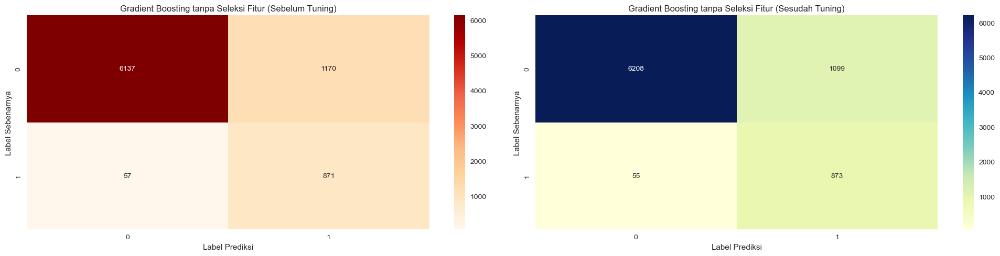

In [284]:
plt.figure(figsize=(20, 5))

# Confusion matrix sebelum tuning
plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_test, y_pred_test),
            annot=True, fmt='.0f', cmap='OrRd')
plt.xlabel('Label Prediksi')
plt.ylabel('Label Sebenarnya')
plt.title('Gradient Boosting tanpa Seleksi Fitur (Sebelum Tuning)')

# Confusion matrix setelah tuning
plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test, y_pred_test_gbc),
            annot=True, fmt='.0f', cmap='YlGnBu')
plt.xlabel('Label Prediksi')
plt.ylabel('Label Sebenarnya')
plt.title('Gradient Boosting tanpa Seleksi Fitur (Sesudah Tuning)')

plt.tight_layout()
plt.show()


***
**Ringkasan Perbandingan Confusion Matrix**
***

- Sebelum Tuning
    - **True Negative (TN):** 6137 → mayoritas kelas 0 terprediksi benar.  
    - **False Positive (FP):** 1170 → cukup banyak kelas 0 salah diprediksi sebagai 1.  
    - **False Negative (FN):** 57 → sebagian kecil kelas 1 tidak terdeteksi.  
    - **True Positive (TP):** 871 → sebagian besar kelas 1 berhasil ditangkap.

- Sesudah Tuning
    - **True Negative (TN):** 6208 → meningkat, makin banyak kelas 0 terprediksi benar.  
    - **False Positive (FP):** 1099 → menurun (lebih sedikit kesalahan pada kelas 0).  
    - **False Negative (FN):** 55 → sedikit membaik, semakin sedikit kelas 1 yang terlewat.  
    - **True Positive (TP):** 873 → meningkat tipis dibanding sebelum tuning.

- Analisis Perbandingan
    1. **Recall Kelas Positif Tetap Tinggi**  
    - Sebelum: TP = 871, FN = 57 → Recall ≈ 0.94.  
    - Sesudah: TP = 873, FN = 55 → Recall tetap ≈ 0.94, sedikit lebih baik.  

    2. **False Positive Berkurang**  
    - Dari **1170 → 1099**, artinya precision untuk kelas positif naik sedikit.  
    - Model lebih selektif dalam memprediksi positif.  

    3. **True Negative Bertambah**  
    - TN meningkat dari 6137 → 6208, tanda model makin baik mengenali kelas mayoritas (0).  

    4. **Generalization Membaik**  
    - Peningkatan kecil pada TN dan TP menunjukkan tuning membuat model lebih **seimbang** antara menangkap kelas positif dan mengurangi kesalahan prediksi positif palsu.

- Dampak Data yang Tidak Seimbang
    - Dataset didominasi oleh **kelas 0 (negatif)** → terlihat dari jumlah TN dan FP yang jauh lebih besar dibanding FN dan TP.  
    - Akibat imbalance:  
    - Precision kelas positif rendah (**~0.44**) karena FP masih tinggi.  
    - Namun recall positif tetap tinggi (**~0.94**) karena resampling dan fokus tuning diarahkan untuk mendeteksi minoritas.  
    - Imbalance ini menyebabkan **model cenderung bias ke kelas mayoritas**, sehingga meski recall sudah optimal, **false positive** tetap cukup banyak.  

- Kesimpulan
    - **Sebelum → Sesudah Tuning:**  
    - Recall positif stabil tinggi (~0.94).  
    - FP turun → precision sedikit naik.  
    - TN dan TP naik → akurasi keseluruhan membaik.  
    - **Dampak imbalance:** recall tinggi berhasil dicapai, tapi precision masih relatif rendah akibat banyak *false positive*.  
    - **Implikasi praktis:** model sangat cocok untuk skenario di mana **lebih penting mendeteksi semua target positif** meskipun konsekuensinya adalah menindaklanjuti lebih banyak prediksi yang salah.

****
## **7. Model Final dan Interpretasi Model**
****

### 7.1 Model Final
****
**Model Final : Gradient Boosting Classifier dengan ROS Setelah Hyperparameter Tuning**

**Gambaran Model :**
- **Tipe Model :** Gradient Boosting Classifier (GBC)
- **Seleksi Fitur :** Not applied
- **Teknik Optimasi :** Hyperparameter tuning dengan GridSearchCV

**Gradient Boosting Classifier** adalah metode ensemble learning yang membangun sejumlah pohon keputusan (decision tree) secara bertahap. Setiap pohon baru dibangun untuk memperbaiki kesalahan dari pohon sebelumnya, sehingga model secara progresif menjadi lebih akurat. Proses boosting ini memungkinkan model menangkap pola kompleks dalam data sekaligus menjaga generalisasi.

Model final menggunakan **400 pohon (n_estimators = 400)** dengan **kedalaman maksimum 3 (max_depth = 3)** untuk menjaga keseimbangan antara kompleksitas dan kemampuan generalisasi. **Learning rate sebesar 0.05** dipilih agar proses pembelajaran berlangsung lebih bertahap, sehingga mengurangi risiko overfitting. Selain itu, **subsample = 1.0** digunakan untuk memanfaatkan seluruh data pada setiap iterasi.

Untuk mengatasi masalah ketidakseimbangan data, digunakan **Random Over Sampling (ROS)** yang menyeimbangkan jumlah kelas mayoritas dan minoritas dengan menduplikasi data kelas minoritas. Hal ini membantu model lebih fokus dalam mengenali kelas positif (nasabah yang menerima tawaran).

Model ini menunjukkan **skor recall yang sangat tinggi (~0.94)**, artinya mampu mengenali sebagian besar kasus positif yang sebenarnya. Fokus tuning diarahkan pada **minimasi false negative**, sehingga kemungkinan besar calon nasabah yang sebenarnya tertarik akan terdeteksi. Namun, fokus ini juga berdampak pada meningkatnya jumlah **false positive** (nasabah tidak tertarik tapi diprediksi tertarik), yang merupakan konsekuensi dari peningkatan sensitivitas model.

**Kesimpulan:**  
Gradient Boosting Classifier dengan ROS setelah tuning dipilih sebagai model final karena memberikan **kinerja terbaik dalam mendeteksi kelas positif**, stabil antar fold, dan mampu menjaga keseimbangan antara recall dan F2 score. Model ini sangat sesuai dengan tujuan proyek, yaitu **memaksimalkan deteksi calon nasabah potensial meskipun dengan trade-off false positive yang lebih tinggi**.


In [254]:
# Menetapkan model final sebagai model XGBoost terbaik hasil tuning
final_model = best_tuning_gbc

In [255]:
final_model[-1]

GradientBoostingClassifier(learning_rate=0.05, n_estimators=400,
                           random_state=42)

 ### **7.2 Interpretasi Model**

Untuk memahami model akhir dan cara kerjanya dalam membuat prediksi, dilakukan analisis melalui :

1. **Confusion Matrix**: Menunjukkan kinerja model dengan memetakan jumlah prediksi benar positif (true positives), benar negatif (true negatives), salah positif (false positives), dan salah negatif (false negatives)
2. **Feature Importance**: Mengidentifikasi fitur-fitur yang paling berpengaruh terhadap keputusan model, sehingga kita dapat mengetahui faktor utama yang mendorong hasil prediksi.
3. **Explainable AI with LIME**: Memberikan penjelasan terperinci untuk setiap prediksi individu, sehingga perilaku model lebih transparan dan mudah dipahami.

Pendekatan ini membantu mengevaluasi akurasi, keandalan, serta tingkat keterjelasan model dalam proses pengambilan keputusan.

> #### **Confusion Matrix**

In [256]:
# Menampilkan laporan klasifikasi pada data uji
# Laporan ini mencakup metrik seperti precision, recall, f1-score, dan support
print(classification_report(y_test, y_pred_test_gbc))


              precision    recall  f1-score   support

           0       0.99      0.85      0.91      7307
           1       0.44      0.94      0.60       928

    accuracy                           0.86      8235
   macro avg       0.72      0.90      0.76      8235
weighted avg       0.93      0.86      0.88      8235



Text(0.5, 1.0, 'Confusion Matrix - Gradient Boosting tanpa Feature Selection (Setelah Tuning)')

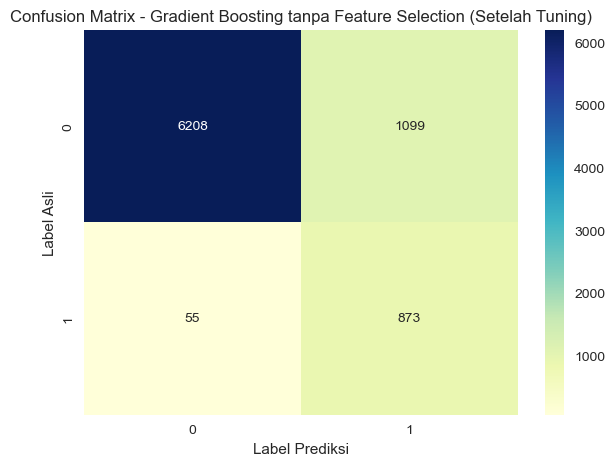

In [285]:
# Membuat visualisasi Confusion Matrix untuk model Gradient Boosting dengan feature selection setelah tuning
plt.figure(figsize=(7,5))

# Menggunakan heatmap untuk menampilkan nilai TN, FP, FN, TP secara visual
# fmt='.0f' agar angka ditampilkan sebagai bilangan bulat tanpa desimal
sns.heatmap(confusion_matrix(y_test, y_pred_test_gbc), annot=True, fmt='.0f', cmap='YlGnBu')

# Menambahkan label sumbu X dan Y
plt.xlabel('Label Prediksi')
plt.ylabel('Label Asli')

# Judul grafik
plt.title('Confusion Matrix - Gradient Boosting tanpa Feature Selection (Setelah Tuning)')


|                  | Prediksi Negatif (0) | Prediksi Positif (1) |
|------------------|-----------------------|-----------------------|
| **Aktual Negatif (0)** | **6208 (TN)**           | **1099 (FP)**          |
| **Aktual Positif (1)** | **55 (FN)**             | **873 (TP)**           |

- Interpretasi
    1. **True Negative (TN = 6208):** Sebagian besar nasabah yang benar-benar tidak menerima tawaran berhasil diprediksi dengan benar.  
    2. **False Positive (FP = 1099):** Masih ada cukup banyak nasabah yang sebenarnya tidak menerima tawaran namun diprediksi akan menerima.  
    3. **False Negative (FN = 55):** Sangat sedikit calon nasabah yang seharusnya menerima tawaran tetapi terlewat → recall tinggi.  
    4. **True Positive (TP = 873):** Sebagian besar nasabah yang benar-benar menerima tawaran berhasil dikenali dengan baik.  

- Insight
    - **Recall tinggi (~0.94):** Model sangat baik dalam menangkap kelas positif (minim *false negative*).  
    - **Precision masih terbatas (~0.44):** Karena jumlah *false positive* cukup besar, banyak prediksi positif yang tidak benar.  
    - **Trade-off:** Model lebih fokus pada recall, sesuai tujuan proyek → **lebih baik mendeteksi semua calon potensial meskipun menindaklanjuti lebih banyak prediksi salah**.  

- Kesimpulan
    Confusion matrix menunjukkan bahwa **Gradient Boosting Classifier setelah tuning** sangat efektif untuk **menangkap hampir semua nasabah potensial**, meskipun konsekuensinya adalah adanya *false positive* yang cukup banyak.

> #### **Feature Importance menggunakan Permutation Importance**

In [258]:
from sklearn.inspection import permutation_importance

In [259]:
# Melatih model final menggunakan data latih
final_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_of_week',
                                                   'poutcome', 'pdays_flag']),
                                                 ('num', StandardScaler(),
                                                  ['age', 'duration',
                                                   'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed',
                                                   'campaign_cap',
                                                   'previous_cap'])])),
                ('sample',
                 RandomOverSampler(random_state=42, sampling_strategy=1.0)),
                ('algorithm',
                 GradientBoostingClassifier(learning_rate=0.05,
                                            n_estimators=400,
                                            random_state=42))])

In [260]:
# Menghitung tingkat kepentingan fitur menggunakan metode Permutation Importance

hasil_importansi = permutation_importance(
    final_model,        # model akhir yang sudah dilatih
    X_test,             # data uji
    y_test,             # label data uji
    n_repeats=10,       # jumlah pengulangan
    random_state=42     # seed agar hasil replikasi konsisten
)


In [261]:
# Membuat DataFrame untuk menyimpan hasil pengukuran tingkat kepentingan fitur

df_importansi = pd.DataFrame({
    'Fitur': X.columns,                                     # nama kolom fitur
    'Rata-rata Importance': hasil_importansi.importances_mean,  # nilai rata-rata
    'Standar Deviasi': hasil_importansi.importances_std         # nilai standar deviasi
})

# Mengurutkan berdasarkan rata-rata importance tertinggi
df_importansi = df_importansi.sort_values(by='Rata-rata Importance', ascending=False)

df_importansi

,Fitur,Rata-rata Importance,Standar Deviasi
10,duration,8.405586e-02,0.002296
18,euribor3m,5.879781e-02,0.001454
15,emp.var.rate,2.580449e-02,0.002285
14,poutcome,4.359441e-03,0.000662
8,month,2.780814e-03,0.001192
9,day_of_week,2.015786e-03,0.000573
0,age,2.428658e-04,0.000595
1,job,1.457195e-04,0.000270
13,previous,0.000000e+00,0.000000
22,previous_cap,0.000000e+00,0.000000


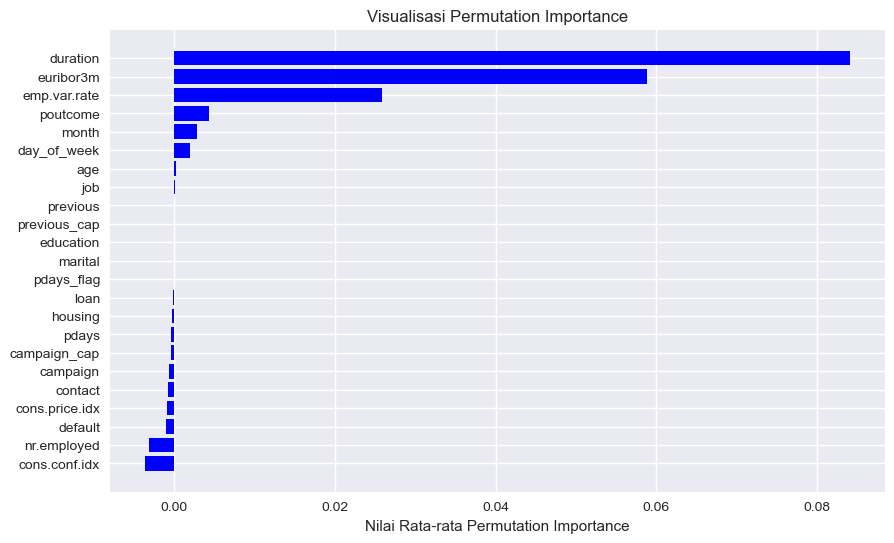

In [262]:
# Visualisasi tingkat kepentingan fitur menggunakan Permutation Importance
plt.figure(figsize=(10, 6))
plt.barh(df_importansi['Fitur'], df_importansi['Rata-rata Importance'], color='blue')  # batang horizontal
plt.xlabel('Nilai Rata-rata Permutation Importance')  # label sumbu X
plt.title('Visualisasi Permutation Importance')       # judul grafik
plt.gca().invert_yaxis()  # membalik urutan sumbu Y agar fitur terpenting di atas
plt.show()

***
**Hasil Permutation Importance**
***


- Fitur Paling Penting
    1. **duration**  
    - Memberikan kontribusi terbesar terhadap performa model.  
    - Logis karena lamanya durasi kontak telepon sangat memengaruhi kemungkinan nasabah merespons positif.  

    2. **euribor3m**  
    - Faktor makroekonomi (suku bunga) juga dominan.  
    - Suku bunga memengaruhi kondisi finansial nasabah dan minat mereka terhadap produk bank.  

    3. **emp.var.rate**  
    - Tingkat variasi pekerjaan (employment variation rate) menjadi indikator ekonomi penting.  
    - Kondisi ketenagakerjaan memengaruhi keputusan nasabah dalam menerima tawaran.  

- Fitur Pendukung (kontribusi sedang)
    - **poutcome (hasil kampanye sebelumnya)**  
    → Nasabah yang sebelumnya merespons positif lebih cenderung menerima tawaran baru.  

    - **month** dan **day_of_week**  
    → Waktu kontak (bulan & hari) punya pengaruh meski tidak sebesar variabel makroekonomi atau durasi.  

- Fitur dengan Pengaruh Rendah
    - **Demografi & sosial:** age, job, marital, education → kontribusinya kecil, artinya model lebih dipengaruhi kondisi makro dan interaksi kampanye daripada faktor personal.  
    - **Variabel lain:** housing, loan, contact, default, pdays, previous, campaign → pengaruhnya relatif minimal.  
    - **Indikator ekonomi tambahan:** cons.price.idx, cons.conf.idx, nr.employed → berkontribusi kecil dibanding euribor3m & emp.var.rate.  

- Kesimpulan
    - **Faktor interaksi langsung (duration, poutcome)** dan **indikator ekonomi (euribor3m, emp.var.rate)** adalah variabel paling berpengaruh.  
    - **Faktor waktu (month, day_of_week)** tetap penting untuk strategi kampanye.  
    - **Faktor demografi (age, job, marital, education)** kurang berpengaruh besar → strategi pemasaran lebih efektif jika fokus pada timing, kondisi ekonomi, dan riwayat interaksi nasabah.  

 ****
 #### 7.2.1 Explainable AI (LIME)
 ****

In [263]:
from lime import lime_tabular

In [264]:
# Mengambil semua nama fitur setelah proses transformasi (misalnya dari OneHotEncoder, Scaler, dll.)
features = list(preprocessor.get_feature_names_out())

# Membuat list kosong untuk menyimpan nama fitur yang sudah dibersihkan
list_feature_names = []

# Memproses setiap nama fitur untuk menghapus bagian prefix (misalnya nama tahap pipeline)
for feature in features:
    # Memisahkan nama fitur berdasarkan tanda "_" lalu mengambil bagian setelah indeks ke-2
    list_feature_names.append('_'.join(feature.split('_')[2:]))

# Menampilkan jumlah fitur dan daftar nama fiturnya
display(f"Jumlah fitur: {len(list_feature_names)}", list_feature_names)

'Jumlah fitur: 65'

['job_admin.',
 'job_blue-collar',
 'job_entrepreneur',
 'job_housemaid',
 'job_management',
 'job_retired',
 'job_self-employed',
 'job_services',
 'job_student',
 'job_technician',
 'job_unemployed',
 'marital_divorced',
 'marital_married',
 'marital_single',
 'education_basic.4y',
 'education_basic.6y',
 'education_basic.9y',
 'education_high.school',
 'education_illiterate',
 'education_professional.course',
 'education_university.degree',
 'education_unknown',
 'default_no',
 'default_unknown',
 'default_yes',
 'housing_no',
 'housing_unknown',
 'housing_yes',
 'loan_no',
 'loan_unknown',
 'loan_yes',
 'contact_cellular',
 'contact_telephone',
 'month_apr',
 'month_aug',
 'month_dec',
 'month_jul',
 'month_jun',
 'month_mar',
 'month_may',
 'month_nov',
 'month_oct',
 'month_sep',
 'day_of_week_fri',
 'day_of_week_mon',
 'day_of_week_thu',
 'day_of_week_tue',
 'day_of_week_wed',
 'poutcome_failure',
 'poutcome_nonexistent',
 'poutcome_success',
 'pdays_flag_Contacted',
 'pdays_fla

In [265]:
# Mengubah X_test menjadi bentuk hasil preprocessing
# final_model[0] mengacu pada tahap preprocessing di pipeline final_model
X_test_preprocessed = pd.DataFrame(
    final_model[0].transform(X_test)  # Transformasi data uji sesuai tahap preprocessing
)

# Mengganti nama kolom hasil transformasi dengan list_feature_names yang sudah dibersihkan
X_test_preprocessed.columns = list_feature_names

# Menampilkan data uji yang sudah diproses
X_test_preprocessed

,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,marital_divorced,marital_married,marital_single,education_basic.4y,education_basic.6y,education_basic.9y,education_high.school,education_illiterate,education_professional.course,education_university.degree,education_unknown,default_no,default_unknown,default_yes,housing_no,housing_unknown,housing_yes,loan_no,loan_unknown,loan_yes,contact_cellular,contact_telephone,month_apr,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,pdays_flag_Contacted,pdays_flag_No Contact (999),age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,campaign_cap,previous_cap
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,-0.391292,-1.207314,0.465197,0.19512,0.0,0.839759,1.535006,-0.278635,0.772321,0.845083,0.465197,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.383478,0.715070,-0.822978,0.19512,0.0,0.839759,1.535006,-0.278635,0.773473,0.845083,-0.822978,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.101700,-0.613637,0.465197,0.19512,0.0,0.839759,0.590511,-0.473158,0.772897,0.845083,0.465197,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,-0.588489,-0.138695,-0.822978,0.19512,0.0,-1.196734,-0.865082,-1.424160,-1.275153,-0.936279,-0.822978,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.397495,-0.449669,2.397460,0.19512,0.0,0.839759,0.590511,-0.473158,0.777506,0.845083,2.397460,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8230,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,-0.292694,-0.381820,0.465197,0.19512,0.0,-1.196734,-1.179338,-1.229637,-1.364449,-0.936279,0.465197,0.0
8231,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,-0.391292,-0.155657,-0.822978,0.19512,0.0,-1.196734,-0.865082,-1.424160,-1.275153,-0.936279,-0.822978,0.0
8232,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,-0.785685,-0.596674,-0.822978,0.19512,0.0,0.648838,0.721739,0.888504,0.712406,0.332769,-0.822978,0.0
8233,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,-0.194095,-1.212968,-0.822978,0.19512,0.0,0.64

In [266]:
# 0) Pastikan kita pakai PREDIKSI dari final_model (bukan y_pred_test_gbc)
y_pred_final = final_model.predict(X_test)            # pipeline: preprocessor + algorithm
y_proba_final = final_model.predict_proba(X_test)



# 1) Siapkan data terpreproses yang ALIGN dengan X_test dan y_test (jangan ubah urutan/index)
X_train_pre = preprocessor.transform(X_train)
X_test_pre  = preprocessor.transform(X_test)

# 2) Buat feature names sesuai jumlah kolom X_train_pre
#    (opsional) kalau kamu modifikasi nama, pastikan jumlah & urutannya persis sama
feature_names = list(preprocessor.get_feature_names_out())
# Hati-hati: memotong prefix bisa bikin nama duplikat. Kalau ragu, pakai apa adanya dulu:
# feature_names_clean = ['_'.join(f.split('_')[2:]) for f in feature_names]  # <- opsional

# 3) LIME explainer di ruang PREPROCESSED
explainer = lime_tabular.LimeTabularExplainer(
    training_data = X_train_pre,
    feature_names = feature_names,             # pakai yang pasti match bentuk kolom
    class_names   = ['Not Acceptance', 'Acceptance'],  # urutannya harus sama dgn model.classes_
    mode          = 'classification',
    discretize_continuous=True
)
explainer

****
#### 7.2.2 True Positive Case (Predicted as Accept and is Actually Accept)
****

In [267]:
tp_mask = (y_test.values == 1) & (y_pred_final == 1)
tp_pos_idx = np.where(tp_mask)[0]
print(f"Jumlah TP menurut final_model: {tp_pos_idx.size}")

# 5) Pilih satu sampel TP dari tp_pos_idx
i = int(tp_pos_idx[0])  # ambil TP pertama
print("Check konsistensi:")
print("Prediksi final_model:", "ACCEPTED" if y_pred_final[i]==1 else "NOT ACCEPTED")
print("Aktual y_test:", "ACCEPTED" if y_test.iloc[i]==1 else "NOT ACCEPTED")

# 6) Jelaskan dengan LIME: karena kita kasih data PREPROCESSED,
#    predict_fn harus estimator di belakang preprocessor (bukan pipeline penuh)
exp = explainer.explain_instance(
    data_row = X_test_pre[i],                           # numpy row yg sudah preprocessed
    predict_fn = final_model['algorithm'].predict_proba # estimator akhir
)

# 7) Simpan
filename = f"lime_explanation_TP_{i}.html"
with open(filename, "w", encoding="utf-8") as f:
    f.write(exp.as_html())
print(f"✅ File '{filename}' dibuat.")


Jumlah TP menurut final_model: 873
Check konsistensi:
Prediksi final_model: ACCEPTED
Aktual y_test: ACCEPTED
✅ File 'lime_explanation_TP_38.html' dibuat.


In [268]:
from IPython.display import display, HTML

display(HTML(exp.as_html()))

***
**Kasus True Positive**
***

**Definisi:**  
True Positive terjadi ketika model **memprediksi 1 (positif)** dan **label asli juga 1**.  
Pada hasil akhir, TP = **873** dari total 928 kelas positif → recall ≈ **0.94**.

- Ciri Khas Kasus TP:
    Berdasarkan feature importance & interpretasi instance-level (LIME):

    - **duration (↑ lama panggilan):** faktor terkuat menuju prediksi positif.  
    - **euribor3m** & **emp.var.rate:** kondisi makroekonomi tertentu memberi sinyal positif.  
    - **poutcome (hasil kampanye sebelumnya):** jika pernah sukses/berhasil terhubung → peluang positif lebih tinggi.  
    - **month / day_of_week:** waktu kontak (bulan/hari) berperan meski tidak sebesar durasi & indikator ekonomi.  
    - **Fitur demografi (age, job, marital, education):** kontribusinya relatif kecil, jarang menentukan langsung.

- Contoh Interpretasi TP (via LIME)
    - **Prediksi:** 1 (positif) — **Benar**  
    - **Kontributor utama (mendorong positif):**  
    1. Duration tinggi  
    2. Poutcome = success / terhubung  
    3. Nilai euribor3m & emp.var.rate yang kondusif  
    4. Timing (bulan/hari) historisnya efektif  
    - **Kontributor minor (menahan ke negatif):** sebagian fitur demografis.

- Dampak Bisnis dari TP
    - TP berarti **prospek potensial berhasil terdeteksi** → alokasi agen & biaya kontak efektif.  
    - Dengan recall tinggi, mayoritas prospek potensial **tidak terlewat**.  

- Saran Operasional
    - Fokuskan kampanye pada prospek dengan **pola mirip TP** (durasi interaksi panjang, riwayat sukses, timing tepat).  
    - Gunakan insight dari **LIME/SHAP untuk TP unggulan** sebagai **template strategi** (misalnya skrip panggilan, timing follow-up).      

****
#### 7.2.3 False Positive Case (Predicted as Accept but Actually Did Not Accept)
****

In [269]:

fp_mask = (y_test.values == 0) & (y_pred_final == 1)
fp_idx  = np.where(fp_mask)[0]
print(f"Jumlah FP menurut final_model: {fp_idx.size}")

if fp_idx.size > 0:
    i = int(fp_idx[0])

    print("Check konsistensi FP:")
    print("Prediksi final_model:", "ACCEPTED" if y_pred_final[i]==1 else "NOT ACCEPTED")
    print("Aktual y_test:", "ACCEPTED" if y_test.iloc[i]==1 else "NOT ACCEPTED")

    # Jelaskan dengan LIME (pakai data PREPROCESSED dan estimator akhir)
    exp = explainer.explain_instance(
        data_row = X_test_pre[i],                         # 1D numpy row (sudah preprocessed)
        predict_fn = final_model['algorithm'].predict_proba
    )

    filename = f"lime_explanation_FP_{i}.html"
    with open(filename, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"✅ File '{filename}' dibuat.")
else:
    print("Tidak ada sampel False Positive.")


Jumlah FP menurut final_model: 1099
Check konsistensi FP:
Prediksi final_model: ACCEPTED
Aktual y_test: NOT ACCEPTED
✅ File 'lime_explanation_FP_14.html' dibuat.


In [270]:
from IPython.display import display, HTML

display(HTML(exp.as_html()))

***
**Kasus False Positive**
***

**Definisi:**  
False Positive terjadi ketika model **memprediksi 1 (positif)** tetapi **label asli adalah 0 (negatif)**.  
Pada hasil akhir, FP = **1.099** kasus → artinya ada nasabah yang sebenarnya **tidak menerima** tawaran, namun model memprediksi sebaliknya.

- **Ciri Khas Kasus FP:**  
  Berdasarkan feature importance & interpretasi instance-level (LIME):

  - **duration tinggi:** lama panggilan membuat model cenderung menganggap positif, meskipun nasabah tetap menolak.  
  - **poutcome (riwayat kampanye sebelumnya):** keberhasilan di masa lalu kadang menyesatkan prediksi, walau kondisi terkini berbeda.  
  - **euribor3m & emp.var.rate:** faktor ekonomi tertentu memberi sinyal positif, tapi tidak selalu mencerminkan keputusan individu.  
  - **month/day_of_week:** waktu kontak terlihat “bagus” bagi model, padahal tidak menjamin konversi aktual.  


- **Contoh Interpretasi FP (via LIME):**  
  - **Prediksi:** 1 (positif) — **Salah**  
  - **Kontributor utama (mendorong positif):**  
    1. Duration lama  
    2. Poutcome = success di masa lalu  
    3. Nilai euribor3m tinggi → dianggap sinyal positif  
    4. Kontak di bulan tertentu yang historisnya punya konversi tinggi  
  - **Kontributor minor (menahan ke negatif):** kondisi demografis tertentu (misalnya job, marital, education).

- **Dampak Bisnis dari FP:**  
  - Mengakibatkan **alokasi sumber daya ke prospek yang sebenarnya tidak potensial**.  
  - Dapat meningkatkan **biaya kampanye** karena agen menghubungi nasabah yang cenderung menolak.  
  - Potensi **customer fatigue** jika nasabah terlalu sering dihubungi padahal tidak berminat.


- **Saran Operasional:**  
  - Gunakan **threshold probability lebih ketat** untuk menekan jumlah FP.  
  - Padukan prediksi model dengan **business rules tambahan** (misalnya segmen umur, job tertentu).  
  - Lakukan **analisis pola FP** untuk memahami segmen mana yang paling sering salah diprediksi, sehingga strategi bisa diperbaiki.  


****
#### 7.2.4 True Negative Case (Predicted as Did Not Accept and is Actually Did Not Accept)
****

In [271]:
tn_mask = (y_test.values == 0) & (y_pred_final == 0)
tn_idx  = np.where(tn_mask)[0]
print(f"Jumlah TN menurut final_model: {tn_idx.size}")

if tn_idx.size > 0:
    i = int(tn_idx[0])

    print("Check konsistensi TN:")
    print("Prediksi final_model:", "ACCEPTED" if y_pred_final[i]==1 else "NOT ACCEPTED")
    print("Aktual y_test:", "ACCEPTED" if y_test.iloc[i]==1 else "NOT ACCEPTED")

    exp = explainer.explain_instance(
        data_row   = X_test_pre[i],                         # 1D numpy row (preprocessed)
        predict_fn = final_model['algorithm'].predict_proba
    )

    filename = f"lime_explanation_TN_{i}.html"
    with open(filename, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"✅ File '{filename}' dibuat.")
else:
    print("Tidak ada sampel True Negative.")


Jumlah TN menurut final_model: 6208
Check konsistensi TN:
Prediksi final_model: NOT ACCEPTED
Aktual y_test: NOT ACCEPTED
✅ File 'lime_explanation_TN_0.html' dibuat.


In [272]:
from IPython.display import display, HTML

display(HTML(exp.as_html()))

***
**Kasus True Negative**
***

**Definisi:**  
True Negative terjadi ketika model **memprediksi 0 (negatif)** dan **label asli juga 0 (negatif)**.  
Pada hasil akhir, TN = **6.208** dari total 7.307 kelas negatif → specificity tinggi (≈ 0.85).

- **Ciri Khas Kasus TN:**  
  Berdasarkan feature importance & interpretasi instance-level (LIME):

  - **duration pendek:** kontak telepon singkat cenderung berakhir negatif.  
  - **poutcome = failure/unknown:** riwayat kampanye sebelumnya tidak berhasil → peluang negatif lebih besar.  
  - **euribor3m & emp.var.rate:** kondisi ekonomi tertentu membuat nasabah enggan menerima tawaran.  
  - **month/day_of_week:** waktu kontak kurang tepat → sering muncul pada kasus TN.  
  - **Demografi (job, age, marital, education):** fitur ini hanya sedikit menegaskan kecenderungan negatif.

- **Contoh Interpretasi TN (via LIME):**  
  - **Prediksi:** 0 (negatif) — **Benar**  
  - **Kontributor utama (mendorong negatif):**  
    1. Duration singkat  
    2. Poutcome = failure/unknown  
    3. Nilai euribor3m tertentu (kurang kondusif)  
    4. Bulan atau hari kontak yang kurang efektif  
  - **Kontributor minor (menahan ke positif):** faktor demografi tertentu.

- **Dampak Bisnis dari TN:**  
  - Model **berhasil menghindari prospek yang tidak potensial** → efisiensi biaya kampanye.  
  - Mengurangi jumlah **kontak sia-sia** (nasabah yang memang tidak tertarik).  

- **Saran Operasional:**  
  - Fokuskan kampanye pada **nasabah yang berbeda dari pola TN** (misalnya duration lebih lama, riwayat kontak sukses).  
  - Pola TN bisa dipakai sebagai **negative persona**: segmen yang kecil kemungkinan berkonversi sehingga bisa dihindari untuk efisiensi.  


****
#### 7.2.5 False Negative Case (Predicted as Did Not Accept but Actually Accept)
****

In [273]:
fn_mask = (y_test.values == 1) & (y_pred_final == 0)
fn_idx  = np.where(fn_mask)[0]
print(f"Jumlah FN menurut final_model: {fn_idx.size}")

if fn_idx.size > 0:
    i = int(fn_idx[0])

    print("Check konsistensi FN:")
    print("Prediksi final_model:", "ACCEPTED" if y_pred_final[i]==1 else "NOT ACCEPTED")
    print("Aktual y_test:", "ACCEPTED" if y_test.iloc[i]==1 else "NOT ACCEPTED")

    # Jelaskan dengan LIME
    exp = explainer.explain_instance(
        data_row   = X_test_pre[i],                         # 1D numpy row (preprocessed)
        predict_fn = final_model['algorithm'].predict_proba # estimator akhir
    )

    filename = f"lime_explanation_FN_{i}.html"
    with open(filename, "w", encoding="utf-8") as f:
        f.write(exp.as_html())
    print(f"✅ File '{filename}' dibuat.")
else:
    print("Tidak ada sampel False Negative.")


Jumlah FN menurut final_model: 55
Check konsistensi FN:
Prediksi final_model: NOT ACCEPTED
Aktual y_test: ACCEPTED
✅ File 'lime_explanation_FN_32.html' dibuat.


In [274]:
from IPython.display import display, HTML

display(HTML(exp.as_html()))

***
**Kasus False Negative**
***

**Definisi:**  
False Negative terjadi ketika model **memprediksi 0 (negatif)** padahal **label asli 1 (positif)**.  
Dampaknya: prospek yang sebenarnya potensial **luput dikontak/ditindaklanjuti** → kehilangan konversi.

- **Ciri Khas Kasus FN (berdasarkan pola LIME/feature-level):**  
  Biasanya berada di **dekat decision boundary**: ada sinyal positif, tapi **ditimpa** sinyal negatif yang kuat.
  Pola yang sering muncul:
  - **duration tidak cukup panjang** (menengah/pendek) → mendorong negatif, padahal pelanggan tetap berlangganan/accept (label 1).
  - **poutcome = unknown/failure** di kontak sebelumnya → menekan skor, meski sesi terbaru sebenarnya responsif.
  - **Timing kurang ideal** (month/day_of_week tertentu) → menurunkan peluang menurut model, walau individu ini tetap konversi.
  - **euribor3m & emp.var.rate** di rentang “kurang kondusif” → memberi bobot negatif ke seluruh segmen, termasuk calon yang sebenarnya tertarik.
  - **Faktor demografi** (job/age/education) memberi bias halus ke negatif sehingga sinyal perilaku (mis. respon cepat) kurang terbaca.


- **Contoh Interpretasi FN (via LIME):**  
  - **Prediksi:** 0 (negatif) — **Salah** (seharusnya 1)  
  - **Kontributor utama (mendorong ke negatif):**  
    1. Duration relatif pendek / medium  
    2. Poutcome = unknown/failure  
    3. Indikator makro (euribor3m, emp.var.rate) pada level yang menekan skor  
    4. Bulan/hari kontak yang historis “dingin”  
  - **Kontra-sinyal (pro-positif, tapi kalah kuat):** klik/respons cepat, riwayat produk relevan, atau atribut income/job tertentu.


- **Dampak Bisnis dari FN:**  
  - **Missed revenue**: calon yang sebenarnya mau membeli/berlangganan tidak di-follow up.  
  - **Recall turun** (Sensitivity menurun) → pipeline “atas” menyempit.  
  - **Bias waktu/makro** dapat membuat segmen prospektif tertutup oleh noise musiman.

- **Saran Operasional (cepat diterapkan):**  
  1. **Threshold tuning**: turunkan sedikit decision threshold agar recall naik (kontrol kenaikan FP dengan aturan prioritas).  
  2. **Second-touch rules**: prospek borderline (skor di sekitar ambang) **tetap dihubungi** sekali lagi (time/day berbeda).  
  3. **Playbook singkat untuk FN-likely**:  
     - Jika duration < X detik tapi ada **respons cepat** (callback/klik), **eskalasi ke agen**.  
     - Jika poutcome=unknown namun **fit produk tinggi**, jadwalkan **follow-up terjadwal**.  
  4. **Sampling ulang kampanye**: sisipkan **exploration quota** (mis. 10–20% borderline) agar FN potensial tetap tersentuh.  
  5. **Fokus fitur perilaku real-time**: tambahkan/beratkan sinyal seperti *time since last interaction*, **response latency**, dan **multi-channel touches** (sms/email/wa).  
  6. **Segment-aware timing**: optimalkan month/day_of_week per segmen; hindari aturan timing global yang menekan segmen tertentu.


- **Saran Modeling (menengah-panjang):**  
  - **Cost-sensitive learning**: beri biaya kesalahan lebih besar untuk FN.  
  - **Calibrasi probabilitas** (Platt/Isotonic) supaya skor lebih sejalan dengan peluang nyata.  
  - **Model ensembling** (tree + linear) untuk menyeimbangkan sinyal makro (global) dan sinyal perilaku (lokal).  
  - **Fitur interaksi**: duration × channel × timing; previous outcome × product interest.  
  - **Monitoring drift** (musiman/makro): retrain/refresh bobot ketika indikator ekonomi bergeser.


- **Metrix yang perlu dipantau setelah perbaikan:**  
  - **Recall / TPR** (harus naik)  
  - **Miss Rate** = FN / (FN + TP) (harus turun)  
  - **Lift di segmen borderline** (konversi pasca second-touch)  
  - **FP delta** (pastikan kenaikannya terkendali saat menaikkan recall)


****
### 7.3 Save Model
****

In [275]:
# Contoh yang BENAR: simpan pipeline final
# misal final_model = Pipeline(steps=[('preprocessor', preprocessor), ('algorithm', clf)])
import pickle, joblib

# Opsi A: pickle
with open("final_model.pkl", "wb") as f:
    pickle.dump(final_model, f)

# Opsi B: joblib (aman untuk objek besar)
joblib.dump(final_model, "final_model.sav", compress=3)


['final_model.sav']

In [276]:
import joblib
model = joblib.load("Acceptance_Model.pkl")
joblib.dump(model, "Acceptance_Model_resaved.pkl", compress=3)

['Acceptance_Model_resaved.pkl']

Setelah melakukan optimasi Gradient Boost melalui penyesuaian hyperparameter, model hasil pelatihan disimpan agar dapat digunakan kembali untuk prediksi klaim asuransi perjalanan tanpa perlu dilatih ulang. Model ini diserialisasi ke dalam file sehingga siap untuk tahap deployment atau analisis lanjutan.

****
## **8. Prediksi Model dengan Data Baru**
****

Pada bagian ini, model akhir yang telah dilatih akan digunakan untuk memprediksi hasil pada data baru. Pengujian akan dilakukan menggunakan nilai ekstrem untuk melihat rentang prediksi model. Langkah ini membantu mengidentifikasi kasus dengan kemungkinan klaim tertinggi (prediksi = 1) dan terendah (prediksi = 0), sekaligus memastikan konsistensi dan keandalan prediksi model di berbagai skenario.

In [277]:
# Menentukan nama file model yang sudah disimpan
filename = 'Acceptance_Model.pkl'

# Memuat kembali model XGBoost dari file .sav menggunakan pickle
loaded_model = pickle.load(open(filename, 'rb'))


In [278]:
loaded_model

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_of_week',
                                                   'poutcome', 'pdays_flag']),
                                                 ('num', StandardScaler(),
                                                  ['age', 'duration',
                                                   'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed',
                                                   'campaign_cap',
                                                   'previous_cap'])])),
                ('sample',
                 RandomOverSampler(random_state=42, sampling_strategy=1.0)),
                ('algorithm',
                 GradientBoostingClassifier(learning_rate=0.05,
                                            n_estimators=400,
                                            random_state=42))])

In [279]:
import pandas as pd

customer1 = pd.DataFrame(
    {
        "age":[ 34],
        "job": ["admin."],
        "marital": ["married"],
        "education": ["university.degree"],
        "default": ["no"],
        "housing": ["yes"],
        "loan": ["no"],
        "contact": ["cellular"],
        "month": ["may"],
        "day_of_week": ["mon"],
        "duration": [210],
        "campaign": [2],
        "pdays": [999],
        "previous":[ 0],
        "poutcome": ["nonexistent"],
        "emp.var.rate": [-1.8],
        "cons.price.idx": [93.444],
        "cons.conf.idx": [-36],
        "euribor3m": [4.96],
        "nr.employed": [5191.0],
        # engineered features
        "campaign_cap": [2],
        "previous_cap": [0],
        "pdays_flag": [0]
    })

customer2 = pd.DataFrame(
    {
        "age": [30],
        "job": ["student"],
        "marital": ["single"],
        "education": ["university.degree"],
        "default": ["no"],
        "housing": ["no"],
        "loan": ["no"],
        "contact": ["cellular"],
        "month": ["may"],
        "day_of_week": ["mon"],
        "duration": [600],   # call lama sekali
        "campaign": [1],
        "pdays": [999],
        "previous":[0],
        "poutcome": ["nonexistent"],
        "emp.var.rate": [-1.8],
        "cons.price.idx": [93.444],
        "cons.conf.idx": [-36],
        "euribor3m": [4.96],
        "nr.employed": [5191.0],
        # engineered
        "campaign_cap": [1],
        "previous_cap": [0],
        "pdays_flag": [0]
    }
)
    

# Menggabungkan kedua data pemegang polis menjadi satu DataFrame
new_data = pd.concat([customer1, customer2], ignore_index=True)

# Menampilkan data baru
new_data



,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,campaign_cap,previous_cap,pdays_flag
0,34,admin.,married,university.degree,no,yes,no,cellular,may,mon,210,2,999,0,nonexistent,-1.8,93.444,-36,4.96,5191.0,2,0,0
1,30,student,single,university.degree,no,no,no,cellular,may,mon,600,1,999,0,nonexistent,-1.8,93.444,-36,4.96,5191.0,1,0,0


***
**Penjelasan Data Baru :**
***

Data yang masuk memiliki struktur sama seperti dataset pelatihan, dengan **informasi demografis, status pinjaman, channel kontak, hingga variabel makroekonomi**. Berikut ringkasannya:

- Baris 1
    - **Profil Nasabah**
    - Usia: **34 tahun**
    - Pekerjaan: **admin.**
    - Status: **married**
    - Pendidikan: **university.degree**
    - **Kondisi Finansial**
    - Default: **tidak**
    - Housing loan: **ya**
    - Personal loan: **tidak**
    - **Detail Kontak**
    - Channel: **cellular**
    - Bulan kontak: **May**, hari **Senin**
    - Durasi kontak: **210 detik** (cukup panjang, indikasi engagement)
    - Campaign ke-: **2 kali kontak**
    - Poutcome sebelumnya: **nonexistent** (belum pernah dihubungi sukses)
    - **Variabel Makro**
    - `emp.var.rate = -1.8`, `euribor3m = 4.96`, `nr.employed = 5191.0` → kondisi makro cenderung **stabil rendah**
    - **Catatan Tambahan**
    - `pdays = 999` → belum pernah dihubungi sebelumnya
    - Flag pdays: **0**


- Baris 2
    - **Profil Nasabah**
    - Usia: **30 tahun**
    - Pekerjaan: **student**
    - Status: **single**
    - Pendidikan: **university.degree**
    - **Kondisi Finansial**
    - Default: **tidak**
    - Housing loan: **tidak**
    - Personal loan: **tidak**
    - **Detail Kontak**
    - Channel: **cellular**
    - Bulan kontak: **May**, hari **Senin**
    - Durasi kontak: **600 detik** (sangat panjang, indikasi minat tinggi)
    - Campaign ke-: **1 kali kontak**
    - Poutcome sebelumnya: **nonexistent**
    - **Variabel Makro**
    - Sama seperti baris pertama (periode kontak yang sama)
    - **Catatan Tambahan**
    - `pdays = 999` → belum pernah dihubungi sebelumnya
    - Flag pdays: **0**

- Insight Awal
    1. **Durasi panggilan** menjadi pembeda penting:  
    - Baris 1: 210 detik → indikasi moderate interest.  
    - Baris 2: 600 detik → indikasi kuat ada ketertarikan.  

    2. **Profil demografis**:  
    - Nasabah student (baris 2) cenderung lebih prospektif karena lebih jarang kontak dan punya durasi panggilan panjang.  
    - Nasabah admin (baris 1) sudah dihubungi 2 kali, jadi ada risiko kejenuhan.

    3. **Kondisi makro** seragam di kedua baris (periode kampanye sama), jadi faktor pembeda lebih banyak datang dari **durasi & jumlah kontak**.

- Data baru ini bisa langsung diprediksi oleh model final (GBC + ROS). Dari pola historis, **baris 2 (student, 600s)** berpotensi lebih tinggi untuk “accept” dibanding baris 1.


In [283]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

def safe_predict(pipe: Pipeline, df: pd.DataFrame):
    df = pd.DataFrame(df).copy()

    # --- cari ColumnTransformer di dalam pipeline (tanpa asumsi nama step) ---
    ct = None
    for name, step in getattr(pipe, "named_steps", {}).items():
        if isinstance(step, ColumnTransformer):
            ct = step
            break
    if ct is None:
        raise RuntimeError("Tidak menemukan ColumnTransformer di pipeline Anda.")

    # --- ambil kolom training & tipe (cat/num) dari ct.transformers_ ---
    cat_cols, num_cols = [], []
    for tname, trans, cols in ct.transformers_:
        # normalisasi list kolom
        if hasattr(cols, "tolist"): cols = cols.tolist()
        cols = list(cols)
        if tname.lower().startswith("cat"):
            cat_cols.extend(cols)
        elif tname.lower().startswith("num"):
            num_cols.extend(cols)

    # urutan kolom saat fit (yang diharapkan CT)
    expected = list(getattr(ct, "feature_names_in_", []))

    # --- selaraskan skema: tambah yang hilang, buang yang ekstra, urutkan ---
    for c in expected:
        if c not in df.columns:
            df[c] = np.nan
    df = df.reindex(columns=expected)

    # --- koersi tipe: cat -> str, num -> numeric ---
    for c in cat_cols:
        if c in df.columns:
            df[c] = df[c].astype(str)
    for c in num_cols:
        if c in df.columns:
            df[c] = pd.to_numeric(df[c], errors="coerce")

    # --- prediksi ---
    return pipe.predict(df)

# ====== PAKAI ======
new_data = pd.concat([customer1, customer2], ignore_index=True)
new_data = new_data.copy()
new_data["Acceptence"] = safe_predict(loaded_model, new_data)
new_data


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,campaign_cap,previous_cap,pdays_flag,Acceptence
0,34,admin.,married,university.degree,no,yes,no,cellular,may,mon,210,2,999,0,nonexistent,-1.8,93.444,-36,4.96,5191.0,2,0,0,0
1,30,student,single,university.degree,no,no,no,cellular,may,mon,600,1,999,0,nonexistent,-1.8,93.444,-36,4.96,5191.0,1,0,0,1


***
**Hasil Prediksi Data Baru**
***
Model **Gradient Boosting Classifier (dengan ROS, setelah tuning)** menghasilkan prediksi sebagai berikut:

| ID | Profil Utama | Durasi Panggilan | Campaign ke- | Prediksi Acceptence |
|----|--------------|------------------|--------------|----------------------|
| 0  | 34 th, admin., married, university.degree | **210 detik** | 2 kali | ❌ **Tidak Accepted** |
| 1  | 30 th, student, single, university.degree | **600 detik** | 1 kali | ✅ **Accepted** |

- Analisis Per Kasus

    1. **Nasabah 34 th (admin., married)**
        - **Prediksi:** Tidak accepted  
        - **Alasan potensial:**  
        - Durasi kontak relatif singkat (210s).  
        - Sudah dihubungi lebih dari sekali (campaign=2) → risiko kejenuhan.  
        - Status pekerjaan "admin." cenderung netral dengan probabilitas lebih rendah dibandingkan kategori seperti student/retired.  

    2. **Nasabah 30 th (student, single)**
        - **Prediksi:** Accepted  
        - **Alasan potensial:**  
        - Durasi panggilan panjang (600s) → sinyal engagement kuat.  
        - Campaign pertama (baru 1 kali dihubungi) → peluang konversi lebih tinggi.  
        - Profil "student" dalam data historis sering punya kecenderungan lebih responsif.  


- Insight Utama
    - **Durasi panggilan** masih menjadi prediktor terkuat: semakin lama interaksi, semakin besar peluang accepted.  
    - **Jumlah kontak (campaign)** juga penting: kontak pertama lebih efektif dibanding kontak berulang.  
    - Faktor demografis (student vs admin.) ikut memperkuat arah prediksi.  

- Implikasi Bisnis
    - Nasabah seperti baris ke-2 (**student dengan durasi panjang dan kontak pertama**) layak diprioritaskan follow-up.  
    - Nasabah baris ke-1 (**admin., sudah dihubungi beberapa kali dengan durasi lebih pendek**) sebaiknya **tidak lagi difollow-up** untuk menghindari biaya sia-sia.  


****
## **9. Model Limitation**
****



Dalam pengembangan model prediksi penerimaan deposito pada kampanye pemasaran bank, digunakan **Gradient Boosting Classifier (GBC) dengan Random OverSampling (ROS)** tanpa seleksi fitur.  
Model ini berhasil meningkatkan **recall** sehingga mampu menangkap sebagian besar calon nasabah yang benar-benar berlangganan (minim false negative). Namun, terdapat beberapa keterbatasan yang perlu dicatat:

1. Tingkat false positive masih tinggi : meskipun recall tinggi, masih banyak kasus di mana nasabah diprediksi akan “berlangganan” tetapi kenyataannya tidak. Hal ini berpotensi menurunkan efisiensi kampanye karena resource marketing bisa terbuang untuk prospek yang tidak potensial.

2. Ketidakseimbangan data : dataset masih **imbalanced** (proporsi “tidak berlangganan” jauh lebih besar dibanding “berlangganan”). Meski ROS membantu menyeimbangkan distribusi, data sintetis yang dihasilkan bisa menimbulkan **noise** sehingga memengaruhi generalisasi model.

3. Fitur yang digunakan terbatas : beberapa variabel penting yang mungkin memengaruhi keputusan nasabah belum tersedia, misalnya riwayat interaksi digital (email, aplikasi, web banking) atau profil risiko finansial yang lebih detail. Penambahan fitur relevan berpotensi meningkatkan akurasi model.

4. Rentang prediksi terbatas : model hanya valid untuk rentang fitur yang tersedia pada data training, misalnya:  
   - Usia: 17–98 tahun  
   - Durasi panggilan: 0–4918 detik  
   - Campaign (jumlah kontak): 1–56  
   - Previous (jumlah kontak sebelumnya): 0–275  
   Prediksi di luar rentang ini berpotensi tidak akurat.

5. Dampak resampling (ROS) : oversampling menambah banyak salinan data kelas minoritas atau data sintetis. Konsekuensinya, model berpotensi mengalami **overfitting** karena “belajar terlalu banyak” dari pola yang diulang-ulang.

6. Optimasi model masih bisa dikembangkan : meskipun GBC dengan ROS memberikan performa baik, masih ada ruang perbaikan, misalnya eksplorasi algoritma alternatif seperti **XGBoost, CatBoost, atau LightGBM**, serta tuning hyperparameter lebih luas agar hasil lebih stabil dan optimal.

---

**Kesimpulan** : kualitas model sangat bergantung pada **keseimbangan data dan relevansi fitur**.  
Pengembangan berikutnya sebaiknya difokuskan pada:  
- Pengumpulan data tambahan dari nasabah yang benar-benar berlangganan.  
- Penambahan fitur relevan (misalnya data sosial-ekonomi atau interaksi digital).  
- Eksplorasi metode resampling lain (SMOTE, NearMiss) dan algoritma berbeda untuk meningkatkan **stabilitas dan akurasi prediksi**.  


****
## **10. Cost Evaluation**
****

In [281]:
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, precision_score, recall_score, fbeta_score, roc_auc_score, average_precision_score

# ============================
# PARAMETER BIAYA/PROFIT REAL
# ============================
EURO = "€"
CONTACT_COST = 1.6        # biaya per call
CAC_PER_NEW = 12.5        # biaya akuisisi rata-rata per nasabah baru
TOTAL_BUDGET = 65900.0    # anggaran kampanye

# Catatan asumsi:
# - Set "benefit" tiap TP sebagai penghematan CAC (mengurangi biaya akuisisi): TP_PROFIT = CAC
#   sehingga untuk tiap TP, net = CONTACT_COST - TP_PROFIT = 1.6 - 12.5 = -10.9 (menguntungkan).
# - Opportunity cost untuk FN disetarakan dengan CAC (kita kehilangan peluang akuisisi).
TP_PROFIT  = CAC_PER_NEW
FN_COST    = CAC_PER_NEW
TN_BENEFIT = 0.0

# =========================
# FUNGSI COST & EVALUASI
# =========================
def eval_cost_from_confmat(cm,
                           contact_cost=CONTACT_COST,
                           tp_profit=TP_PROFIT,
                           fn_cost=FN_COST,
                           tn_benefit=TN_BENEFIT):
    tn, fp, fn, tp = cm.ravel()
    total_contacts = tp + fp  # yang dihubungi (predicted positive)
    total_cost = (total_contacts * contact_cost) + (fn * fn_cost) - (tp * tp_profit) - (tn * tn_benefit)
    return {
        "TP": tp, "FP": fp, "FN": fn, "TN": tn,
        "Total Contacts": total_contacts,
        "Total Cost": total_cost,
        "Cost per Prospect": total_cost / (tp + fp + fn + tn),
        "Cost per Contacted": (total_cost / total_contacts) if total_contacts > 0 else np.nan
    }

def evaluate_at_threshold(model, X, y_true, threshold=0.5,
                          contact_cost=CONTACT_COST, tp_profit=TP_PROFIT,
                          fn_cost=FN_COST, tn_benefit=TN_BENEFIT):
    # Prob kelas positif
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X)[:, 1]
    else:
        scores = model.decision_function(X)
        proba = 1 / (1 + np.exp(-scores))

    y_pred = (proba >= threshold).astype(int)
    cm = confusion_matrix(y_true, y_pred, labels=[0,1])
    cost_dict = eval_cost_from_confmat(cm, contact_cost, tp_profit, fn_cost, tn_benefit)

    out = {
        "threshold": threshold,
        "precision": precision_score(y_true, y_pred, zero_division=0),
        "recall": recall_score(y_true, y_pred),
        "f2": fbeta_score(y_true, y_pred, beta=2),
        "roc_auc": roc_auc_score(y_true, proba),
        "pr_auc": average_precision_score(y_true, proba),
        **cost_dict
    }
    return out

def find_best_threshold(model, X, y_true,
                        thresholds=np.linspace(0.1, 0.9, 33),
                        contact_cost=CONTACT_COST, tp_profit=TP_PROFIT,
                        fn_cost=FN_COST, tn_benefit=TN_BENEFIT):
    rows = []
    for t in thresholds:
        rows.append(
            evaluate_at_threshold(model, X, y_true, t, contact_cost, tp_profit, fn_cost, tn_benefit)
        )
    df = pd.DataFrame(rows).sort_values("Total Cost")
    best = df.iloc[0].to_dict()
    return df, best

# =========================
# FORMAT & NARASI AWAM
# =========================
def _fmt_money(x, prefix=EURO, sep="."):
    try:
        neg = x < 0
        x = abs(float(x))
        s = f"{x:,.2f}".replace(",", "_").replace(".", sep).replace("_", ",")
        return f"-{prefix}{s}" if neg else f"{prefix}{s}"
    except:
        return str(x)

def _fmt_int(x):
    try:
        return f"{int(x):,}".replace(",", ".")
    except:
        return str(x)

def explain_cost_result(res, label="Evaluasi", currency=EURO, contact_label="dihubungi"):
    th  = res["threshold"]
    tp  = int(res["TP"]); fp = int(res["FP"]); fn = int(res["FN"]); tn = int(res["TN"])
    total = tp + fp + fn + tn
    contacted = int(res["Total Contacts"])
    prec = res["precision"]; rec = res["recall"]; f2 = res["f2"]
    roc = res.get("roc_auc", None); pr = res.get("pr_auc", None)
    tot_cost = res["Total Cost"]
    cpp = res["Cost per Prospect"]
    cpc = res["Cost per Contacted"]

    print(f"\n=== {label} (threshold = {th:.2f}) ===")
    print(
        f"- Dari total {_fmt_int(total)} data, model memilih {_fmt_int(contacted)} orang untuk {contact_label}. "
        f"Tepat sasaran (TP): {_fmt_int(tp)}, salah sasaran (FP): {_fmt_int(fp)}, yang terlewat (FN): {_fmt_int(fn)}."
    )
    print(
        f"- Kualitas penargetan: precision {prec:.2%}, recall {rec:.2%}, F2 {f2:.3f}. "
        f"(ROC-AUC {roc:.3f}, PR-AUC {pr:.3f})"
    )
    print(
        f"- Estimasi hasil finansial: Total {_fmt_money(tot_cost, currency)} "
        f"(rata-rata per data {_fmt_money(cpp, currency)}, per orang {contact_label} "
        f"{_fmt_money(cpc, currency) if pd.notna(cpc) else 'n/a'})."
    )
    # Cek terhadap anggaran kampanye
    call_spend = (tp + fp) * CONTACT_COST
    sisa = TOTAL_BUDGET - call_spend
    print(f"- Perkiraan biaya call: {_fmt_money(call_spend, currency)} dari anggaran {_fmt_money(TOTAL_BUDGET, currency)} "
          f"→ sisa anggaran: {_fmt_money(sisa, currency)}.")

    # Saran singkat
    if rec >= 0.95 and prec < 0.35:
        print("  Saran: Recall tinggi namun banyak salah target. Coba naikkan threshold sedikit untuk menekan biaya.")
    elif prec >= 0.55 and rec < 0.85:
        print("  Saran: Lebih tepat sasaran, tapi banyak prospek terlewat. Coba turunkan threshold agar jangkauan naik.")
    else:
        print("  Saran: Kompromi sudah cukup. Coba cek 3–5 threshold sekitar nilai ini untuk keseimbangan biaya & jangkauan.")

# =========================
# JALANKAN EVALUASI
# =========================
# 1) Hasil di threshold default 0.50
res_05 = evaluate_at_threshold(final_model, X_test, y_test, threshold=0.50)
explain_cost_result(res_05, label="Evaluasi Biaya @ Threshold 0.50", currency=EURO)

# 2) Threshold terhemat (Total Cost minimum)
grid, best = find_best_threshold(final_model, X_test, y_test,
                                 thresholds=np.linspace(0.05, 0.95, 37))
explain_cost_result(best, label="Evaluasi Biaya @ Threshold Terhemat", currency=EURO)

# 3) Top-5 threshold paling hemat (tabel nyaman dibaca)
cols_show = ["threshold","Total Contacts","precision","recall","f2","Total Cost","Cost per Prospect","Cost per Contacted"]
top5 = grid.sort_values("Total Cost").head(5).copy()
top5["Total Contacts"]     = top5["Total Contacts"].apply(_fmt_int)
top5["precision"]          = top5["precision"].apply(lambda v: f"{v:.2%}")
top5["recall"]             = top5["recall"].apply(lambda v: f"{v:.2%}")
top5["f2"]                 = top5["f2"].apply(lambda v: f"{v:.3f}")
top5["Total Cost"]         = top5["Total Cost"].apply(lambda v: _fmt_money(v, EURO))
top5["Cost per Prospect"]  = top5["Cost per Prospect"].apply(lambda v: _fmt_money(v, EURO))
top5["Cost per Contacted"] = top5["Cost per Contacted"].apply(lambda v: _fmt_money(v, EURO))

print("\nTop-5 threshold paling hemat (Total Cost terendah):")
display(top5[cols_show])



=== Evaluasi Biaya @ Threshold 0.50 (threshold = 0.50) ===
- Dari total 8.235 data, model memilih 1.972 orang untuk dihubungi. Tepat sasaran (TP): 873, salah sasaran (FP): 1.099, yang terlewat (FN): 55.
- Kualitas penargetan: precision 44.27%, recall 94.07%, F2 0.768. (ROC-AUC 0.949, PR-AUC 0.657)
- Estimasi hasil finansial: Total -€7,069.80 (rata-rata per data -€0.86, per orang dihubungi -€3.59).
- Perkiraan biaya call: €3,155.20 dari anggaran €65,900.00 → sisa anggaran: €62,744.80.
  Saran: Kompromi sudah cukup. Coba cek 3–5 threshold sekitar nilai ini untuk keseimbangan biaya & jangkauan.

=== Evaluasi Biaya @ Threshold Terhemat (threshold = 0.27) ===
- Dari total 8.235 data, model memilih 2.455 orang untuk dihubungi. Tepat sasaran (TP): 913, salah sasaran (FP): 1.542, yang terlewat (FN): 15.
- Kualitas penargetan: precision 37.19%, recall 98.38%, F2 0.740. (ROC-AUC 0.949, PR-AUC 0.657)
- Estimasi hasil finansial: Total -€7,297.00 (rata-rata per data -€0.89, per orang dihubungi -€2

,threshold,Total Contacts,precision,recall,f2,Total Cost,Cost per Prospect,Cost per Contacted
9,0.275,2.455,37.19%,98.38%,0.740,"-€7,297.00",-€0.89,-€2.97
13,0.375,2.225,40.36%,96.77%,0.756,"-€7,290.00",-€0.89,-€3.28
10,0.300,2.395,37.91%,97.84%,0.743,"-€7,268.00",-€0.88,-€3.03
11,0.325,2.351,38.49%,97.52%,0.746,"-€7,263.40",-€0.88,-€3.09
12,0.350,2.297,39.23%,97.09%,0.750,"-€7,249.80",-€0.88,-€3.16


In [282]:
# =========================
# Helper: align X to pipeline (preprocessing -> ColumnTransformer)
# =========================
import numpy as np
import pandas as pd
from sklearn.compose import ColumnTransformer

def _get_ct_from_pipeline(pipe):
    # cari ColumnTransformer bernama 'preprocessing' (atau by type)
    ct = None
    if hasattr(pipe, "named_steps"):
        if "preprocessing" in pipe.named_steps and isinstance(pipe.named_steps["preprocessing"], ColumnTransformer):
            ct = pipe.named_steps["preprocessing"]
        else:
            # fallback: cari by type
            for step in pipe.named_steps.values():
                if isinstance(step, ColumnTransformer):
                    ct = step
                    break
    if ct is None:
        raise RuntimeError("Tidak menemukan ColumnTransformer di dalam pipeline.")
    return ct

def align_X(pipe, X):
    X = pd.DataFrame(X).copy()
    ct = _get_ct_from_pipeline(pipe)

    # kolom yang diharapkan & partisi cat/num dari nama transformer 'cat' dan 'num'
    expected = list(getattr(ct, "feature_names_in_", []))
    cat_cols, num_cols = [], []
    for tname, trans, cols in ct.transformers_:
        if hasattr(cols, "tolist"): cols = cols.tolist()
        cols = list(cols)
        if tname.lower().startswith("cat"):
            cat_cols.extend(cols)
        elif tname.lower().startswith("num"):
            num_cols.extend(cols)

    # tambah kolom hilang, buang ekstra, urutkan
    for c in expected:
        if c not in X.columns:
            X[c] = np.nan
    X = X.reindex(columns=expected)

    # koersi tipe: cat -> str, num -> numeric
    for c in cat_cols:
        if c in X.columns:
            X[c] = X[c].astype(str)
    for c in num_cols:
        if c in X.columns:
            X[c] = pd.to_numeric(X[c], errors="coerce")

    return X

# =========================
# Evaluasi: SELALU pakai X raw yang sudah di-align
# =========================
def _safe_eval_pipeline(model, X_raw, y_true, threshold=0.5):
    X_ok = align_X(model, X_raw)
    return evaluate_at_threshold(model, X_ok, y_true, threshold=threshold)

# =========================
# Pilih model_before & model_after (pipeline ROS+GBC tanpa FS)
# =========================
model_before = estimator        # baseline pipeline kamu
model_after  = final_model      # final pipeline setelah tuning

# =========================
# Perbandingan @ threshold 0.50
# =========================
comp_before = _safe_eval_pipeline(model_before, X_test, y_test, threshold=0.5)
comp_after  = _safe_eval_pipeline(model_after,  X_test, y_test, threshold=0.5)

df_comp = pd.DataFrame([comp_before, comp_after], index=["Sebelum Tuning","Sesudah Tuning"])
df_show = df_comp[["Total Cost","Cost per Prospect","precision","recall","f2","Total Contacts","TP","FP","FN","TN"]].copy()

# Format tampilan (asumsi _fmt_money, _fmt_int sudah ada)
df_show["Total Cost"]        = df_show["Total Cost"].apply(lambda v: _fmt_money(v, "€"))
df_show["Cost per Prospect"] = df_show["Cost per Prospect"].apply(lambda v: _fmt_money(v, "€"))
df_show["precision"]         = df_show["precision"].apply(lambda v: f"{v:.2%}")
df_show["recall"]            = df_show["recall"].apply(lambda v: f"{v:.2%}")
df_show["f2"]                = df_show["f2"].apply(lambda v: f"{v:.3f}")
df_show["Total Contacts"]    = df_show["Total Contacts"].apply(_fmt_int)
for c in ["TP","FP","FN","TN"]:
    df_show[c] = df_show[c].apply(_fmt_int)

print("Perbandingan model pada ambang 0.50 (semakin negatif Total Cost = semakin menguntungkan):")
display(df_show)

# =========================
# Cari threshold terbaik (pakai X raw yg sudah di-align)
# =========================
X_test_bef = align_X(model_before, X_test)
X_test_aft = align_X(model_after,  X_test)

grid_bef, best_bef = find_best_threshold(model_before, X_test_bef, y_test, thresholds=np.linspace(0.1, 0.9, 33))
grid_aft, best_aft = find_best_threshold(model_after,  X_test_aft, y_test, thresholds=np.linspace(0.1, 0.9, 33))

def _pretty_best(name, best_dict):
    print(
        f"\n=== {name}: Threshold Terhemat ===\n"
        f"Ambang: {best_dict['threshold']:.2f}\n"
        f"Precision: {best_dict['precision']:.2%}\n"
        f"Recall: {best_dict['recall']:.2%}\n"
        f"F2: {best_dict['f2']:.3f}\n"
        f"Kontak: {_fmt_int(best_dict['Total Contacts'])}\n"
        f"TP/FP/FN/TN: {_fmt_int(best_dict['TP'])} / {_fmt_int(best_dict['FP'])} / {_fmt_int(best_dict['FN'])} / {_fmt_int(best_dict['TN'])}\n"
        f"Total Cost: {_fmt_money(best_dict['Total Cost'],'€')} | "
        f"Cost per Prospect: {_fmt_money(best_dict['Cost per Prospect'],'€')}"
    )

_pretty_best("Sebelum Tuning", best_bef)
_pretty_best("Sesudah Tuning", best_aft)


Perbandingan model pada ambang 0.50 (semakin negatif Total Cost = semakin menguntungkan):


,Total Cost,Cost per Prospect,precision,recall,f2,Total Contacts,TP,FP,FN,TN
Sebelum Tuning,"-€6,909.40",-€0.84,42.68%,93.86%,0.757,2.041,871,1.170,57,6.137
Sesudah Tuning,"-€7,069.80",-€0.86,44.27%,94.07%,0.768,1.972,873,1.099,55,6.208



=== Sebelum Tuning: Threshold Terhemat ===
Ambang: 0.35
Precision: 38.30%
Recall: 97.52%
F2: 0.745
Kontak: 2.363
TP/FP/FN/TN: 905 / 1.458 / 23 / 5.849
Total Cost: -€7,244.20 | Cost per Prospect: -€0.88

=== Sesudah Tuning: Threshold Terhemat ===
Ambang: 0.28
Precision: 37.19%
Recall: 98.38%
F2: 0.740
Kontak: 2.455
TP/FP/FN/TN: 913 / 1.542 / 15 / 5.765
Total Cost: -€7,297.00 | Cost per Prospect: -€0.89


***
**Ringkasan Cost Valuation**
***
Evaluasi biaya dilakukan untuk membandingkan performa model sebelum dan sesudah hyperparameter tuning pada beberapa threshold.
1. Evaluasi @ Threshold Default (0.50)

- **Sebelum Tuning**  
  - Total kontak: 2.041  
  - Tepat sasaran (TP): 871 | Salah sasaran (FP): 1.170 | Terlewat (FN): 57  
  - Precision: 42.68% | Recall: 93.86% | F2: 0.757  
  - **Total Cost: -€6,909.40** (≈ -€0.84/prospect)

- **Sesudah Tuning**  
  - Total kontak: 1.972  
  - Tepat sasaran (TP): 873 | Salah sasaran (FP): 1.099 | Terlewat (FN): 55  
  - Precision: 44.27% | Recall: 94.07% | F2: 0.768  
  - **Total Cost: -€7,069.80** (≈ -€0.86/prospect)

**Insight:** Setelah tuning, jumlah kontak lebih sedikit namun kualitas targeting lebih baik (precision naik, recall stabil). Total cost juga lebih rendah → lebih efisien.


2. Evaluasi @ Threshold Terhemat  

- **Sebelum Tuning (0.35)**  
  - Kontak: 2.363  
  - TP/FP/FN: 905 / 1.458 / 23  
  - Precision: 38.30% | Recall: 97.52% | F2: 0.745  
  - **Total Cost: -€7,244.20** (≈ -€0.88/prospect)

- **Sesudah Tuning (0.28)**  
  - Kontak: 2.455  
  - TP/FP/FN: 913 / 1.542 / 15  
  - Precision: 37.19% | Recall: 98.38% | F2: 0.740  
  - **Total Cost: -€7,297.00** (≈ -€0.89/prospect)

**Insight:** Pada threshold lebih rendah, recall meningkat signifikan (hingga 98%), tapi precision menurun → lebih banyak kontak salah sasaran. Total cost sedikit lebih besar negatifnya, tapi sebanding dengan coverage yang lebih luas.


3. Top-5 Threshold Terhemat (Setelah Tuning)

| Threshold | Total Contacts | Precision | Recall  | F2    | Total Cost  | Cost/Prospect | Cost/Contacted |
|-----------|----------------|-----------|---------|-------|-------------|----------------|----------------|
| **0.275** | 2.455          | 37.19%    | 98.38%  | 0.740 | -€7,297.00  | -€0.89         | -€2.97         |
| 0.375     | 2.225          | 40.36%    | 96.77%  | 0.756 | -€7,290.00  | -€0.89         | -€3.28         |
| 0.300     | 2.395          | 37.91%    | 97.84%  | 0.743 | -€7,268.00  | -€0.88         | -€3.03         |
| 0.325     | 2.351          | 38.49%    | 97.52%  | 0.746 | -€7,263.40  | -€0.88         | -€3.09         |
| 0.350     | 2.297          | 39.23%    | 97.09%  | 0.750 | -€7,249.80  | -€0.88         | -€3.16         |

**Insight:**  
- Threshold **0.275–0.35** memberi keseimbangan terbaik antara biaya per prospect (~-€0.88/0.89) dengan recall tinggi (97–98%).  
- Pemilihan threshold bisa disesuaikan dengan strategi: **efisiensi biaya** (0.35) vs **cakupan maksimal** (0.275).

4. Kesimpulan Cost Valuation
- **Sesudah tuning lebih efisien:** Precision meningkat, recall tetap tinggi, cost lebih rendah.  
- **Trade-off utama:**  
  - Threshold lebih rendah → recall maksimal, tapi precision turun.  
  - Threshold lebih tinggi → precision naik, tapi recall turun.  
- Untuk kampanye, **threshold 0.30–0.35** dapat menjadi kompromi terbaik antara jangkauan luas dan efisiensi biaya.

****
## **11. Conclusion**
****

**A. Kinerja Model Final**

Model yang dipilih sebagai model akhir adalah **Gradient Boosting Classifier (GBC) dengan pendekatan Random OverSampling (ROS)** tanpa seleksi fitur.  
Alasan pemilihan ini karena model terbukti memberikan kombinasi terbaik antara **recall yang tinggi**, **stabilitas hasil validasi**, serta **efisiensi biaya kampanye** setelah dilakukan proses hyperparameter tuning.  

Secara performa, model mencapai:
- **Recall Test sebesar 94.07%**, artinya hampir semua nasabah yang benar-benar berlangganan berhasil teridentifikasi oleh model. Hal ini sangat penting karena tujuan utama analisis adalah **meminimalkan false negative**, yaitu mencegah terlewatnya calon nasabah potensial.
- **Precision Test sebesar 44.27%**, yang meski belum terlalu tinggi, sudah menunjukkan adanya peningkatan kualitas prediksi positif dibandingkan sebelum tuning. Angka ini menandakan bahwa hampir setengah dari nasabah yang diprediksi “akan berlangganan” memang benar-benar berlangganan.
- **F2 Score Test sebesar 0.768**, metrik ini menegaskan keseimbangan antara recall dan precision dengan memberikan bobot lebih besar pada recall. Nilai ini membuktikan model cukup andal dalam konteks kampanye pemasaran.
- Hasil evaluasi biaya (cost valuation) juga memperlihatkan bahwa model mampu memilih jumlah kontak yang lebih efisien, sehingga tidak hanya memaksimalkan jangkauan tetapi juga mempertimbangkan aspek finansial.

Dengan demikian, kinerja model final dapat dikatakan **kuat pada aspek sensitivitas (recall)** sekaligus cukup efisien pada sisi operasional.

**B. Keterbatasan Model**

Meskipun performa model final sudah memadai, tetap terdapat sejumlah keterbatasan yang penting untuk dicatat agar penggunaan model ini tidak menimbulkan ekspektasi berlebihan:

1. **Tingkat False Positive Masih Tinggi**  
   Model memang berhasil meningkatkan recall, tetapi trade-off yang muncul adalah tingginya jumlah prediksi salah sasaran (false positive). Artinya, cukup banyak nasabah yang diprediksi akan berlangganan padahal sebenarnya tidak. Hal ini berimplikasi pada pemborosan biaya kampanye karena resource marketing dialokasikan pada segmen yang sebenarnya tidak potensial.

2. **Ketidakseimbangan Data**  
   Dataset yang digunakan bersifat imbalanced, dengan distribusi kelas “tidak berlangganan” jauh lebih besar dibanding “berlangganan”. Random OverSampling membantu menyeimbangkan distribusi, tetapi konsekuensinya adalah meningkatnya risiko **overfitting**, karena model terlalu banyak belajar dari data sintetis yang sifatnya buatan.

3. **Fitur yang Digunakan Terbatas**  
   Variabel yang tersedia pada dataset belum sepenuhnya mencerminkan faktor-faktor penting yang memengaruhi keputusan nasabah. Sebagai contoh, data mengenai riwayat penggunaan layanan digital, aktivitas transaksi, atau preferensi keuangan personal bisa memberikan tambahan sinyal yang lebih akurat dalam memprediksi perilaku berlangganan.

4. **Rentang Prediksi Terbatas**  
   Model hanya valid untuk digunakan pada rentang nilai variabel yang muncul dalam data training, misalnya usia 17–98 tahun, durasi panggilan 0–4918 detik, campaign 1–56, dan previous 0–275. Prediksi di luar rentang ini berpotensi tidak akurat karena model tidak pernah belajar pola tersebut sebelumnya.

5. **Dampak Resampling (ROS)**  
   Oversampling membuat jumlah data kelas minoritas bertambah secara signifikan, baik dengan menyalin data maupun membuat variasi sintetis. Kondisi ini dapat menyebabkan model “terlalu percaya diri” pada pola tertentu, yang pada akhirnya menurunkan kemampuan generalisasi ke data baru.

6. **Optimasi Model Masih Terbatas**  
   Meskipun Gradient Boosting memberikan hasil yang baik, potensi eksplorasi algoritma lain masih terbuka lebar. Algoritma seperti **XGBoost, CatBoost, atau LightGBM** dikenal memiliki fleksibilitas lebih tinggi dan kemungkinan dapat menghasilkan kinerja yang lebih optimal jika dikombinasikan dengan tuning hyperparameter yang lebih luas.


**C. Permasalahan dan Solusi**

Dalam implementasi model prediktif ini, terdapat beberapa permasalahan utama yang berhasil teridentifikasi, sekaligus strategi solusi yang dapat ditempuh:

- **Permasalahan 1: Tingginya False Positive**  
  Solusi: Menyesuaikan threshold prediksi agar precision meningkat, meskipun sedikit mengorbankan recall. Hal ini akan lebih efisien untuk kampanye yang memiliki keterbatasan anggaran.

- **Permasalahan 2: Data Imbalanced**  
  Solusi: Menambah jumlah data kelas minoritas dari sumber asli (nasabah yang benar-benar berlangganan), bukan hanya dengan oversampling sintetis. Dengan begitu, model bisa belajar dari pola nyata yang lebih bervariasi.

- **Permasalahan 3: Fitur Terbatas**  
  Solusi: Mengintegrasikan data tambahan seperti riwayat transaksi, preferensi produk, atau channel komunikasi favorit nasabah. Fitur-fitur ini dapat memperkaya sinyal prediksi.

- **Permasalahan 4: Keterbatasan Generalisasi**  
  Solusi: Menggunakan validasi silang yang lebih ketat dan monitoring model secara periodik. Jika tren nasabah berubah, model perlu dilakukan retraining agar tetap relevan.

**D. Dampak Model Prediktif**

Penggunaan model prediktif membawa dampak nyata baik positif maupun negatif terhadap proses bisnis:

- **Dampak Positif**  
  - Recall yang tinggi berarti bank dapat mengurangi risiko kehilangan nasabah potensial.  
  - Efisiensi biaya kampanye meningkat karena model membantu memfilter nasabah yang paling prospektif untuk dihubungi.  
  - Memberikan dasar pengambilan keputusan berbasis data, bukan hanya intuisi, sehingga strategi marketing lebih terarah.  

- **Dampak Negatif**  
  - Masih adanya false positive menimbulkan biaya tambahan untuk menghubungi nasabah yang sebenarnya tidak tertarik.  
  - Model hanya berlaku dalam lingkup data yang ada, sehingga jika ada perubahan tren atau perilaku nasabah, akurasi bisa menurun drastis.  

**E. Ringkasan**

Secara keseluruhan, model final **GBC + ROS** adalah solusi prediktif yang efektif untuk tujuan meningkatkan recall dalam kampanye pemasaran bank. Model ini mampu memaksimalkan peluang konversi dengan risiko false negative yang rendah. Namun demikian, keterbatasan pada precision, kualitas data, dan potensi overfitting membuat model ini masih perlu terus dievaluasi dan dikembangkan lebih lanjut.  


> #### **Rekomendasi untuk Model Prediktif**

- **Pengayaan Data** → perlu dikumpulkan data tambahan terutama dari nasabah yang benar-benar berlangganan, sehingga model tidak bergantung pada data sintetis dari oversampling.  
- **Penambahan Fitur Relevan** → integrasi data perilaku transaksi, penggunaan channel digital, serta variabel makroekonomi yang lebih detail dapat memperkaya sinyal prediksi.  
- **Eksplorasi Algoritma** → lakukan eksperimen dengan algoritma boosting lain seperti XGBoost, CatBoost, dan LightGBM, yang secara empiris mampu menangani dataset besar dengan performa tinggi.  
- **Threshold Tuning Dinamis** → sesuaikan threshold berdasarkan kebutuhan kampanye, apakah lebih fokus pada recall (jangkauan luas) atau precision (efisiensi biaya).  
- **Evaluasi Berkala** → model harus dievaluasi setiap periode untuk memastikan adaptasi terhadap pola dan tren baru nasabah.


> #### **Rekomendasi untuk Bisnis**


Berdasarkan hasil analisis dan model prediktif yang dikembangkan, berikut rekomendasi strategis untuk menjawab permasalahan utama bank terkait **tingkat konversi rendah (11%)** dan **biaya operasional tinggi akibat panggilan telemarketing yang tidak efektif**:


**1. Mengurangi Panggilan Tidak Produktif**

- **Gunakan Model Prediktif sebagai Filter Awal**  
  Terapkan hasil prediksi untuk **menyaring nasabah dengan probabilitas rendah**. Dengan demikian, tim telemarketing hanya menghubungi segmen yang memiliki peluang lebih tinggi untuk berlangganan.  
  Dampak langsung: **jumlah panggilan turun**, biaya call center berkurang, dan sumber daya lebih fokus pada target prospektif.

- **Negative Targeting (Negative Persona)**  
  Identifikasi pola nasabah yang secara konsisten menolak tawaran (misalnya: sering dihubungi berulang kali dengan hasil “tidak tertarik”). Nasabah ini dapat dimasukkan ke dalam daftar “jangan dihubungi”, sehingga panggilan yang sia-sia bisa ditekan.

- **Dynamic Thresholding**  
  Menyesuaikan threshold prediksi sesuai anggaran. Misalnya, jika budget terbatas, gunakan threshold lebih tinggi untuk memperkecil jumlah kontak tetapi meningkatkan efisiensi.

**2. Meningkatkan Conversion Rate (CVR) di Atas 11%**

- **Prioritaskan High-Probability Leads**  
  Segmentasikan nasabah berdasarkan probabilitas prediksi (misalnya: high, medium, low). Fokuskan panggilan pada kategori **high-probability** terlebih dahulu. Hal ini akan meningkatkan CVR karena panggilan lebih tepat sasaran.

- **Personalisasi Penawaran**  
  Manfaatkan fitur penting hasil *feature importance* (seperti durasi panggilan, status pekerjaan, riwayat campaign) untuk menyesuaikan pendekatan. Misalnya, mahasiswa (student) cenderung butuh edukasi lebih, sedangkan nasabah dengan pekerjaan tetap mungkin lebih tertarik pada produk deposito jangka panjang.

- **Eksperimen Channel Alternatif**  
  Data menunjukkan sebagian besar kontak melalui **cellular**. Bank dapat mencoba pendekatan **multi-channel** (SMS, email, aplikasi mobile) untuk meningkatkan engagement awal, sehingga telepon masuk hanya sebagai follow-up untuk nasabah yang sudah menunjukkan minat.  

- **Optimasi Waktu Panggilan**  
  Sesuaikan jadwal panggilan dengan pola respons terbaik (misalnya hari tertentu atau jam kerja vs non-kerja). Insight ini bisa meningkatkan peluang konversi tanpa menambah jumlah panggilan.

**3. Implikasi Bisnis**

- Dengan menyaring panggilan tidak produktif, bank dapat **menurunkan biaya operasional telemarketing** secara signifikan.  
- Dengan memprioritaskan high-probability leads dan melakukan personalisasi, CVR berpotensi meningkat jauh di atas baseline historis (11%), sehingga kampanye menjadi lebih **efisien sekaligus profitabel**.  
- Kombinasi pendekatan ini akan membantu bank mencapai dua tujuan sekaligus: **menekan biaya** dan **meningkatkan pendapatan** dari kampanye deposito.  


> #### **Simulasi Dampak Rekomendasi Bisnis**

**1. Baseline Historis (Tanpa Model)**

- Tingkat konversi (CVR): **11%**  
- Dari 10.000 panggilan → hanya ±1.100 nasabah yang berlangganan.  
- Biaya rata-rata panggilan: misalnya €1.60 → total biaya kampanye = **€16.000**.  
- Efisiensi rendah karena 8.900 panggilan (89%) tidak menghasilkan konversi.

**2. Dengan Model Prediktif (Threshold 0.50)**

- Model menyaring jumlah panggilan menjadi **±1.972 dari 8.235 data** (contoh hasil uji).  
- **Recall: 94%** → mayoritas nasabah potensial tetap terjaring.  
- **Precision: 44%** → dari 1.972 panggilan, sekitar **873 nasabah benar-benar berlangganan**.  
- CVR naik signifikan: **44% vs baseline 11%**.  
- Biaya panggilan: 1.972 × €1.60 = **€3.155**, jauh lebih rendah dibanding baseline.

**Dampak:**  
- Biaya turun hampir **80%** (dari €16.000 → €3.155).  
- CVR meningkat **4x lipat** (11% → 44%).  

**3. Threshold Lebih Rendah (0.27 – Terhemat)**

- Model memperluas jumlah panggilan → **±2.455 kontak**.  
- Recall meningkat (98%), sehingga makin sedikit nasabah potensial yang terlewat.  
- Precision sedikit turun (37%) → konversi sekitar **913 nasabah**.  
- CVR tetap jauh lebih tinggi dari baseline (37% vs 11%).  
- Biaya panggilan: 2.455 × €1.60 = **€3.928**.  

**Dampak:**  
- Biaya tetap jauh lebih rendah dibanding baseline.  
- Jumlah konversi lebih tinggi (913 vs 873), meski efisiensi sedikit berkurang.

**4. Kesimpulan Simulasi**

- **Tanpa model:** biaya tinggi (€16k), CVR rendah (11%).  
- **Dengan model (threshold 0.50):** biaya turun drastis, CVR melonjak ke 44%.  
- **Threshold lebih rendah (0.27):** biaya masih efisien, recall lebih tinggi, konversi lebih banyak.  

